<a href="https://colab.research.google.com/github/Syilun/TibameAI04/blob/master/gan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow
from tensorflow.keras.datasets import mnist
from tensorflow.keras.layers import Input, Dense, Reshape, Flatten, Dropout
from tensorflow.keras.layers import BatchNormalization, Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model

import matplotlib.pyplot as plt

import sys

import numpy as np

In [ ]:
class GAN():
    def __init__(self):
      # 輸入給Discriminator的圖片大小，也是Generator的圖片大小
        self.img_rows = 28
        self.img_cols = 28
        self.channels = 1
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100 # 輸入給Generator的向量維度

        optimizer = Adam(0.0002, 0.5)

        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(self.latent_dim,))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        validity = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, validity)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer) # 在combined model的時候，discriminator的參數被固定住，generator學習


    def build_generator(self):

        model = Sequential()

        model.add(Dense(256, input_dim=self.latent_dim))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(1024))
        model.add(LeakyReLU(alpha=0.2))
        model.add(BatchNormalization(momentum=0.8))
        model.add(Dense(np.prod(self.img_shape), activation='tanh')) # 使用tanh，生成出的資料，每個pixel的範圍皆為-1~1
        model.add(Reshape(self.img_shape))

        model.summary()

        noise = Input(shape=(self.latent_dim,))
        img = model(noise)

        return Model(noise, img)

    def build_discriminator(self):

        model = Sequential()

        model.add(Flatten(input_shape=self.img_shape))
        model.add(Dense(512))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(256))
        model.add(LeakyReLU(alpha=0.2))
        model.add(Dense(1, activation='sigmoid')) # 分辨真/假，用sigmoid分出0~1，1為real，0為false。
        model.summary()

        img = Input(shape=self.img_shape)
        validity = model(img)

        return Model(img, validity)

    def train(self, epochs, batch_size=128, sample_interval=50):

        # Load the dataset
        (X_train, _), (_, _) = mnist.load_data()

        # Real img也必須配合Generator產生出來的img(這裡用tanh，產生出-1~1的值)，調成每個pixel為-1~1，不然Discriminator很快就會辨識出來，譬如只要看誰有負值。
        # Rescale -1 to 1
        X_train = X_train / 127.5 - 1.
        X_train = np.expand_dims(X_train, axis=3)

        # Adversarial ground truths
        valid = np.ones((batch_size, 1))
        fake = np.zeros((batch_size, 1))

        for epoch in range(epochs):

            # ---------------------
            #  Train Discriminator
            # ---------------------

            # Select a random batch of images
            idx = np.random.randint(0, X_train.shape[0], batch_size)
            imgs = X_train[idx]

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Generate a batch of new images
            gen_imgs = self.generator.predict(noise)

            # Train the discriminator
            d_loss_real = self.discriminator.train_on_batch(imgs, valid)
            d_loss_fake = self.discriminator.train_on_batch(gen_imgs, fake)
            d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)

            # ---------------------
            #  Train Generator
            # ---------------------

            noise = np.random.normal(0, 1, (batch_size, self.latent_dim))

            # Train the generator (to have the discriminator label samples as valid)
            g_loss = self.combined.train_on_batch(noise, valid)

            # Plot the progress
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch, d_loss[0], 100*d_loss[1], g_loss))

            # If at save interval => save generated image samples
            if epoch % sample_interval == 0:
                self.sample_images(epoch)

    def sample_images(self, epoch):
        r, c = 5, 5
        noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 1
        gen_imgs = 0.5 * gen_imgs + 0.5

        fig, axs = plt.subplots(r, c)
        cnt = 0
        for i in range(r):
            for j in range(c):
                axs[i,j].imshow(gen_imgs[cnt, :,:,0], cmap='gray')
                axs[i,j].axis('off')
                cnt += 1
#         fig.savefig("images/%d.png" % epoch)
        plt.show()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
flatten (Flatten)            (None, 784)               0         
_________________________________________________________________
dense (Dense)                (None, 512)               401920    
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 533,505
Trainable params: 533,505
Non-trainable params: 0
__________________________________________________

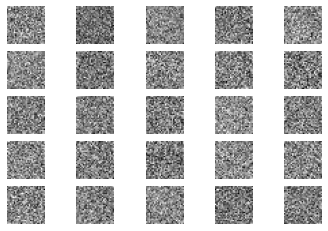

1 [D loss: 0.417316, acc.: 60.16%] [G loss: 0.515591]
2 [D loss: 0.392837, acc.: 62.50%] [G loss: 0.504426]
3 [D loss: 0.375243, acc.: 67.19%] [G loss: 0.573290]
4 [D loss: 0.369361, acc.: 68.75%] [G loss: 0.637851]
5 [D loss: 0.338092, acc.: 82.03%] [G loss: 0.749148]
6 [D loss: 0.331946, acc.: 80.47%] [G loss: 0.836996]
7 [D loss: 0.271557, acc.: 95.31%] [G loss: 1.021229]
8 [D loss: 0.247872, acc.: 96.09%] [G loss: 1.208143]
9 [D loss: 0.204961, acc.: 98.44%] [G loss: 1.284283]
10 [D loss: 0.180451, acc.: 100.00%] [G loss: 1.451848]
11 [D loss: 0.157653, acc.: 100.00%] [G loss: 1.549928]
12 [D loss: 0.137201, acc.: 100.00%] [G loss: 1.705282]
13 [D loss: 0.115808, acc.: 100.00%] [G loss: 1.888796]
14 [D loss: 0.102349, acc.: 100.00%] [G loss: 1.977388]
15 [D loss: 0.091984, acc.: 100.00%] [G loss: 2.081772]
16 [D loss: 0.088021, acc.: 100.00%] [G loss: 2.140802]
17 [D loss: 0.071791, acc.: 100.00%] [G loss: 2.273210]
18 [D loss: 0.070089, acc.: 100.00%] [G loss: 2.374583]
19 [D loss

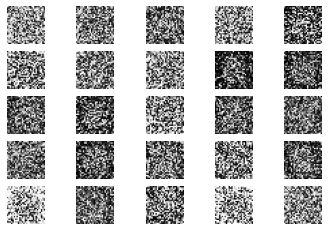

101 [D loss: 0.048028, acc.: 99.22%] [G loss: 4.184372]
102 [D loss: 0.062794, acc.: 97.66%] [G loss: 4.637122]
103 [D loss: 0.065675, acc.: 99.22%] [G loss: 4.148531]
104 [D loss: 0.098541, acc.: 95.31%] [G loss: 4.021859]
105 [D loss: 0.079667, acc.: 98.44%] [G loss: 3.867998]
106 [D loss: 0.145234, acc.: 95.31%] [G loss: 3.880707]
107 [D loss: 0.147452, acc.: 94.53%] [G loss: 3.656658]
108 [D loss: 0.298630, acc.: 85.94%] [G loss: 4.279197]
109 [D loss: 1.398060, acc.: 53.91%] [G loss: 3.890954]
110 [D loss: 0.339035, acc.: 85.16%] [G loss: 1.988357]
111 [D loss: 0.196808, acc.: 88.28%] [G loss: 3.021477]
112 [D loss: 0.125052, acc.: 92.97%] [G loss: 3.072895]
113 [D loss: 0.112657, acc.: 96.88%] [G loss: 3.411046]
114 [D loss: 0.064677, acc.: 99.22%] [G loss: 3.617555]
115 [D loss: 0.136959, acc.: 95.31%] [G loss: 3.617514]
116 [D loss: 0.322797, acc.: 86.72%] [G loss: 3.174505]
117 [D loss: 0.062136, acc.: 99.22%] [G loss: 3.343053]
118 [D loss: 0.112629, acc.: 95.31%] [G loss: 3.

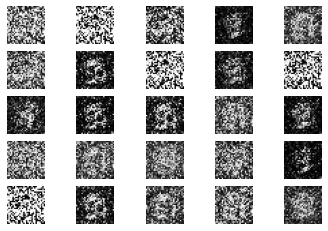

201 [D loss: 0.606830, acc.: 69.53%] [G loss: 2.003360]
202 [D loss: 0.250993, acc.: 88.28%] [G loss: 2.923649]
203 [D loss: 0.652542, acc.: 60.94%] [G loss: 1.926900]
204 [D loss: 0.226711, acc.: 93.75%] [G loss: 2.732964]
205 [D loss: 0.519344, acc.: 68.75%] [G loss: 2.009602]
206 [D loss: 0.233570, acc.: 91.41%] [G loss: 2.853237]
207 [D loss: 0.671813, acc.: 68.75%] [G loss: 1.912997]
208 [D loss: 0.264192, acc.: 88.28%] [G loss: 2.905555]
209 [D loss: 0.571282, acc.: 68.75%] [G loss: 2.309211]
210 [D loss: 0.262472, acc.: 89.06%] [G loss: 2.723070]
211 [D loss: 0.738784, acc.: 63.28%] [G loss: 1.894017]
212 [D loss: 0.258003, acc.: 88.28%] [G loss: 2.613523]
213 [D loss: 0.868699, acc.: 55.47%] [G loss: 1.176416]
214 [D loss: 0.313225, acc.: 83.59%] [G loss: 2.635209]
215 [D loss: 0.309816, acc.: 93.75%] [G loss: 2.601426]
216 [D loss: 0.428097, acc.: 78.12%] [G loss: 2.217205]
217 [D loss: 0.393687, acc.: 81.25%] [G loss: 2.835200]
218 [D loss: 0.518229, acc.: 69.53%] [G loss: 2.

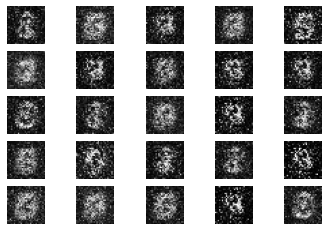

301 [D loss: 0.704511, acc.: 43.75%] [G loss: 0.651198]
302 [D loss: 0.740744, acc.: 40.62%] [G loss: 0.624620]
303 [D loss: 0.688281, acc.: 46.88%] [G loss: 0.646611]
304 [D loss: 0.702301, acc.: 43.75%] [G loss: 0.643000]
305 [D loss: 0.691946, acc.: 47.66%] [G loss: 0.628244]
306 [D loss: 0.714333, acc.: 43.75%] [G loss: 0.618370]
307 [D loss: 0.700984, acc.: 46.09%] [G loss: 0.625910]
308 [D loss: 0.701050, acc.: 46.09%] [G loss: 0.624931]
309 [D loss: 0.688820, acc.: 46.09%] [G loss: 0.626809]
310 [D loss: 0.703267, acc.: 43.75%] [G loss: 0.631529]
311 [D loss: 0.696998, acc.: 45.31%] [G loss: 0.642079]
312 [D loss: 0.682714, acc.: 45.31%] [G loss: 0.636285]
313 [D loss: 0.697764, acc.: 46.09%] [G loss: 0.640653]
314 [D loss: 0.701188, acc.: 46.09%] [G loss: 0.633783]
315 [D loss: 0.697985, acc.: 42.97%] [G loss: 0.632575]
316 [D loss: 0.702700, acc.: 47.66%] [G loss: 0.616538]
317 [D loss: 0.693807, acc.: 44.53%] [G loss: 0.620351]
318 [D loss: 0.679842, acc.: 46.88%] [G loss: 0.

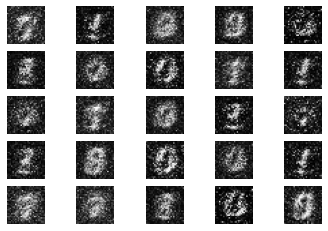

401 [D loss: 0.670904, acc.: 50.78%] [G loss: 0.685387]
402 [D loss: 0.665205, acc.: 52.34%] [G loss: 0.675783]
403 [D loss: 0.657779, acc.: 49.22%] [G loss: 0.655371]
404 [D loss: 0.690540, acc.: 46.09%] [G loss: 0.667123]
405 [D loss: 0.661187, acc.: 47.66%] [G loss: 0.678482]
406 [D loss: 0.666592, acc.: 49.22%] [G loss: 0.674140]
407 [D loss: 0.665458, acc.: 48.44%] [G loss: 0.690501]
408 [D loss: 0.660864, acc.: 48.44%] [G loss: 0.684880]
409 [D loss: 0.663005, acc.: 46.09%] [G loss: 0.679422]
410 [D loss: 0.644937, acc.: 48.44%] [G loss: 0.680447]
411 [D loss: 0.662659, acc.: 51.56%] [G loss: 0.670522]
412 [D loss: 0.669912, acc.: 48.44%] [G loss: 0.668969]
413 [D loss: 0.652276, acc.: 47.66%] [G loss: 0.688947]
414 [D loss: 0.661867, acc.: 46.88%] [G loss: 0.682192]
415 [D loss: 0.644053, acc.: 48.44%] [G loss: 0.688113]
416 [D loss: 0.656792, acc.: 47.66%] [G loss: 0.688147]
417 [D loss: 0.649633, acc.: 50.00%] [G loss: 0.680687]
418 [D loss: 0.647954, acc.: 49.22%] [G loss: 0.

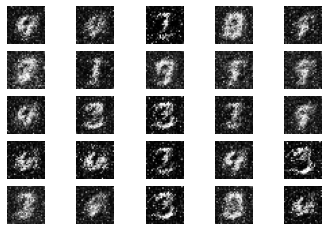

501 [D loss: 0.665452, acc.: 53.91%] [G loss: 0.692770]
502 [D loss: 0.691511, acc.: 43.75%] [G loss: 0.714871]
503 [D loss: 0.685863, acc.: 51.56%] [G loss: 0.707156]
504 [D loss: 0.669222, acc.: 57.03%] [G loss: 0.692693]
505 [D loss: 0.669971, acc.: 56.25%] [G loss: 0.688452]
506 [D loss: 0.679675, acc.: 56.25%] [G loss: 0.693177]
507 [D loss: 0.677098, acc.: 57.03%] [G loss: 0.707089]
508 [D loss: 0.651572, acc.: 68.75%] [G loss: 0.712236]
509 [D loss: 0.670920, acc.: 57.03%] [G loss: 0.713991]
510 [D loss: 0.677520, acc.: 55.47%] [G loss: 0.698908]
511 [D loss: 0.680512, acc.: 52.34%] [G loss: 0.694566]
512 [D loss: 0.665217, acc.: 53.91%] [G loss: 0.700086]
513 [D loss: 0.658816, acc.: 57.03%] [G loss: 0.703014]
514 [D loss: 0.650368, acc.: 57.81%] [G loss: 0.692387]
515 [D loss: 0.670096, acc.: 51.56%] [G loss: 0.683380]
516 [D loss: 0.665254, acc.: 54.69%] [G loss: 0.696466]
517 [D loss: 0.661033, acc.: 55.47%] [G loss: 0.706350]
518 [D loss: 0.653251, acc.: 53.91%] [G loss: 0.

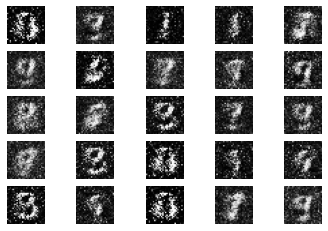

601 [D loss: 0.638722, acc.: 59.38%] [G loss: 0.738376]
602 [D loss: 0.641035, acc.: 59.38%] [G loss: 0.754136]
603 [D loss: 0.628323, acc.: 67.19%] [G loss: 0.775010]
604 [D loss: 0.647672, acc.: 60.16%] [G loss: 0.763350]
605 [D loss: 0.632610, acc.: 66.41%] [G loss: 0.750478]
606 [D loss: 0.631216, acc.: 63.28%] [G loss: 0.764883]
607 [D loss: 0.644088, acc.: 61.72%] [G loss: 0.778082]
608 [D loss: 0.637926, acc.: 60.16%] [G loss: 0.772131]
609 [D loss: 0.622006, acc.: 71.88%] [G loss: 0.772570]
610 [D loss: 0.654598, acc.: 61.72%] [G loss: 0.775519]
611 [D loss: 0.639940, acc.: 64.84%] [G loss: 0.767877]
612 [D loss: 0.640765, acc.: 64.06%] [G loss: 0.761561]
613 [D loss: 0.648149, acc.: 62.50%] [G loss: 0.755118]
614 [D loss: 0.675262, acc.: 51.56%] [G loss: 0.753483]
615 [D loss: 0.631441, acc.: 61.72%] [G loss: 0.776759]
616 [D loss: 0.661850, acc.: 57.03%] [G loss: 0.714368]
617 [D loss: 0.644729, acc.: 60.16%] [G loss: 0.712312]
618 [D loss: 0.630163, acc.: 67.97%] [G loss: 0.

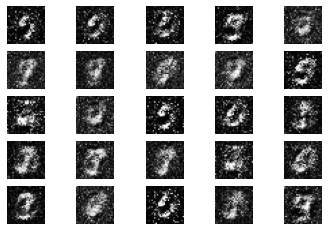

701 [D loss: 0.611651, acc.: 61.72%] [G loss: 0.807631]
702 [D loss: 0.616653, acc.: 62.50%] [G loss: 0.815060]
703 [D loss: 0.628654, acc.: 64.06%] [G loss: 0.784685]
704 [D loss: 0.623765, acc.: 58.59%] [G loss: 0.793203]
705 [D loss: 0.631309, acc.: 62.50%] [G loss: 0.843278]
706 [D loss: 0.644092, acc.: 62.50%] [G loss: 0.822601]
707 [D loss: 0.675415, acc.: 53.91%] [G loss: 0.796671]
708 [D loss: 0.628207, acc.: 65.62%] [G loss: 0.777268]
709 [D loss: 0.655086, acc.: 57.81%] [G loss: 0.787315]
710 [D loss: 0.646975, acc.: 57.03%] [G loss: 0.764446]
711 [D loss: 0.669734, acc.: 56.25%] [G loss: 0.793752]
712 [D loss: 0.654368, acc.: 51.56%] [G loss: 0.774388]
713 [D loss: 0.661654, acc.: 55.47%] [G loss: 0.755840]
714 [D loss: 0.643141, acc.: 60.94%] [G loss: 0.786251]
715 [D loss: 0.647328, acc.: 60.16%] [G loss: 0.871558]
716 [D loss: 0.608748, acc.: 73.44%] [G loss: 0.851438]
717 [D loss: 0.649993, acc.: 67.19%] [G loss: 0.846127]
718 [D loss: 0.667861, acc.: 57.81%] [G loss: 0.

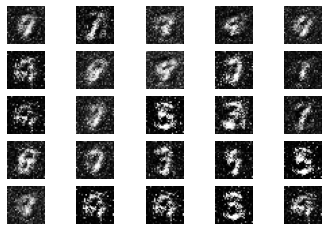

801 [D loss: 0.616738, acc.: 73.44%] [G loss: 0.822123]
802 [D loss: 0.602654, acc.: 68.75%] [G loss: 0.836029]
803 [D loss: 0.588077, acc.: 76.56%] [G loss: 0.837804]
804 [D loss: 0.596319, acc.: 68.75%] [G loss: 0.824069]
805 [D loss: 0.599095, acc.: 75.00%] [G loss: 0.809764]
806 [D loss: 0.621833, acc.: 64.06%] [G loss: 0.839181]
807 [D loss: 0.588622, acc.: 75.78%] [G loss: 0.832805]
808 [D loss: 0.590297, acc.: 74.22%] [G loss: 0.814654]
809 [D loss: 0.603746, acc.: 69.53%] [G loss: 0.808343]
810 [D loss: 0.571936, acc.: 74.22%] [G loss: 0.833550]
811 [D loss: 0.592414, acc.: 69.53%] [G loss: 0.844493]
812 [D loss: 0.564502, acc.: 82.81%] [G loss: 0.831516]
813 [D loss: 0.594082, acc.: 72.66%] [G loss: 0.823528]
814 [D loss: 0.607800, acc.: 66.41%] [G loss: 0.838085]
815 [D loss: 0.584843, acc.: 71.88%] [G loss: 0.822735]
816 [D loss: 0.597869, acc.: 67.97%] [G loss: 0.801559]
817 [D loss: 0.602833, acc.: 72.66%] [G loss: 0.800593]
818 [D loss: 0.619276, acc.: 65.62%] [G loss: 0.

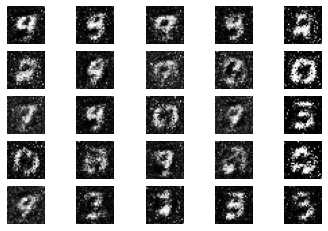

901 [D loss: 0.633372, acc.: 64.06%] [G loss: 0.808129]
902 [D loss: 0.564204, acc.: 73.44%] [G loss: 0.846107]
903 [D loss: 0.649921, acc.: 65.62%] [G loss: 0.861947]
904 [D loss: 0.616338, acc.: 67.19%] [G loss: 0.831053]
905 [D loss: 0.647124, acc.: 58.59%] [G loss: 0.840220]
906 [D loss: 0.623263, acc.: 64.06%] [G loss: 0.855867]
907 [D loss: 0.627510, acc.: 67.97%] [G loss: 0.835460]
908 [D loss: 0.639404, acc.: 63.28%] [G loss: 0.842979]
909 [D loss: 0.660931, acc.: 57.81%] [G loss: 0.852321]
910 [D loss: 0.649376, acc.: 53.12%] [G loss: 0.825535]
911 [D loss: 0.643425, acc.: 64.06%] [G loss: 0.819258]
912 [D loss: 0.634148, acc.: 60.94%] [G loss: 0.817511]
913 [D loss: 0.669547, acc.: 56.25%] [G loss: 0.834810]
914 [D loss: 0.654893, acc.: 63.28%] [G loss: 0.831405]
915 [D loss: 0.673701, acc.: 52.34%] [G loss: 0.816649]
916 [D loss: 0.663467, acc.: 54.69%] [G loss: 0.803315]
917 [D loss: 0.679196, acc.: 51.56%] [G loss: 0.806983]
918 [D loss: 0.640736, acc.: 60.16%] [G loss: 0.

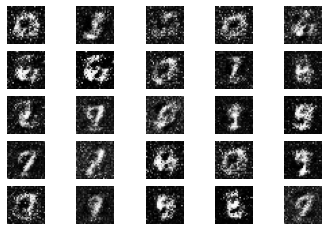

1001 [D loss: 0.621631, acc.: 71.88%] [G loss: 0.811611]
1002 [D loss: 0.608188, acc.: 67.97%] [G loss: 0.814071]
1003 [D loss: 0.610087, acc.: 68.75%] [G loss: 0.835231]
1004 [D loss: 0.614584, acc.: 67.19%] [G loss: 0.834056]
1005 [D loss: 0.618349, acc.: 72.66%] [G loss: 0.826958]
1006 [D loss: 0.604019, acc.: 71.88%] [G loss: 0.824453]
1007 [D loss: 0.630074, acc.: 65.62%] [G loss: 0.777332]
1008 [D loss: 0.600665, acc.: 70.31%] [G loss: 0.827630]
1009 [D loss: 0.642283, acc.: 63.28%] [G loss: 0.823125]
1010 [D loss: 0.601904, acc.: 76.56%] [G loss: 0.842540]
1011 [D loss: 0.629095, acc.: 67.97%] [G loss: 0.825524]
1012 [D loss: 0.613755, acc.: 68.75%] [G loss: 0.867128]
1013 [D loss: 0.589799, acc.: 72.66%] [G loss: 0.826169]
1014 [D loss: 0.639449, acc.: 65.62%] [G loss: 0.827244]
1015 [D loss: 0.587542, acc.: 73.44%] [G loss: 0.822924]
1016 [D loss: 0.618662, acc.: 69.53%] [G loss: 0.841483]
1017 [D loss: 0.590814, acc.: 70.31%] [G loss: 0.858479]
1018 [D loss: 0.616621, acc.: 6

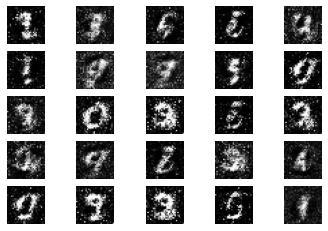

1101 [D loss: 0.632258, acc.: 67.97%] [G loss: 0.879118]
1102 [D loss: 0.605556, acc.: 73.44%] [G loss: 0.860136]
1103 [D loss: 0.601619, acc.: 70.31%] [G loss: 0.871398]
1104 [D loss: 0.601393, acc.: 69.53%] [G loss: 0.900579]
1105 [D loss: 0.604118, acc.: 69.53%] [G loss: 0.907149]
1106 [D loss: 0.614768, acc.: 64.06%] [G loss: 0.909128]
1107 [D loss: 0.609865, acc.: 63.28%] [G loss: 0.898462]
1108 [D loss: 0.633562, acc.: 59.38%] [G loss: 0.886910]
1109 [D loss: 0.618707, acc.: 66.41%] [G loss: 0.879574]
1110 [D loss: 0.612602, acc.: 67.19%] [G loss: 0.839200]
1111 [D loss: 0.611666, acc.: 71.88%] [G loss: 0.856822]
1112 [D loss: 0.615489, acc.: 65.62%] [G loss: 0.873180]
1113 [D loss: 0.592906, acc.: 75.00%] [G loss: 0.886806]
1114 [D loss: 0.591569, acc.: 75.00%] [G loss: 0.859721]
1115 [D loss: 0.583526, acc.: 75.78%] [G loss: 0.850128]
1116 [D loss: 0.586108, acc.: 72.66%] [G loss: 0.823461]
1117 [D loss: 0.600762, acc.: 71.88%] [G loss: 0.856435]
1118 [D loss: 0.584519, acc.: 7

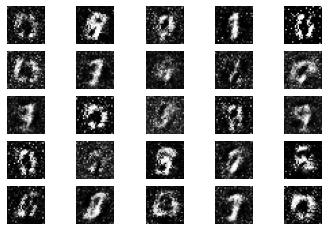

1201 [D loss: 0.612200, acc.: 67.19%] [G loss: 0.947307]
1202 [D loss: 0.585806, acc.: 69.53%] [G loss: 0.951086]
1203 [D loss: 0.582598, acc.: 71.09%] [G loss: 0.939655]
1204 [D loss: 0.608684, acc.: 68.75%] [G loss: 1.007475]
1205 [D loss: 0.599539, acc.: 70.31%] [G loss: 0.958224]
1206 [D loss: 0.602799, acc.: 65.62%] [G loss: 0.968992]
1207 [D loss: 0.586114, acc.: 70.31%] [G loss: 0.982682]
1208 [D loss: 0.591250, acc.: 70.31%] [G loss: 0.971834]
1209 [D loss: 0.623991, acc.: 65.62%] [G loss: 0.946704]
1210 [D loss: 0.601206, acc.: 64.84%] [G loss: 0.999622]
1211 [D loss: 0.647657, acc.: 59.38%] [G loss: 1.038596]
1212 [D loss: 0.647192, acc.: 64.06%] [G loss: 0.973002]
1213 [D loss: 0.590642, acc.: 75.78%] [G loss: 0.924341]
1214 [D loss: 0.623133, acc.: 68.75%] [G loss: 0.933669]
1215 [D loss: 0.598549, acc.: 68.75%] [G loss: 0.967866]
1216 [D loss: 0.616879, acc.: 67.19%] [G loss: 0.953217]
1217 [D loss: 0.599552, acc.: 71.09%] [G loss: 0.936430]
1218 [D loss: 0.616540, acc.: 6

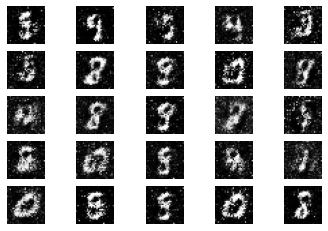

1301 [D loss: 0.563735, acc.: 78.91%] [G loss: 0.936463]
1302 [D loss: 0.576993, acc.: 72.66%] [G loss: 0.930530]
1303 [D loss: 0.577932, acc.: 75.00%] [G loss: 0.958951]
1304 [D loss: 0.585828, acc.: 74.22%] [G loss: 0.898237]
1305 [D loss: 0.589164, acc.: 72.66%] [G loss: 0.908217]
1306 [D loss: 0.579759, acc.: 76.56%] [G loss: 0.960033]
1307 [D loss: 0.568508, acc.: 73.44%] [G loss: 0.929711]
1308 [D loss: 0.573418, acc.: 76.56%] [G loss: 0.925011]
1309 [D loss: 0.551273, acc.: 80.47%] [G loss: 0.911850]
1310 [D loss: 0.579047, acc.: 71.09%] [G loss: 0.949574]
1311 [D loss: 0.532895, acc.: 82.03%] [G loss: 0.945297]
1312 [D loss: 0.559012, acc.: 79.69%] [G loss: 0.976211]
1313 [D loss: 0.584192, acc.: 69.53%] [G loss: 0.940495]
1314 [D loss: 0.563130, acc.: 76.56%] [G loss: 0.976507]
1315 [D loss: 0.587550, acc.: 69.53%] [G loss: 0.992361]
1316 [D loss: 0.583827, acc.: 73.44%] [G loss: 0.942408]
1317 [D loss: 0.544020, acc.: 85.16%] [G loss: 0.945288]
1318 [D loss: 0.593407, acc.: 6

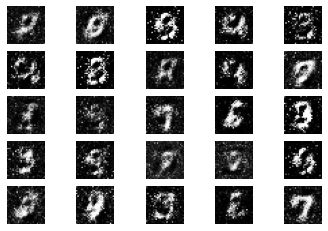

1401 [D loss: 0.593215, acc.: 73.44%] [G loss: 0.970803]
1402 [D loss: 0.568985, acc.: 75.78%] [G loss: 0.943220]
1403 [D loss: 0.564246, acc.: 79.69%] [G loss: 0.979434]
1404 [D loss: 0.581994, acc.: 81.25%] [G loss: 0.993629]
1405 [D loss: 0.569353, acc.: 71.88%] [G loss: 1.012695]
1406 [D loss: 0.582141, acc.: 75.00%] [G loss: 0.941444]
1407 [D loss: 0.585956, acc.: 73.44%] [G loss: 0.976316]
1408 [D loss: 0.554455, acc.: 79.69%] [G loss: 1.033479]
1409 [D loss: 0.582145, acc.: 74.22%] [G loss: 0.971193]
1410 [D loss: 0.605194, acc.: 69.53%] [G loss: 0.970635]
1411 [D loss: 0.554645, acc.: 72.66%] [G loss: 1.021927]
1412 [D loss: 0.550451, acc.: 79.69%] [G loss: 1.034943]
1413 [D loss: 0.586684, acc.: 71.88%] [G loss: 0.994278]
1414 [D loss: 0.532895, acc.: 82.81%] [G loss: 1.039049]
1415 [D loss: 0.610551, acc.: 67.19%] [G loss: 0.998327]
1416 [D loss: 0.583443, acc.: 75.00%] [G loss: 0.980787]
1417 [D loss: 0.587062, acc.: 67.19%] [G loss: 1.028056]
1418 [D loss: 0.569901, acc.: 7

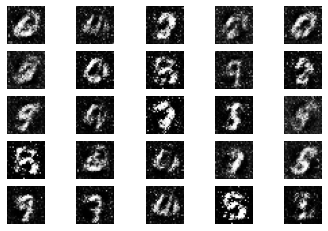

1501 [D loss: 0.533257, acc.: 82.03%] [G loss: 0.994168]
1502 [D loss: 0.594999, acc.: 70.31%] [G loss: 1.006956]
1503 [D loss: 0.567748, acc.: 79.69%] [G loss: 0.977981]
1504 [D loss: 0.571727, acc.: 77.34%] [G loss: 0.967485]
1505 [D loss: 0.562071, acc.: 71.88%] [G loss: 1.030925]
1506 [D loss: 0.548297, acc.: 82.03%] [G loss: 1.033201]
1507 [D loss: 0.569160, acc.: 73.44%] [G loss: 0.985977]
1508 [D loss: 0.556240, acc.: 75.00%] [G loss: 0.989934]
1509 [D loss: 0.526901, acc.: 82.03%] [G loss: 1.016528]
1510 [D loss: 0.549191, acc.: 78.91%] [G loss: 1.035011]
1511 [D loss: 0.521931, acc.: 82.81%] [G loss: 1.048179]
1512 [D loss: 0.539935, acc.: 76.56%] [G loss: 1.071583]
1513 [D loss: 0.549489, acc.: 77.34%] [G loss: 1.057366]
1514 [D loss: 0.550821, acc.: 81.25%] [G loss: 1.031498]
1515 [D loss: 0.547956, acc.: 81.25%] [G loss: 1.029465]
1516 [D loss: 0.561138, acc.: 75.00%] [G loss: 1.053511]
1517 [D loss: 0.540670, acc.: 81.25%] [G loss: 1.052118]
1518 [D loss: 0.558982, acc.: 8

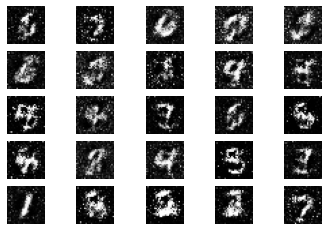

1601 [D loss: 0.538421, acc.: 79.69%] [G loss: 0.987374]
1602 [D loss: 0.548518, acc.: 75.78%] [G loss: 1.042267]
1603 [D loss: 0.554673, acc.: 79.69%] [G loss: 0.960801]
1604 [D loss: 0.544714, acc.: 78.12%] [G loss: 0.972946]
1605 [D loss: 0.569081, acc.: 73.44%] [G loss: 1.018254]
1606 [D loss: 0.528024, acc.: 78.91%] [G loss: 1.030076]
1607 [D loss: 0.576264, acc.: 71.88%] [G loss: 1.109157]
1608 [D loss: 0.578969, acc.: 72.66%] [G loss: 1.127420]
1609 [D loss: 0.542951, acc.: 75.00%] [G loss: 1.026662]
1610 [D loss: 0.571384, acc.: 71.09%] [G loss: 1.076366]
1611 [D loss: 0.552884, acc.: 74.22%] [G loss: 1.025207]
1612 [D loss: 0.568109, acc.: 74.22%] [G loss: 0.991188]
1613 [D loss: 0.593833, acc.: 70.31%] [G loss: 0.985369]
1614 [D loss: 0.587838, acc.: 70.31%] [G loss: 0.997477]
1615 [D loss: 0.539306, acc.: 77.34%] [G loss: 0.988759]
1616 [D loss: 0.565487, acc.: 75.00%] [G loss: 1.061338]
1617 [D loss: 0.576910, acc.: 71.09%] [G loss: 0.996279]
1618 [D loss: 0.543498, acc.: 7

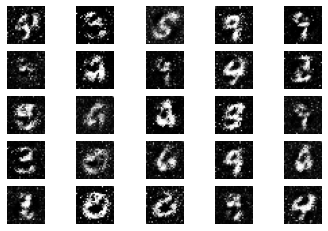

1701 [D loss: 0.534055, acc.: 74.22%] [G loss: 1.012731]
1702 [D loss: 0.606059, acc.: 71.09%] [G loss: 0.982466]
1703 [D loss: 0.571602, acc.: 73.44%] [G loss: 1.005446]
1704 [D loss: 0.558497, acc.: 71.09%] [G loss: 1.001077]
1705 [D loss: 0.589093, acc.: 68.75%] [G loss: 0.977946]
1706 [D loss: 0.587406, acc.: 74.22%] [G loss: 0.954250]
1707 [D loss: 0.571363, acc.: 71.88%] [G loss: 1.007587]
1708 [D loss: 0.577796, acc.: 74.22%] [G loss: 1.006774]
1709 [D loss: 0.560158, acc.: 74.22%] [G loss: 1.030408]
1710 [D loss: 0.556196, acc.: 72.66%] [G loss: 1.000048]
1711 [D loss: 0.595606, acc.: 71.88%] [G loss: 0.981763]
1712 [D loss: 0.577845, acc.: 67.97%] [G loss: 1.009318]
1713 [D loss: 0.578385, acc.: 73.44%] [G loss: 1.019607]
1714 [D loss: 0.551642, acc.: 73.44%] [G loss: 1.008593]
1715 [D loss: 0.584041, acc.: 68.75%] [G loss: 0.987109]
1716 [D loss: 0.603421, acc.: 64.06%] [G loss: 0.977156]
1717 [D loss: 0.590239, acc.: 72.66%] [G loss: 0.996222]
1718 [D loss: 0.584026, acc.: 7

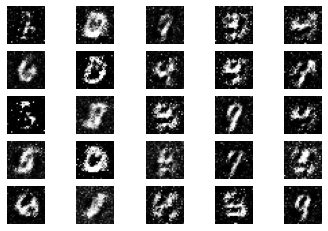

1801 [D loss: 0.594022, acc.: 72.66%] [G loss: 0.955239]
1802 [D loss: 0.534776, acc.: 78.91%] [G loss: 0.958347]
1803 [D loss: 0.532322, acc.: 75.78%] [G loss: 1.004693]
1804 [D loss: 0.527612, acc.: 80.47%] [G loss: 0.993707]
1805 [D loss: 0.591376, acc.: 68.75%] [G loss: 0.996681]
1806 [D loss: 0.540075, acc.: 74.22%] [G loss: 1.051103]
1807 [D loss: 0.572724, acc.: 70.31%] [G loss: 1.052280]
1808 [D loss: 0.551950, acc.: 68.75%] [G loss: 1.068731]
1809 [D loss: 0.580125, acc.: 69.53%] [G loss: 0.988621]
1810 [D loss: 0.575919, acc.: 76.56%] [G loss: 1.016086]
1811 [D loss: 0.540293, acc.: 77.34%] [G loss: 1.004902]
1812 [D loss: 0.533444, acc.: 80.47%] [G loss: 1.030765]
1813 [D loss: 0.578468, acc.: 70.31%] [G loss: 0.962383]
1814 [D loss: 0.562551, acc.: 67.97%] [G loss: 1.008665]
1815 [D loss: 0.493496, acc.: 80.47%] [G loss: 1.030086]
1816 [D loss: 0.493823, acc.: 78.12%] [G loss: 1.047733]
1817 [D loss: 0.587463, acc.: 68.75%] [G loss: 1.028796]
1818 [D loss: 0.536400, acc.: 7

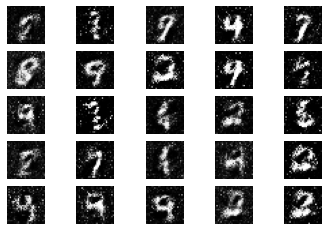

1901 [D loss: 0.590735, acc.: 72.66%] [G loss: 1.060735]
1902 [D loss: 0.539299, acc.: 80.47%] [G loss: 1.030548]
1903 [D loss: 0.593407, acc.: 67.97%] [G loss: 0.995724]
1904 [D loss: 0.617237, acc.: 66.41%] [G loss: 0.957265]
1905 [D loss: 0.540111, acc.: 75.00%] [G loss: 0.987734]
1906 [D loss: 0.581792, acc.: 68.75%] [G loss: 0.970255]
1907 [D loss: 0.579262, acc.: 67.19%] [G loss: 1.019663]
1908 [D loss: 0.516739, acc.: 85.16%] [G loss: 1.024365]
1909 [D loss: 0.536354, acc.: 72.66%] [G loss: 0.986829]
1910 [D loss: 0.570329, acc.: 78.91%] [G loss: 0.957591]
1911 [D loss: 0.567728, acc.: 74.22%] [G loss: 1.010976]
1912 [D loss: 0.583912, acc.: 74.22%] [G loss: 1.027518]
1913 [D loss: 0.564517, acc.: 72.66%] [G loss: 1.019464]
1914 [D loss: 0.552670, acc.: 76.56%] [G loss: 1.052323]
1915 [D loss: 0.573072, acc.: 76.56%] [G loss: 1.010036]
1916 [D loss: 0.522092, acc.: 82.03%] [G loss: 1.103759]
1917 [D loss: 0.604996, acc.: 70.31%] [G loss: 1.087054]
1918 [D loss: 0.513498, acc.: 8

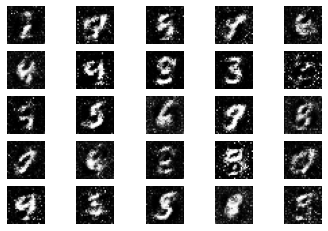

2001 [D loss: 0.566358, acc.: 72.66%] [G loss: 1.033145]
2002 [D loss: 0.583388, acc.: 67.97%] [G loss: 1.081810]
2003 [D loss: 0.573287, acc.: 68.75%] [G loss: 1.070153]
2004 [D loss: 0.563316, acc.: 75.78%] [G loss: 1.039519]
2005 [D loss: 0.583090, acc.: 67.97%] [G loss: 1.033715]
2006 [D loss: 0.600865, acc.: 68.75%] [G loss: 0.965996]
2007 [D loss: 0.526959, acc.: 80.47%] [G loss: 1.017691]
2008 [D loss: 0.525581, acc.: 82.81%] [G loss: 1.056399]
2009 [D loss: 0.582132, acc.: 67.19%] [G loss: 1.037927]
2010 [D loss: 0.513879, acc.: 79.69%] [G loss: 1.022953]
2011 [D loss: 0.534089, acc.: 76.56%] [G loss: 1.096874]
2012 [D loss: 0.582812, acc.: 65.62%] [G loss: 1.032080]
2013 [D loss: 0.575022, acc.: 74.22%] [G loss: 1.026265]
2014 [D loss: 0.580650, acc.: 71.88%] [G loss: 1.121651]
2015 [D loss: 0.520683, acc.: 83.59%] [G loss: 1.092999]
2016 [D loss: 0.571383, acc.: 72.66%] [G loss: 1.006330]
2017 [D loss: 0.545686, acc.: 72.66%] [G loss: 1.053746]
2018 [D loss: 0.538660, acc.: 7

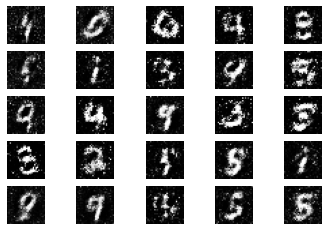

2101 [D loss: 0.552855, acc.: 75.00%] [G loss: 0.962001]
2102 [D loss: 0.572583, acc.: 68.75%] [G loss: 0.970121]
2103 [D loss: 0.615452, acc.: 69.53%] [G loss: 1.019359]
2104 [D loss: 0.553985, acc.: 74.22%] [G loss: 0.980889]
2105 [D loss: 0.579748, acc.: 68.75%] [G loss: 1.027934]
2106 [D loss: 0.583384, acc.: 71.09%] [G loss: 1.047250]
2107 [D loss: 0.539716, acc.: 78.91%] [G loss: 1.028017]
2108 [D loss: 0.529644, acc.: 78.12%] [G loss: 0.989039]
2109 [D loss: 0.574032, acc.: 67.97%] [G loss: 0.997431]
2110 [D loss: 0.551210, acc.: 77.34%] [G loss: 1.004868]
2111 [D loss: 0.574769, acc.: 67.19%] [G loss: 1.045742]
2112 [D loss: 0.572255, acc.: 70.31%] [G loss: 0.972204]
2113 [D loss: 0.602414, acc.: 68.75%] [G loss: 1.003333]
2114 [D loss: 0.580251, acc.: 72.66%] [G loss: 0.998186]
2115 [D loss: 0.608894, acc.: 63.28%] [G loss: 1.054435]
2116 [D loss: 0.577046, acc.: 72.66%] [G loss: 1.013395]
2117 [D loss: 0.557382, acc.: 77.34%] [G loss: 1.003053]
2118 [D loss: 0.602920, acc.: 6

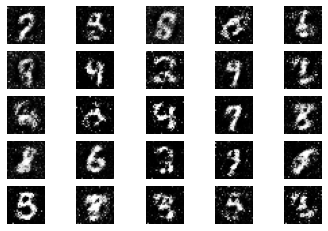

2201 [D loss: 0.613412, acc.: 71.09%] [G loss: 0.959135]
2202 [D loss: 0.581389, acc.: 71.09%] [G loss: 0.959100]
2203 [D loss: 0.560683, acc.: 73.44%] [G loss: 1.024078]
2204 [D loss: 0.621287, acc.: 69.53%] [G loss: 1.087559]
2205 [D loss: 0.585326, acc.: 75.78%] [G loss: 1.018492]
2206 [D loss: 0.602775, acc.: 67.19%] [G loss: 1.030689]
2207 [D loss: 0.599716, acc.: 69.53%] [G loss: 1.006889]
2208 [D loss: 0.612498, acc.: 66.41%] [G loss: 0.995473]
2209 [D loss: 0.624035, acc.: 64.06%] [G loss: 0.977745]
2210 [D loss: 0.643131, acc.: 58.59%] [G loss: 0.935846]
2211 [D loss: 0.601074, acc.: 68.75%] [G loss: 0.977629]
2212 [D loss: 0.589135, acc.: 68.75%] [G loss: 1.013505]
2213 [D loss: 0.574318, acc.: 75.78%] [G loss: 1.029589]
2214 [D loss: 0.582004, acc.: 76.56%] [G loss: 1.001524]
2215 [D loss: 0.589847, acc.: 68.75%] [G loss: 1.041035]
2216 [D loss: 0.605536, acc.: 70.31%] [G loss: 1.020202]
2217 [D loss: 0.623818, acc.: 62.50%] [G loss: 0.952759]
2218 [D loss: 0.597456, acc.: 7

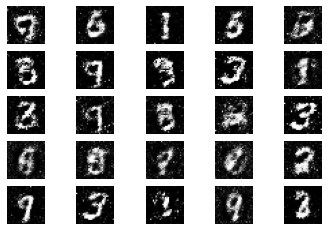

2301 [D loss: 0.609992, acc.: 62.50%] [G loss: 0.993092]
2302 [D loss: 0.593558, acc.: 69.53%] [G loss: 0.990841]
2303 [D loss: 0.542058, acc.: 73.44%] [G loss: 0.999556]
2304 [D loss: 0.602594, acc.: 67.97%] [G loss: 0.993230]
2305 [D loss: 0.564810, acc.: 75.78%] [G loss: 0.939172]
2306 [D loss: 0.618159, acc.: 68.75%] [G loss: 0.956974]
2307 [D loss: 0.564182, acc.: 78.91%] [G loss: 0.985316]
2308 [D loss: 0.581291, acc.: 72.66%] [G loss: 0.987073]
2309 [D loss: 0.597227, acc.: 69.53%] [G loss: 0.974703]
2310 [D loss: 0.594950, acc.: 67.19%] [G loss: 0.965843]
2311 [D loss: 0.628566, acc.: 66.41%] [G loss: 0.973646]
2312 [D loss: 0.656833, acc.: 64.84%] [G loss: 0.969830]
2313 [D loss: 0.625390, acc.: 63.28%] [G loss: 1.024405]
2314 [D loss: 0.597049, acc.: 71.09%] [G loss: 0.936155]
2315 [D loss: 0.601830, acc.: 69.53%] [G loss: 0.897358]
2316 [D loss: 0.653828, acc.: 65.62%] [G loss: 0.972555]
2317 [D loss: 0.581309, acc.: 69.53%] [G loss: 1.013691]
2318 [D loss: 0.538613, acc.: 7

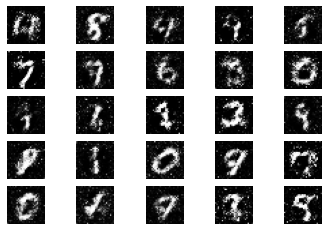

2401 [D loss: 0.578433, acc.: 75.78%] [G loss: 0.983484]
2402 [D loss: 0.594978, acc.: 68.75%] [G loss: 0.986900]
2403 [D loss: 0.636182, acc.: 58.59%] [G loss: 1.004463]
2404 [D loss: 0.608946, acc.: 71.09%] [G loss: 0.952361]
2405 [D loss: 0.589202, acc.: 71.09%] [G loss: 0.989345]
2406 [D loss: 0.608308, acc.: 67.19%] [G loss: 0.971531]
2407 [D loss: 0.624123, acc.: 64.06%] [G loss: 0.971890]
2408 [D loss: 0.579813, acc.: 72.66%] [G loss: 0.984111]
2409 [D loss: 0.594675, acc.: 67.19%] [G loss: 0.955965]
2410 [D loss: 0.593229, acc.: 65.62%] [G loss: 0.961670]
2411 [D loss: 0.634221, acc.: 63.28%] [G loss: 0.932336]
2412 [D loss: 0.630496, acc.: 68.75%] [G loss: 0.887370]
2413 [D loss: 0.604494, acc.: 71.09%] [G loss: 0.935067]
2414 [D loss: 0.618675, acc.: 67.19%] [G loss: 0.873619]
2415 [D loss: 0.574743, acc.: 70.31%] [G loss: 0.929539]
2416 [D loss: 0.627290, acc.: 64.84%] [G loss: 0.943497]
2417 [D loss: 0.609554, acc.: 64.84%] [G loss: 0.979560]
2418 [D loss: 0.667301, acc.: 6

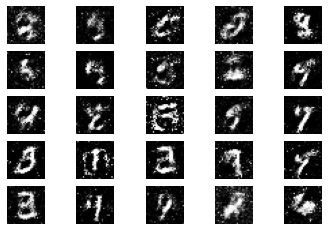

2501 [D loss: 0.584878, acc.: 70.31%] [G loss: 0.989956]
2502 [D loss: 0.607293, acc.: 65.62%] [G loss: 0.924869]
2503 [D loss: 0.584857, acc.: 65.62%] [G loss: 0.913173]
2504 [D loss: 0.582562, acc.: 66.41%] [G loss: 0.884641]
2505 [D loss: 0.611480, acc.: 64.84%] [G loss: 0.960662]
2506 [D loss: 0.626652, acc.: 65.62%] [G loss: 0.948227]
2507 [D loss: 0.609985, acc.: 70.31%] [G loss: 0.935652]
2508 [D loss: 0.577193, acc.: 74.22%] [G loss: 0.996419]
2509 [D loss: 0.606406, acc.: 69.53%] [G loss: 0.933137]
2510 [D loss: 0.591649, acc.: 75.00%] [G loss: 0.957380]
2511 [D loss: 0.600313, acc.: 67.19%] [G loss: 0.900468]
2512 [D loss: 0.609866, acc.: 68.75%] [G loss: 0.959295]
2513 [D loss: 0.600992, acc.: 68.75%] [G loss: 1.025154]
2514 [D loss: 0.652489, acc.: 58.59%] [G loss: 0.945337]
2515 [D loss: 0.633441, acc.: 67.19%] [G loss: 0.927764]
2516 [D loss: 0.644563, acc.: 67.19%] [G loss: 0.862618]
2517 [D loss: 0.617406, acc.: 64.84%] [G loss: 0.943882]
2518 [D loss: 0.599369, acc.: 7

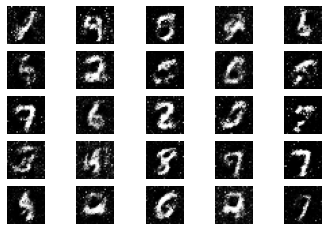

2601 [D loss: 0.638885, acc.: 63.28%] [G loss: 0.918612]
2602 [D loss: 0.590347, acc.: 73.44%] [G loss: 0.868780]
2603 [D loss: 0.630508, acc.: 67.19%] [G loss: 0.882290]
2604 [D loss: 0.621756, acc.: 67.97%] [G loss: 0.916654]
2605 [D loss: 0.636756, acc.: 64.06%] [G loss: 0.925163]
2606 [D loss: 0.594118, acc.: 73.44%] [G loss: 0.931953]
2607 [D loss: 0.600462, acc.: 68.75%] [G loss: 0.955698]
2608 [D loss: 0.586129, acc.: 69.53%] [G loss: 0.974508]
2609 [D loss: 0.651608, acc.: 64.84%] [G loss: 0.948929]
2610 [D loss: 0.569349, acc.: 75.78%] [G loss: 0.952055]
2611 [D loss: 0.580373, acc.: 72.66%] [G loss: 0.940041]
2612 [D loss: 0.628159, acc.: 67.19%] [G loss: 0.960324]
2613 [D loss: 0.583728, acc.: 70.31%] [G loss: 0.944755]
2614 [D loss: 0.574184, acc.: 76.56%] [G loss: 0.940539]
2615 [D loss: 0.583447, acc.: 77.34%] [G loss: 0.899249]
2616 [D loss: 0.554267, acc.: 77.34%] [G loss: 0.891483]
2617 [D loss: 0.597234, acc.: 71.88%] [G loss: 0.942546]
2618 [D loss: 0.562761, acc.: 7

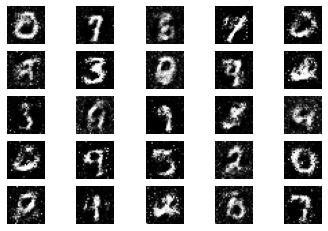

2701 [D loss: 0.658517, acc.: 62.50%] [G loss: 0.949319]
2702 [D loss: 0.596959, acc.: 64.06%] [G loss: 0.980441]
2703 [D loss: 0.633097, acc.: 64.06%] [G loss: 0.919494]
2704 [D loss: 0.552662, acc.: 78.12%] [G loss: 0.951719]
2705 [D loss: 0.651070, acc.: 65.62%] [G loss: 0.950325]
2706 [D loss: 0.632968, acc.: 63.28%] [G loss: 0.953818]
2707 [D loss: 0.528538, acc.: 82.03%] [G loss: 0.929070]
2708 [D loss: 0.586729, acc.: 71.09%] [G loss: 0.941824]
2709 [D loss: 0.612461, acc.: 60.16%] [G loss: 0.932731]
2710 [D loss: 0.584487, acc.: 71.09%] [G loss: 0.947385]
2711 [D loss: 0.630277, acc.: 62.50%] [G loss: 0.917794]
2712 [D loss: 0.615933, acc.: 68.75%] [G loss: 0.961561]
2713 [D loss: 0.590571, acc.: 69.53%] [G loss: 0.926204]
2714 [D loss: 0.618438, acc.: 67.19%] [G loss: 0.982230]
2715 [D loss: 0.625915, acc.: 62.50%] [G loss: 0.973482]
2716 [D loss: 0.625602, acc.: 64.84%] [G loss: 0.976512]
2717 [D loss: 0.586060, acc.: 71.09%] [G loss: 0.915973]
2718 [D loss: 0.633426, acc.: 6

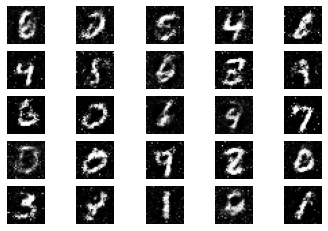

2801 [D loss: 0.594431, acc.: 67.97%] [G loss: 0.992421]
2802 [D loss: 0.651686, acc.: 64.84%] [G loss: 0.961205]
2803 [D loss: 0.608336, acc.: 64.06%] [G loss: 1.001906]
2804 [D loss: 0.598361, acc.: 68.75%] [G loss: 0.991248]
2805 [D loss: 0.619579, acc.: 67.97%] [G loss: 0.953655]
2806 [D loss: 0.618674, acc.: 68.75%] [G loss: 0.929135]
2807 [D loss: 0.585004, acc.: 75.78%] [G loss: 0.968862]
2808 [D loss: 0.602555, acc.: 70.31%] [G loss: 1.015846]
2809 [D loss: 0.612691, acc.: 64.84%] [G loss: 0.980636]
2810 [D loss: 0.610101, acc.: 63.28%] [G loss: 0.968140]
2811 [D loss: 0.630612, acc.: 65.62%] [G loss: 0.932365]
2812 [D loss: 0.603871, acc.: 67.19%] [G loss: 0.930733]
2813 [D loss: 0.641909, acc.: 64.06%] [G loss: 0.934924]
2814 [D loss: 0.593000, acc.: 71.09%] [G loss: 0.945686]
2815 [D loss: 0.618245, acc.: 67.19%] [G loss: 0.961744]
2816 [D loss: 0.661502, acc.: 63.28%] [G loss: 0.951006]
2817 [D loss: 0.619035, acc.: 67.19%] [G loss: 0.932602]
2818 [D loss: 0.600173, acc.: 7

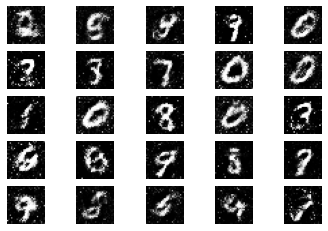

2901 [D loss: 0.613533, acc.: 70.31%] [G loss: 0.953052]
2902 [D loss: 0.570216, acc.: 72.66%] [G loss: 0.985591]
2903 [D loss: 0.605348, acc.: 68.75%] [G loss: 0.886378]
2904 [D loss: 0.608285, acc.: 66.41%] [G loss: 0.927636]
2905 [D loss: 0.631541, acc.: 64.84%] [G loss: 0.980393]
2906 [D loss: 0.578733, acc.: 70.31%] [G loss: 0.977474]
2907 [D loss: 0.605472, acc.: 71.88%] [G loss: 0.990771]
2908 [D loss: 0.652204, acc.: 62.50%] [G loss: 0.907535]
2909 [D loss: 0.615299, acc.: 70.31%] [G loss: 0.955703]
2910 [D loss: 0.633438, acc.: 59.38%] [G loss: 0.950561]
2911 [D loss: 0.596955, acc.: 66.41%] [G loss: 0.941987]
2912 [D loss: 0.587205, acc.: 70.31%] [G loss: 0.982397]
2913 [D loss: 0.616850, acc.: 64.06%] [G loss: 1.042056]
2914 [D loss: 0.565592, acc.: 74.22%] [G loss: 0.938674]
2915 [D loss: 0.669987, acc.: 56.25%] [G loss: 0.897003]
2916 [D loss: 0.611526, acc.: 66.41%] [G loss: 0.944374]
2917 [D loss: 0.618929, acc.: 68.75%] [G loss: 0.949844]
2918 [D loss: 0.567842, acc.: 7

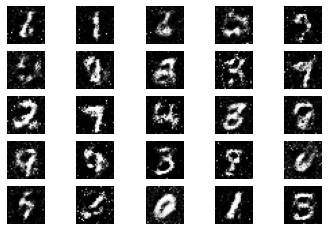

3001 [D loss: 0.605124, acc.: 68.75%] [G loss: 0.981396]
3002 [D loss: 0.605263, acc.: 65.62%] [G loss: 0.916835]
3003 [D loss: 0.595834, acc.: 71.88%] [G loss: 0.935998]
3004 [D loss: 0.636252, acc.: 62.50%] [G loss: 0.950050]
3005 [D loss: 0.620140, acc.: 70.31%] [G loss: 0.930267]
3006 [D loss: 0.591717, acc.: 66.41%] [G loss: 0.947349]
3007 [D loss: 0.614821, acc.: 65.62%] [G loss: 0.914069]
3008 [D loss: 0.582741, acc.: 68.75%] [G loss: 0.906496]
3009 [D loss: 0.625145, acc.: 62.50%] [G loss: 0.941612]
3010 [D loss: 0.636731, acc.: 62.50%] [G loss: 0.954782]
3011 [D loss: 0.606056, acc.: 69.53%] [G loss: 1.020863]
3012 [D loss: 0.628127, acc.: 65.62%] [G loss: 0.954716]
3013 [D loss: 0.604351, acc.: 66.41%] [G loss: 1.002754]
3014 [D loss: 0.578073, acc.: 67.97%] [G loss: 0.905363]
3015 [D loss: 0.638715, acc.: 63.28%] [G loss: 0.963677]
3016 [D loss: 0.575642, acc.: 67.97%] [G loss: 0.905136]
3017 [D loss: 0.595099, acc.: 71.88%] [G loss: 0.919421]
3018 [D loss: 0.614861, acc.: 6

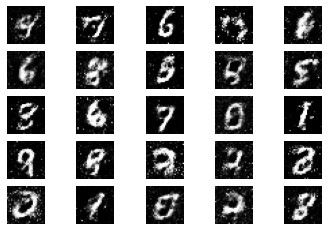

3101 [D loss: 0.588761, acc.: 69.53%] [G loss: 0.928122]
3102 [D loss: 0.584512, acc.: 68.75%] [G loss: 0.931078]
3103 [D loss: 0.567755, acc.: 74.22%] [G loss: 0.987937]
3104 [D loss: 0.586719, acc.: 74.22%] [G loss: 0.976292]
3105 [D loss: 0.604675, acc.: 65.62%] [G loss: 1.008263]
3106 [D loss: 0.601029, acc.: 70.31%] [G loss: 0.975495]
3107 [D loss: 0.633294, acc.: 61.72%] [G loss: 1.006356]
3108 [D loss: 0.563333, acc.: 75.00%] [G loss: 0.972301]
3109 [D loss: 0.573567, acc.: 73.44%] [G loss: 0.911858]
3110 [D loss: 0.638715, acc.: 64.06%] [G loss: 0.864186]
3111 [D loss: 0.616286, acc.: 67.19%] [G loss: 0.954880]
3112 [D loss: 0.605034, acc.: 64.06%] [G loss: 0.962033]
3113 [D loss: 0.590058, acc.: 71.88%] [G loss: 0.972542]
3114 [D loss: 0.612363, acc.: 68.75%] [G loss: 0.964279]
3115 [D loss: 0.575625, acc.: 77.34%] [G loss: 0.946490]
3116 [D loss: 0.613887, acc.: 69.53%] [G loss: 0.996902]
3117 [D loss: 0.620589, acc.: 67.97%] [G loss: 0.988064]
3118 [D loss: 0.568648, acc.: 7

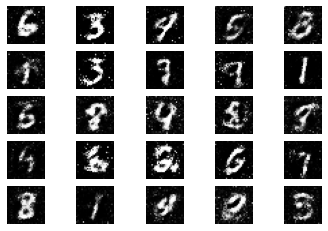

3201 [D loss: 0.642585, acc.: 60.16%] [G loss: 0.929290]
3202 [D loss: 0.620140, acc.: 67.97%] [G loss: 0.912470]
3203 [D loss: 0.654508, acc.: 61.72%] [G loss: 0.935209]
3204 [D loss: 0.630914, acc.: 64.84%] [G loss: 0.949958]
3205 [D loss: 0.608298, acc.: 70.31%] [G loss: 0.985726]
3206 [D loss: 0.594826, acc.: 70.31%] [G loss: 0.968659]
3207 [D loss: 0.593845, acc.: 76.56%] [G loss: 0.922636]
3208 [D loss: 0.586810, acc.: 72.66%] [G loss: 0.999401]
3209 [D loss: 0.591791, acc.: 69.53%] [G loss: 0.979856]
3210 [D loss: 0.601386, acc.: 69.53%] [G loss: 0.947031]
3211 [D loss: 0.615822, acc.: 67.97%] [G loss: 0.992694]
3212 [D loss: 0.565043, acc.: 76.56%] [G loss: 0.979605]
3213 [D loss: 0.602504, acc.: 74.22%] [G loss: 0.949938]
3214 [D loss: 0.603169, acc.: 68.75%] [G loss: 0.916249]
3215 [D loss: 0.578284, acc.: 72.66%] [G loss: 0.945353]
3216 [D loss: 0.603498, acc.: 67.97%] [G loss: 0.994005]
3217 [D loss: 0.572817, acc.: 73.44%] [G loss: 0.998614]
3218 [D loss: 0.590186, acc.: 6

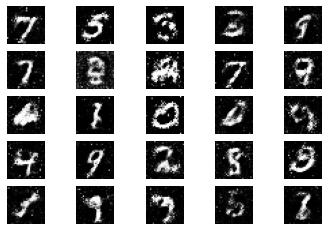

3301 [D loss: 0.580922, acc.: 75.00%] [G loss: 0.940406]
3302 [D loss: 0.608738, acc.: 65.62%] [G loss: 0.970296]
3303 [D loss: 0.634508, acc.: 64.06%] [G loss: 0.967011]
3304 [D loss: 0.576994, acc.: 72.66%] [G loss: 0.913642]
3305 [D loss: 0.641353, acc.: 64.06%] [G loss: 0.887220]
3306 [D loss: 0.618697, acc.: 71.09%] [G loss: 0.882151]
3307 [D loss: 0.636341, acc.: 64.06%] [G loss: 0.927658]
3308 [D loss: 0.613285, acc.: 69.53%] [G loss: 0.930059]
3309 [D loss: 0.582365, acc.: 72.66%] [G loss: 0.914888]
3310 [D loss: 0.581235, acc.: 71.88%] [G loss: 0.968016]
3311 [D loss: 0.639293, acc.: 60.16%] [G loss: 0.909588]
3312 [D loss: 0.657296, acc.: 64.06%] [G loss: 0.984688]
3313 [D loss: 0.588424, acc.: 67.97%] [G loss: 0.941699]
3314 [D loss: 0.644889, acc.: 64.84%] [G loss: 0.943152]
3315 [D loss: 0.644619, acc.: 64.06%] [G loss: 0.929387]
3316 [D loss: 0.663432, acc.: 60.16%] [G loss: 0.977424]
3317 [D loss: 0.636445, acc.: 64.84%] [G loss: 0.932123]
3318 [D loss: 0.565076, acc.: 7

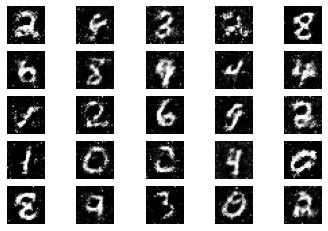

3401 [D loss: 0.619286, acc.: 62.50%] [G loss: 0.990028]
3402 [D loss: 0.594150, acc.: 64.06%] [G loss: 0.974415]
3403 [D loss: 0.593663, acc.: 75.00%] [G loss: 0.933527]
3404 [D loss: 0.614509, acc.: 70.31%] [G loss: 0.930786]
3405 [D loss: 0.620633, acc.: 69.53%] [G loss: 0.909119]
3406 [D loss: 0.597637, acc.: 67.19%] [G loss: 0.932964]
3407 [D loss: 0.610927, acc.: 69.53%] [G loss: 0.964537]
3408 [D loss: 0.609532, acc.: 67.19%] [G loss: 0.918434]
3409 [D loss: 0.577792, acc.: 71.09%] [G loss: 0.992471]
3410 [D loss: 0.584638, acc.: 69.53%] [G loss: 0.978577]
3411 [D loss: 0.664816, acc.: 63.28%] [G loss: 0.953146]
3412 [D loss: 0.666059, acc.: 57.81%] [G loss: 0.968011]
3413 [D loss: 0.611803, acc.: 67.97%] [G loss: 0.963065]
3414 [D loss: 0.621732, acc.: 67.97%] [G loss: 0.973767]
3415 [D loss: 0.659390, acc.: 64.06%] [G loss: 0.946890]
3416 [D loss: 0.610835, acc.: 61.72%] [G loss: 0.939416]
3417 [D loss: 0.646426, acc.: 61.72%] [G loss: 0.928703]
3418 [D loss: 0.623196, acc.: 7

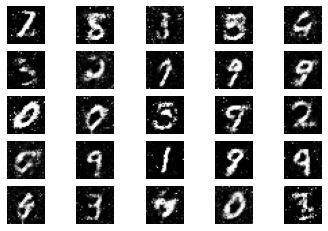

3501 [D loss: 0.668995, acc.: 62.50%] [G loss: 0.933766]
3502 [D loss: 0.587911, acc.: 73.44%] [G loss: 0.935427]
3503 [D loss: 0.605425, acc.: 66.41%] [G loss: 0.925059]
3504 [D loss: 0.627252, acc.: 61.72%] [G loss: 0.888547]
3505 [D loss: 0.587412, acc.: 76.56%] [G loss: 0.978665]
3506 [D loss: 0.581455, acc.: 71.09%] [G loss: 0.916703]
3507 [D loss: 0.578087, acc.: 73.44%] [G loss: 0.898201]
3508 [D loss: 0.666492, acc.: 60.94%] [G loss: 0.889347]
3509 [D loss: 0.590863, acc.: 67.19%] [G loss: 0.923993]
3510 [D loss: 0.632185, acc.: 61.72%] [G loss: 0.937018]
3511 [D loss: 0.637516, acc.: 63.28%] [G loss: 0.932239]
3512 [D loss: 0.640762, acc.: 60.94%] [G loss: 0.859186]
3513 [D loss: 0.579504, acc.: 71.88%] [G loss: 0.934395]
3514 [D loss: 0.612287, acc.: 68.75%] [G loss: 0.865926]
3515 [D loss: 0.591843, acc.: 73.44%] [G loss: 0.855551]
3516 [D loss: 0.605383, acc.: 73.44%] [G loss: 0.932181]
3517 [D loss: 0.626471, acc.: 64.06%] [G loss: 0.923914]
3518 [D loss: 0.606087, acc.: 6

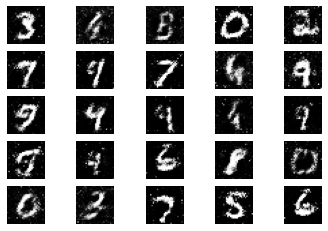

3601 [D loss: 0.553494, acc.: 75.78%] [G loss: 0.896833]
3602 [D loss: 0.578796, acc.: 71.88%] [G loss: 0.982375]
3603 [D loss: 0.659321, acc.: 61.72%] [G loss: 0.906603]
3604 [D loss: 0.611403, acc.: 70.31%] [G loss: 0.849142]
3605 [D loss: 0.610828, acc.: 66.41%] [G loss: 0.899755]
3606 [D loss: 0.599814, acc.: 65.62%] [G loss: 0.949254]
3607 [D loss: 0.609330, acc.: 70.31%] [G loss: 0.911037]
3608 [D loss: 0.619686, acc.: 65.62%] [G loss: 0.926850]
3609 [D loss: 0.608537, acc.: 69.53%] [G loss: 0.929917]
3610 [D loss: 0.593686, acc.: 73.44%] [G loss: 0.930714]
3611 [D loss: 0.602060, acc.: 67.19%] [G loss: 0.939814]
3612 [D loss: 0.639542, acc.: 62.50%] [G loss: 0.938691]
3613 [D loss: 0.642812, acc.: 59.38%] [G loss: 0.938324]
3614 [D loss: 0.608168, acc.: 69.53%] [G loss: 0.991626]
3615 [D loss: 0.624632, acc.: 66.41%] [G loss: 0.955012]
3616 [D loss: 0.604440, acc.: 69.53%] [G loss: 0.925168]
3617 [D loss: 0.636026, acc.: 62.50%] [G loss: 0.894349]
3618 [D loss: 0.571893, acc.: 7

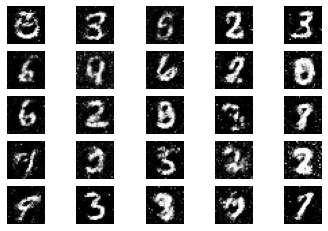

3701 [D loss: 0.620257, acc.: 65.62%] [G loss: 0.933421]
3702 [D loss: 0.648435, acc.: 60.94%] [G loss: 0.891273]
3703 [D loss: 0.605520, acc.: 66.41%] [G loss: 1.007759]
3704 [D loss: 0.617510, acc.: 67.19%] [G loss: 0.925904]
3705 [D loss: 0.654009, acc.: 57.03%] [G loss: 0.830943]
3706 [D loss: 0.640865, acc.: 58.59%] [G loss: 0.928552]
3707 [D loss: 0.676218, acc.: 58.59%] [G loss: 0.881500]
3708 [D loss: 0.634656, acc.: 67.19%] [G loss: 0.916138]
3709 [D loss: 0.623316, acc.: 68.75%] [G loss: 0.944157]
3710 [D loss: 0.662817, acc.: 61.72%] [G loss: 0.948554]
3711 [D loss: 0.658204, acc.: 58.59%] [G loss: 0.944010]
3712 [D loss: 0.593282, acc.: 71.88%] [G loss: 0.921777]
3713 [D loss: 0.643400, acc.: 64.06%] [G loss: 0.936833]
3714 [D loss: 0.630013, acc.: 64.06%] [G loss: 0.915846]
3715 [D loss: 0.615799, acc.: 68.75%] [G loss: 0.871100]
3716 [D loss: 0.638537, acc.: 64.84%] [G loss: 0.870263]
3717 [D loss: 0.694917, acc.: 57.03%] [G loss: 0.911082]
3718 [D loss: 0.625151, acc.: 6

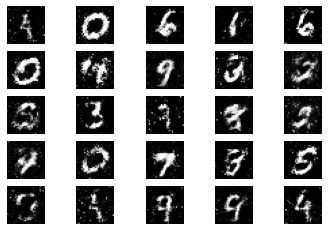

3801 [D loss: 0.579764, acc.: 69.53%] [G loss: 0.948960]
3802 [D loss: 0.640522, acc.: 60.94%] [G loss: 0.950013]
3803 [D loss: 0.614215, acc.: 71.88%] [G loss: 0.928437]
3804 [D loss: 0.664780, acc.: 56.25%] [G loss: 0.916523]
3805 [D loss: 0.591831, acc.: 68.75%] [G loss: 0.896931]
3806 [D loss: 0.625633, acc.: 67.97%] [G loss: 0.910479]
3807 [D loss: 0.623652, acc.: 67.19%] [G loss: 0.942344]
3808 [D loss: 0.554969, acc.: 75.78%] [G loss: 0.902735]
3809 [D loss: 0.667383, acc.: 57.81%] [G loss: 0.922132]
3810 [D loss: 0.614219, acc.: 65.62%] [G loss: 0.910915]
3811 [D loss: 0.679606, acc.: 53.91%] [G loss: 0.948790]
3812 [D loss: 0.609288, acc.: 67.19%] [G loss: 0.961838]
3813 [D loss: 0.626680, acc.: 67.19%] [G loss: 0.964557]
3814 [D loss: 0.661393, acc.: 64.06%] [G loss: 1.012142]
3815 [D loss: 0.629355, acc.: 67.19%] [G loss: 0.987367]
3816 [D loss: 0.635273, acc.: 64.84%] [G loss: 0.925288]
3817 [D loss: 0.602054, acc.: 70.31%] [G loss: 0.896550]
3818 [D loss: 0.625009, acc.: 6

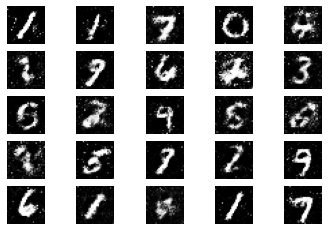

3901 [D loss: 0.602998, acc.: 68.75%] [G loss: 0.988583]
3902 [D loss: 0.673188, acc.: 59.38%] [G loss: 0.931217]
3903 [D loss: 0.636688, acc.: 64.06%] [G loss: 0.953869]
3904 [D loss: 0.609848, acc.: 69.53%] [G loss: 0.882313]
3905 [D loss: 0.627608, acc.: 61.72%] [G loss: 0.864044]
3906 [D loss: 0.627739, acc.: 61.72%] [G loss: 0.863306]
3907 [D loss: 0.649956, acc.: 64.06%] [G loss: 0.878120]
3908 [D loss: 0.596303, acc.: 74.22%] [G loss: 0.916210]
3909 [D loss: 0.628705, acc.: 70.31%] [G loss: 0.927240]
3910 [D loss: 0.629550, acc.: 64.84%] [G loss: 0.865185]
3911 [D loss: 0.592171, acc.: 69.53%] [G loss: 0.899446]
3912 [D loss: 0.606482, acc.: 72.66%] [G loss: 0.918529]
3913 [D loss: 0.599585, acc.: 68.75%] [G loss: 0.957207]
3914 [D loss: 0.646330, acc.: 59.38%] [G loss: 0.896813]
3915 [D loss: 0.667667, acc.: 61.72%] [G loss: 0.979150]
3916 [D loss: 0.579647, acc.: 72.66%] [G loss: 0.915535]
3917 [D loss: 0.658233, acc.: 58.59%] [G loss: 0.879949]
3918 [D loss: 0.664122, acc.: 5

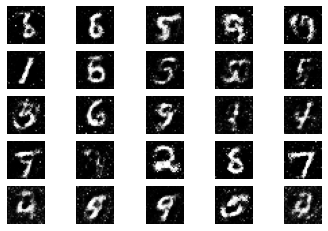

4001 [D loss: 0.639557, acc.: 67.19%] [G loss: 0.924816]
4002 [D loss: 0.635195, acc.: 59.38%] [G loss: 0.884996]
4003 [D loss: 0.660288, acc.: 57.03%] [G loss: 0.937626]
4004 [D loss: 0.686204, acc.: 57.03%] [G loss: 0.922921]
4005 [D loss: 0.656988, acc.: 62.50%] [G loss: 0.907789]
4006 [D loss: 0.633525, acc.: 65.62%] [G loss: 0.847323]
4007 [D loss: 0.617221, acc.: 73.44%] [G loss: 0.875272]
4008 [D loss: 0.606018, acc.: 66.41%] [G loss: 0.917913]
4009 [D loss: 0.646177, acc.: 63.28%] [G loss: 0.947496]
4010 [D loss: 0.647937, acc.: 60.94%] [G loss: 0.874765]
4011 [D loss: 0.647067, acc.: 60.94%] [G loss: 0.887369]
4012 [D loss: 0.673426, acc.: 54.69%] [G loss: 0.882304]
4013 [D loss: 0.682344, acc.: 57.81%] [G loss: 0.880825]
4014 [D loss: 0.633803, acc.: 64.06%] [G loss: 0.941459]
4015 [D loss: 0.656752, acc.: 61.72%] [G loss: 0.938266]
4016 [D loss: 0.615068, acc.: 68.75%] [G loss: 0.894624]
4017 [D loss: 0.599828, acc.: 69.53%] [G loss: 0.835328]
4018 [D loss: 0.643641, acc.: 6

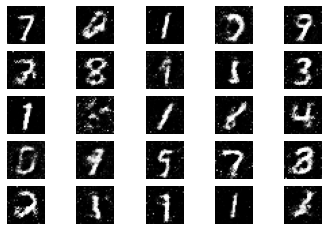

4101 [D loss: 0.672043, acc.: 63.28%] [G loss: 0.849055]
4102 [D loss: 0.678908, acc.: 56.25%] [G loss: 0.856722]
4103 [D loss: 0.593697, acc.: 72.66%] [G loss: 0.904225]
4104 [D loss: 0.638943, acc.: 67.19%] [G loss: 0.899854]
4105 [D loss: 0.599787, acc.: 71.09%] [G loss: 0.893586]
4106 [D loss: 0.626756, acc.: 65.62%] [G loss: 0.904185]
4107 [D loss: 0.619270, acc.: 69.53%] [G loss: 0.865665]
4108 [D loss: 0.642848, acc.: 64.06%] [G loss: 0.911817]
4109 [D loss: 0.686053, acc.: 58.59%] [G loss: 0.892302]
4110 [D loss: 0.640495, acc.: 65.62%] [G loss: 0.880931]
4111 [D loss: 0.646036, acc.: 61.72%] [G loss: 0.848016]
4112 [D loss: 0.668069, acc.: 57.81%] [G loss: 0.867049]
4113 [D loss: 0.611441, acc.: 65.62%] [G loss: 0.854011]
4114 [D loss: 0.644578, acc.: 60.16%] [G loss: 0.919783]
4115 [D loss: 0.643986, acc.: 64.84%] [G loss: 0.921144]
4116 [D loss: 0.657798, acc.: 57.81%] [G loss: 0.978452]
4117 [D loss: 0.610083, acc.: 69.53%] [G loss: 0.989219]
4118 [D loss: 0.617701, acc.: 6

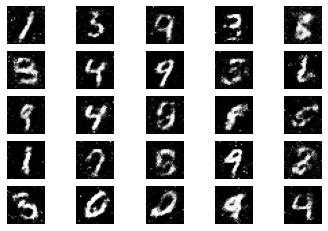

4201 [D loss: 0.643139, acc.: 66.41%] [G loss: 0.893229]
4202 [D loss: 0.645424, acc.: 64.06%] [G loss: 0.915521]
4203 [D loss: 0.650301, acc.: 60.16%] [G loss: 0.937379]
4204 [D loss: 0.685414, acc.: 59.38%] [G loss: 0.927338]
4205 [D loss: 0.596923, acc.: 72.66%] [G loss: 0.904222]
4206 [D loss: 0.625955, acc.: 67.97%] [G loss: 0.902535]
4207 [D loss: 0.636686, acc.: 64.06%] [G loss: 0.892680]
4208 [D loss: 0.658377, acc.: 57.81%] [G loss: 0.860582]
4209 [D loss: 0.620839, acc.: 68.75%] [G loss: 0.910642]
4210 [D loss: 0.630060, acc.: 64.06%] [G loss: 0.893914]
4211 [D loss: 0.621761, acc.: 64.06%] [G loss: 0.921932]
4212 [D loss: 0.610899, acc.: 69.53%] [G loss: 0.951349]
4213 [D loss: 0.613195, acc.: 67.97%] [G loss: 0.917503]
4214 [D loss: 0.671045, acc.: 59.38%] [G loss: 0.926115]
4215 [D loss: 0.646123, acc.: 60.16%] [G loss: 0.913310]
4216 [D loss: 0.607630, acc.: 70.31%] [G loss: 0.878475]
4217 [D loss: 0.634297, acc.: 64.84%] [G loss: 0.876761]
4218 [D loss: 0.597140, acc.: 7

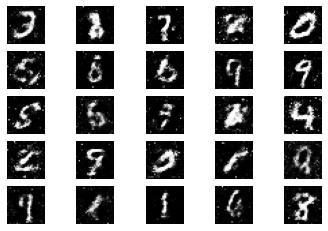

4301 [D loss: 0.673754, acc.: 60.94%] [G loss: 0.890986]
4302 [D loss: 0.570258, acc.: 76.56%] [G loss: 0.840081]
4303 [D loss: 0.640036, acc.: 62.50%] [G loss: 0.836442]
4304 [D loss: 0.616726, acc.: 66.41%] [G loss: 0.899804]
4305 [D loss: 0.656670, acc.: 63.28%] [G loss: 0.904606]
4306 [D loss: 0.618238, acc.: 67.97%] [G loss: 0.888876]
4307 [D loss: 0.653458, acc.: 60.16%] [G loss: 0.911598]
4308 [D loss: 0.624488, acc.: 64.84%] [G loss: 0.927366]
4309 [D loss: 0.626137, acc.: 69.53%] [G loss: 0.915187]
4310 [D loss: 0.651793, acc.: 64.06%] [G loss: 0.897643]
4311 [D loss: 0.612590, acc.: 69.53%] [G loss: 0.899902]
4312 [D loss: 0.629172, acc.: 60.94%] [G loss: 0.889567]
4313 [D loss: 0.564281, acc.: 74.22%] [G loss: 0.939947]
4314 [D loss: 0.753816, acc.: 52.34%] [G loss: 0.873030]
4315 [D loss: 0.647335, acc.: 57.81%] [G loss: 0.911232]
4316 [D loss: 0.585844, acc.: 75.00%] [G loss: 0.894715]
4317 [D loss: 0.656272, acc.: 58.59%] [G loss: 0.891458]
4318 [D loss: 0.639476, acc.: 6

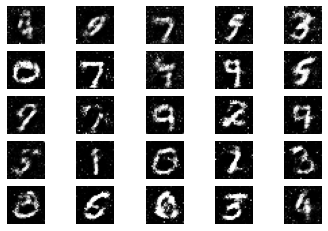

4401 [D loss: 0.681060, acc.: 60.16%] [G loss: 0.900113]
4402 [D loss: 0.621747, acc.: 67.19%] [G loss: 0.919211]
4403 [D loss: 0.619106, acc.: 65.62%] [G loss: 0.854246]
4404 [D loss: 0.687465, acc.: 57.03%] [G loss: 0.841856]
4405 [D loss: 0.635971, acc.: 59.38%] [G loss: 0.901194]
4406 [D loss: 0.620489, acc.: 64.06%] [G loss: 0.887802]
4407 [D loss: 0.616629, acc.: 64.84%] [G loss: 0.873007]
4408 [D loss: 0.652793, acc.: 59.38%] [G loss: 0.871776]
4409 [D loss: 0.655322, acc.: 64.06%] [G loss: 0.921597]
4410 [D loss: 0.636314, acc.: 59.38%] [G loss: 0.894431]
4411 [D loss: 0.653433, acc.: 64.84%] [G loss: 0.922596]
4412 [D loss: 0.624422, acc.: 64.06%] [G loss: 0.851155]
4413 [D loss: 0.630179, acc.: 61.72%] [G loss: 0.896194]
4414 [D loss: 0.578910, acc.: 71.88%] [G loss: 0.919497]
4415 [D loss: 0.645425, acc.: 60.94%] [G loss: 0.882018]
4416 [D loss: 0.582328, acc.: 71.88%] [G loss: 0.945897]
4417 [D loss: 0.606357, acc.: 68.75%] [G loss: 0.910889]
4418 [D loss: 0.632405, acc.: 6

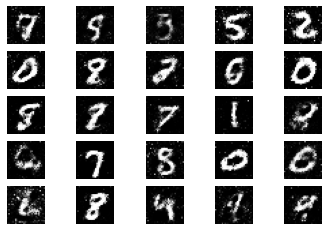

4501 [D loss: 0.669975, acc.: 59.38%] [G loss: 0.904928]
4502 [D loss: 0.640279, acc.: 64.06%] [G loss: 0.884171]
4503 [D loss: 0.638720, acc.: 65.62%] [G loss: 0.918265]
4504 [D loss: 0.702470, acc.: 53.91%] [G loss: 0.851104]
4505 [D loss: 0.640835, acc.: 61.72%] [G loss: 0.904215]
4506 [D loss: 0.619113, acc.: 65.62%] [G loss: 0.897710]
4507 [D loss: 0.631059, acc.: 66.41%] [G loss: 0.913953]
4508 [D loss: 0.628290, acc.: 64.06%] [G loss: 0.913573]
4509 [D loss: 0.671986, acc.: 61.72%] [G loss: 0.925776]
4510 [D loss: 0.636257, acc.: 62.50%] [G loss: 0.936966]
4511 [D loss: 0.613375, acc.: 71.88%] [G loss: 0.851760]
4512 [D loss: 0.635773, acc.: 64.84%] [G loss: 0.850593]
4513 [D loss: 0.701664, acc.: 53.91%] [G loss: 0.826441]
4514 [D loss: 0.628489, acc.: 69.53%] [G loss: 0.901265]
4515 [D loss: 0.666255, acc.: 64.06%] [G loss: 0.890698]
4516 [D loss: 0.644903, acc.: 58.59%] [G loss: 0.896023]
4517 [D loss: 0.611810, acc.: 67.97%] [G loss: 0.928700]
4518 [D loss: 0.619384, acc.: 6

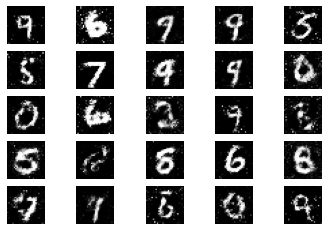

4601 [D loss: 0.608602, acc.: 66.41%] [G loss: 0.907460]
4602 [D loss: 0.641693, acc.: 64.84%] [G loss: 0.887349]
4603 [D loss: 0.674831, acc.: 54.69%] [G loss: 0.901343]
4604 [D loss: 0.637543, acc.: 64.84%] [G loss: 0.936795]
4605 [D loss: 0.649759, acc.: 64.84%] [G loss: 0.838063]
4606 [D loss: 0.623684, acc.: 68.75%] [G loss: 0.860894]
4607 [D loss: 0.666115, acc.: 63.28%] [G loss: 0.901101]
4608 [D loss: 0.632715, acc.: 65.62%] [G loss: 0.879154]
4609 [D loss: 0.601603, acc.: 71.88%] [G loss: 0.902581]
4610 [D loss: 0.657057, acc.: 60.94%] [G loss: 0.866602]
4611 [D loss: 0.650809, acc.: 60.94%] [G loss: 0.879053]
4612 [D loss: 0.640875, acc.: 61.72%] [G loss: 0.868209]
4613 [D loss: 0.626090, acc.: 67.97%] [G loss: 0.891848]
4614 [D loss: 0.674577, acc.: 57.81%] [G loss: 0.888525]
4615 [D loss: 0.670368, acc.: 62.50%] [G loss: 0.873898]
4616 [D loss: 0.638803, acc.: 63.28%] [G loss: 0.834944]
4617 [D loss: 0.640184, acc.: 61.72%] [G loss: 0.858926]
4618 [D loss: 0.635013, acc.: 7

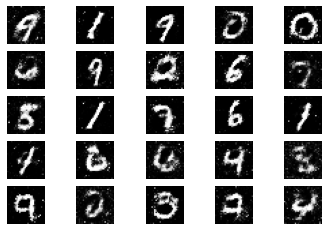

4701 [D loss: 0.618830, acc.: 67.19%] [G loss: 0.954756]
4702 [D loss: 0.672534, acc.: 59.38%] [G loss: 0.915604]
4703 [D loss: 0.649785, acc.: 61.72%] [G loss: 0.877142]
4704 [D loss: 0.625957, acc.: 67.19%] [G loss: 0.852523]
4705 [D loss: 0.637254, acc.: 66.41%] [G loss: 0.898026]
4706 [D loss: 0.661626, acc.: 61.72%] [G loss: 0.891791]
4707 [D loss: 0.655968, acc.: 60.16%] [G loss: 0.891774]
4708 [D loss: 0.618746, acc.: 70.31%] [G loss: 0.935278]
4709 [D loss: 0.661315, acc.: 61.72%] [G loss: 0.924516]
4710 [D loss: 0.651222, acc.: 61.72%] [G loss: 0.914917]
4711 [D loss: 0.646416, acc.: 65.62%] [G loss: 0.930345]
4712 [D loss: 0.612126, acc.: 71.09%] [G loss: 0.883803]
4713 [D loss: 0.652683, acc.: 64.06%] [G loss: 0.907743]
4714 [D loss: 0.661661, acc.: 57.03%] [G loss: 0.886184]
4715 [D loss: 0.645975, acc.: 62.50%] [G loss: 0.920058]
4716 [D loss: 0.683333, acc.: 55.47%] [G loss: 0.916569]
4717 [D loss: 0.641343, acc.: 62.50%] [G loss: 0.930597]
4718 [D loss: 0.652793, acc.: 5

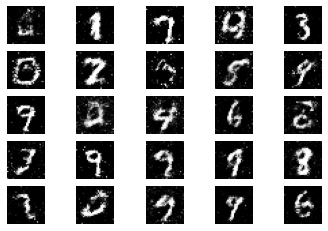

4801 [D loss: 0.644770, acc.: 64.84%] [G loss: 0.926932]
4802 [D loss: 0.660455, acc.: 62.50%] [G loss: 0.957036]
4803 [D loss: 0.668203, acc.: 58.59%] [G loss: 0.905840]
4804 [D loss: 0.650347, acc.: 58.59%] [G loss: 0.861341]
4805 [D loss: 0.657315, acc.: 62.50%] [G loss: 0.885687]
4806 [D loss: 0.620785, acc.: 65.62%] [G loss: 0.907401]
4807 [D loss: 0.649266, acc.: 64.06%] [G loss: 0.908961]
4808 [D loss: 0.622019, acc.: 65.62%] [G loss: 0.852841]
4809 [D loss: 0.616689, acc.: 66.41%] [G loss: 0.911373]
4810 [D loss: 0.666005, acc.: 56.25%] [G loss: 0.887246]
4811 [D loss: 0.665603, acc.: 57.81%] [G loss: 0.892842]
4812 [D loss: 0.644348, acc.: 62.50%] [G loss: 0.884866]
4813 [D loss: 0.644471, acc.: 68.75%] [G loss: 0.881004]
4814 [D loss: 0.687114, acc.: 57.81%] [G loss: 0.880462]
4815 [D loss: 0.640297, acc.: 59.38%] [G loss: 0.903942]
4816 [D loss: 0.650831, acc.: 59.38%] [G loss: 0.858954]
4817 [D loss: 0.666605, acc.: 63.28%] [G loss: 0.951826]
4818 [D loss: 0.687618, acc.: 5

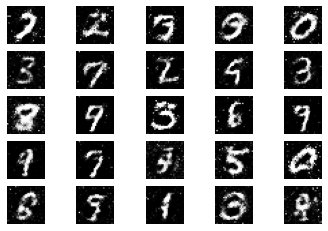

4901 [D loss: 0.670530, acc.: 57.03%] [G loss: 0.832990]
4902 [D loss: 0.673066, acc.: 61.72%] [G loss: 0.865118]
4903 [D loss: 0.644218, acc.: 64.84%] [G loss: 0.896639]
4904 [D loss: 0.680469, acc.: 54.69%] [G loss: 0.842386]
4905 [D loss: 0.663230, acc.: 60.16%] [G loss: 0.859087]
4906 [D loss: 0.629718, acc.: 67.97%] [G loss: 0.887261]
4907 [D loss: 0.676672, acc.: 60.16%] [G loss: 0.855635]
4908 [D loss: 0.666506, acc.: 58.59%] [G loss: 0.837114]
4909 [D loss: 0.670403, acc.: 64.06%] [G loss: 0.911580]
4910 [D loss: 0.626481, acc.: 68.75%] [G loss: 0.876383]
4911 [D loss: 0.625675, acc.: 64.84%] [G loss: 0.964637]
4912 [D loss: 0.623626, acc.: 67.19%] [G loss: 0.898481]
4913 [D loss: 0.637605, acc.: 64.06%] [G loss: 0.928524]
4914 [D loss: 0.683451, acc.: 60.94%] [G loss: 0.954145]
4915 [D loss: 0.653363, acc.: 60.94%] [G loss: 0.868740]
4916 [D loss: 0.635300, acc.: 64.84%] [G loss: 0.913130]
4917 [D loss: 0.690970, acc.: 53.12%] [G loss: 0.931762]
4918 [D loss: 0.613918, acc.: 6

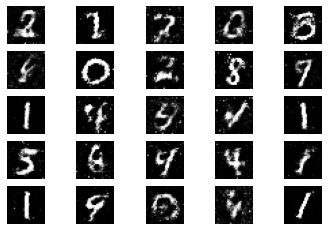

5001 [D loss: 0.624383, acc.: 62.50%] [G loss: 0.898397]
5002 [D loss: 0.658557, acc.: 60.94%] [G loss: 0.928029]
5003 [D loss: 0.683936, acc.: 56.25%] [G loss: 0.867325]
5004 [D loss: 0.697060, acc.: 51.56%] [G loss: 0.873751]
5005 [D loss: 0.678237, acc.: 57.03%] [G loss: 0.844837]
5006 [D loss: 0.627915, acc.: 65.62%] [G loss: 0.856634]
5007 [D loss: 0.676409, acc.: 53.91%] [G loss: 0.857355]
5008 [D loss: 0.676422, acc.: 61.72%] [G loss: 0.863111]
5009 [D loss: 0.647299, acc.: 58.59%] [G loss: 0.847070]
5010 [D loss: 0.598929, acc.: 69.53%] [G loss: 0.904935]
5011 [D loss: 0.636034, acc.: 60.16%] [G loss: 0.907264]
5012 [D loss: 0.642528, acc.: 64.84%] [G loss: 0.841267]
5013 [D loss: 0.634589, acc.: 63.28%] [G loss: 0.907820]
5014 [D loss: 0.640647, acc.: 60.94%] [G loss: 0.887987]
5015 [D loss: 0.648000, acc.: 61.72%] [G loss: 0.829173]
5016 [D loss: 0.670157, acc.: 60.16%] [G loss: 0.854508]
5017 [D loss: 0.651909, acc.: 62.50%] [G loss: 0.912925]
5018 [D loss: 0.621131, acc.: 6

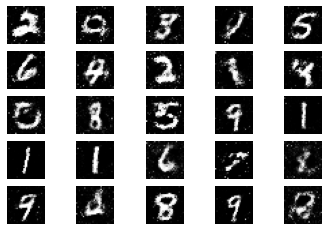

5101 [D loss: 0.671751, acc.: 63.28%] [G loss: 0.813481]
5102 [D loss: 0.617415, acc.: 64.84%] [G loss: 0.881610]
5103 [D loss: 0.673169, acc.: 59.38%] [G loss: 0.907388]
5104 [D loss: 0.643626, acc.: 60.94%] [G loss: 0.905087]
5105 [D loss: 0.631914, acc.: 67.97%] [G loss: 0.939534]
5106 [D loss: 0.645350, acc.: 59.38%] [G loss: 0.973048]
5107 [D loss: 0.688949, acc.: 55.47%] [G loss: 0.936572]
5108 [D loss: 0.665095, acc.: 60.16%] [G loss: 0.861612]
5109 [D loss: 0.647636, acc.: 61.72%] [G loss: 0.893735]
5110 [D loss: 0.624862, acc.: 71.09%] [G loss: 0.904345]
5111 [D loss: 0.638680, acc.: 64.06%] [G loss: 0.895550]
5112 [D loss: 0.644204, acc.: 62.50%] [G loss: 0.896127]
5113 [D loss: 0.630270, acc.: 67.19%] [G loss: 0.882842]
5114 [D loss: 0.652816, acc.: 56.25%] [G loss: 0.851407]
5115 [D loss: 0.660734, acc.: 61.72%] [G loss: 0.887951]
5116 [D loss: 0.643677, acc.: 67.19%] [G loss: 0.834564]
5117 [D loss: 0.627896, acc.: 69.53%] [G loss: 0.911615]
5118 [D loss: 0.733684, acc.: 5

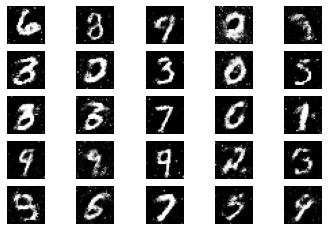

5201 [D loss: 0.641327, acc.: 64.06%] [G loss: 0.922181]
5202 [D loss: 0.623274, acc.: 64.06%] [G loss: 0.944717]
5203 [D loss: 0.644375, acc.: 60.16%] [G loss: 0.892193]
5204 [D loss: 0.671941, acc.: 60.94%] [G loss: 0.881425]
5205 [D loss: 0.672733, acc.: 62.50%] [G loss: 0.903608]
5206 [D loss: 0.697513, acc.: 53.12%] [G loss: 0.880274]
5207 [D loss: 0.650671, acc.: 67.19%] [G loss: 0.916691]
5208 [D loss: 0.637713, acc.: 63.28%] [G loss: 0.883830]
5209 [D loss: 0.616271, acc.: 67.19%] [G loss: 0.973629]
5210 [D loss: 0.648194, acc.: 60.16%] [G loss: 0.849954]
5211 [D loss: 0.649857, acc.: 58.59%] [G loss: 0.859630]
5212 [D loss: 0.671747, acc.: 58.59%] [G loss: 0.806866]
5213 [D loss: 0.639700, acc.: 72.66%] [G loss: 0.875033]
5214 [D loss: 0.644271, acc.: 62.50%] [G loss: 0.864523]
5215 [D loss: 0.649533, acc.: 63.28%] [G loss: 0.828089]
5216 [D loss: 0.618286, acc.: 65.62%] [G loss: 0.896119]
5217 [D loss: 0.705770, acc.: 53.91%] [G loss: 0.919524]
5218 [D loss: 0.659912, acc.: 6

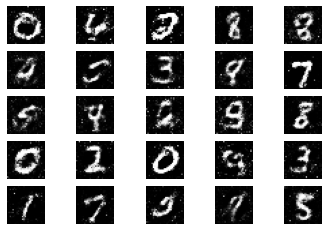

5301 [D loss: 0.672433, acc.: 60.16%] [G loss: 0.837268]
5302 [D loss: 0.664360, acc.: 58.59%] [G loss: 0.908913]
5303 [D loss: 0.678387, acc.: 58.59%] [G loss: 0.884243]
5304 [D loss: 0.652874, acc.: 60.16%] [G loss: 0.899655]
5305 [D loss: 0.668470, acc.: 60.94%] [G loss: 0.901659]
5306 [D loss: 0.609252, acc.: 67.97%] [G loss: 0.915463]
5307 [D loss: 0.635207, acc.: 67.19%] [G loss: 0.923793]
5308 [D loss: 0.677142, acc.: 56.25%] [G loss: 0.856520]
5309 [D loss: 0.709410, acc.: 46.88%] [G loss: 0.837463]
5310 [D loss: 0.678482, acc.: 56.25%] [G loss: 0.941832]
5311 [D loss: 0.606271, acc.: 67.97%] [G loss: 0.873899]
5312 [D loss: 0.680366, acc.: 55.47%] [G loss: 0.857808]
5313 [D loss: 0.705469, acc.: 51.56%] [G loss: 0.812521]
5314 [D loss: 0.647753, acc.: 64.84%] [G loss: 0.872069]
5315 [D loss: 0.626330, acc.: 67.19%] [G loss: 0.846165]
5316 [D loss: 0.648595, acc.: 63.28%] [G loss: 0.893213]
5317 [D loss: 0.661472, acc.: 63.28%] [G loss: 0.888974]
5318 [D loss: 0.633466, acc.: 6

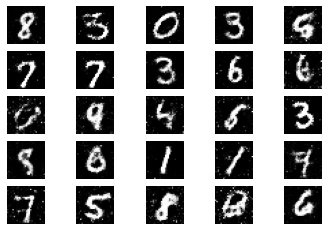

5401 [D loss: 0.674587, acc.: 62.50%] [G loss: 0.896391]
5402 [D loss: 0.618671, acc.: 69.53%] [G loss: 0.872707]
5403 [D loss: 0.657905, acc.: 66.41%] [G loss: 0.904238]
5404 [D loss: 0.617136, acc.: 69.53%] [G loss: 0.894796]
5405 [D loss: 0.660466, acc.: 56.25%] [G loss: 0.933821]
5406 [D loss: 0.626536, acc.: 67.19%] [G loss: 0.956726]
5407 [D loss: 0.650970, acc.: 63.28%] [G loss: 0.925441]
5408 [D loss: 0.637689, acc.: 66.41%] [G loss: 0.874203]
5409 [D loss: 0.632606, acc.: 62.50%] [G loss: 0.933599]
5410 [D loss: 0.637725, acc.: 64.84%] [G loss: 0.927204]
5411 [D loss: 0.629829, acc.: 64.84%] [G loss: 0.927003]
5412 [D loss: 0.642024, acc.: 62.50%] [G loss: 0.871062]
5413 [D loss: 0.690811, acc.: 53.12%] [G loss: 0.932960]
5414 [D loss: 0.601662, acc.: 70.31%] [G loss: 0.961918]
5415 [D loss: 0.665264, acc.: 57.03%] [G loss: 0.954331]
5416 [D loss: 0.738799, acc.: 48.44%] [G loss: 0.947166]
5417 [D loss: 0.673331, acc.: 64.06%] [G loss: 0.904523]
5418 [D loss: 0.651591, acc.: 6

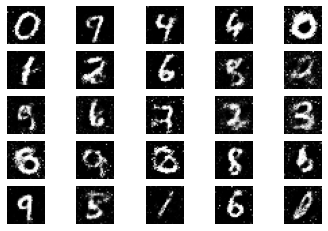

5501 [D loss: 0.638957, acc.: 62.50%] [G loss: 0.871016]
5502 [D loss: 0.660239, acc.: 60.94%] [G loss: 0.859559]
5503 [D loss: 0.681085, acc.: 55.47%] [G loss: 0.841833]
5504 [D loss: 0.707450, acc.: 53.91%] [G loss: 0.871400]
5505 [D loss: 0.647060, acc.: 61.72%] [G loss: 0.879036]
5506 [D loss: 0.643594, acc.: 66.41%] [G loss: 0.895282]
5507 [D loss: 0.634288, acc.: 63.28%] [G loss: 0.863143]
5508 [D loss: 0.648946, acc.: 57.81%] [G loss: 0.925889]
5509 [D loss: 0.650253, acc.: 60.94%] [G loss: 0.901804]
5510 [D loss: 0.662364, acc.: 54.69%] [G loss: 0.897029]
5511 [D loss: 0.632336, acc.: 64.84%] [G loss: 0.879612]
5512 [D loss: 0.624097, acc.: 67.19%] [G loss: 0.810751]
5513 [D loss: 0.697507, acc.: 54.69%] [G loss: 0.846524]
5514 [D loss: 0.651149, acc.: 64.84%] [G loss: 0.976369]
5515 [D loss: 0.665118, acc.: 59.38%] [G loss: 0.930354]
5516 [D loss: 0.650086, acc.: 64.84%] [G loss: 0.864695]
5517 [D loss: 0.660145, acc.: 62.50%] [G loss: 0.913795]
5518 [D loss: 0.652714, acc.: 5

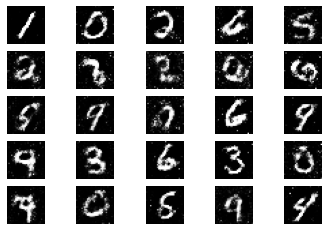

5601 [D loss: 0.664279, acc.: 56.25%] [G loss: 0.905366]
5602 [D loss: 0.615931, acc.: 67.19%] [G loss: 0.909146]
5603 [D loss: 0.651300, acc.: 60.16%] [G loss: 0.869981]
5604 [D loss: 0.653820, acc.: 63.28%] [G loss: 0.876147]
5605 [D loss: 0.661511, acc.: 60.16%] [G loss: 0.867038]
5606 [D loss: 0.675527, acc.: 57.03%] [G loss: 0.841023]
5607 [D loss: 0.592023, acc.: 69.53%] [G loss: 0.851873]
5608 [D loss: 0.675633, acc.: 63.28%] [G loss: 0.868692]
5609 [D loss: 0.661396, acc.: 64.84%] [G loss: 0.855225]
5610 [D loss: 0.660881, acc.: 60.94%] [G loss: 0.827571]
5611 [D loss: 0.638416, acc.: 63.28%] [G loss: 0.896499]
5612 [D loss: 0.640393, acc.: 58.59%] [G loss: 0.954693]
5613 [D loss: 0.674806, acc.: 57.03%] [G loss: 0.923769]
5614 [D loss: 0.666722, acc.: 53.91%] [G loss: 0.850888]
5615 [D loss: 0.621990, acc.: 64.84%] [G loss: 0.886473]
5616 [D loss: 0.652905, acc.: 60.16%] [G loss: 0.890889]
5617 [D loss: 0.598842, acc.: 67.97%] [G loss: 0.928404]
5618 [D loss: 0.653658, acc.: 6

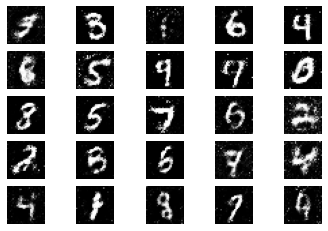

5701 [D loss: 0.665963, acc.: 63.28%] [G loss: 0.918457]
5702 [D loss: 0.639600, acc.: 60.94%] [G loss: 0.903641]
5703 [D loss: 0.660247, acc.: 61.72%] [G loss: 0.856951]
5704 [D loss: 0.626287, acc.: 67.19%] [G loss: 0.829876]
5705 [D loss: 0.689896, acc.: 54.69%] [G loss: 0.858961]
5706 [D loss: 0.639582, acc.: 63.28%] [G loss: 0.960876]
5707 [D loss: 0.663126, acc.: 60.94%] [G loss: 0.931119]
5708 [D loss: 0.643946, acc.: 57.03%] [G loss: 0.915426]
5709 [D loss: 0.610238, acc.: 74.22%] [G loss: 0.885311]
5710 [D loss: 0.653728, acc.: 58.59%] [G loss: 0.930305]
5711 [D loss: 0.687891, acc.: 59.38%] [G loss: 0.932062]
5712 [D loss: 0.651108, acc.: 59.38%] [G loss: 0.908156]
5713 [D loss: 0.672307, acc.: 62.50%] [G loss: 0.824229]
5714 [D loss: 0.682543, acc.: 53.91%] [G loss: 0.895877]
5715 [D loss: 0.618921, acc.: 71.88%] [G loss: 0.852484]
5716 [D loss: 0.682069, acc.: 53.12%] [G loss: 0.877972]
5717 [D loss: 0.678008, acc.: 59.38%] [G loss: 0.818232]
5718 [D loss: 0.664584, acc.: 6

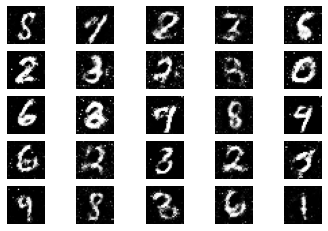

5801 [D loss: 0.646443, acc.: 64.84%] [G loss: 0.924476]
5802 [D loss: 0.680939, acc.: 53.12%] [G loss: 0.927799]
5803 [D loss: 0.641349, acc.: 60.16%] [G loss: 0.906619]
5804 [D loss: 0.691018, acc.: 49.22%] [G loss: 0.837177]
5805 [D loss: 0.655910, acc.: 64.06%] [G loss: 0.829457]
5806 [D loss: 0.672873, acc.: 57.03%] [G loss: 0.923311]
5807 [D loss: 0.616962, acc.: 69.53%] [G loss: 0.862079]
5808 [D loss: 0.685053, acc.: 53.12%] [G loss: 0.885537]
5809 [D loss: 0.626473, acc.: 67.97%] [G loss: 0.877850]
5810 [D loss: 0.688879, acc.: 55.47%] [G loss: 0.895186]
5811 [D loss: 0.655539, acc.: 59.38%] [G loss: 0.833619]
5812 [D loss: 0.660794, acc.: 57.81%] [G loss: 0.845446]
5813 [D loss: 0.599716, acc.: 73.44%] [G loss: 0.894361]
5814 [D loss: 0.648694, acc.: 60.94%] [G loss: 0.888551]
5815 [D loss: 0.647114, acc.: 64.06%] [G loss: 0.833822]
5816 [D loss: 0.657438, acc.: 53.91%] [G loss: 0.840328]
5817 [D loss: 0.638145, acc.: 66.41%] [G loss: 0.826583]
5818 [D loss: 0.626157, acc.: 6

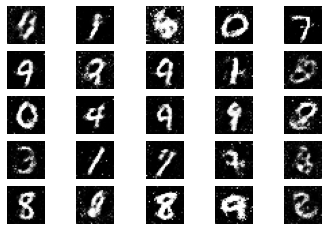

5901 [D loss: 0.639268, acc.: 61.72%] [G loss: 0.856939]
5902 [D loss: 0.705668, acc.: 58.59%] [G loss: 0.837380]
5903 [D loss: 0.668424, acc.: 61.72%] [G loss: 0.898543]
5904 [D loss: 0.658819, acc.: 63.28%] [G loss: 0.883842]
5905 [D loss: 0.626314, acc.: 70.31%] [G loss: 0.911498]
5906 [D loss: 0.655625, acc.: 60.94%] [G loss: 0.911058]
5907 [D loss: 0.645901, acc.: 60.94%] [G loss: 0.896720]
5908 [D loss: 0.645466, acc.: 61.72%] [G loss: 0.925551]
5909 [D loss: 0.630280, acc.: 67.19%] [G loss: 0.870333]
5910 [D loss: 0.691487, acc.: 52.34%] [G loss: 0.857082]
5911 [D loss: 0.670691, acc.: 57.03%] [G loss: 0.929459]
5912 [D loss: 0.695708, acc.: 54.69%] [G loss: 0.956950]
5913 [D loss: 0.660908, acc.: 58.59%] [G loss: 0.953208]
5914 [D loss: 0.663966, acc.: 59.38%] [G loss: 0.905462]
5915 [D loss: 0.633771, acc.: 64.84%] [G loss: 0.893402]
5916 [D loss: 0.674663, acc.: 63.28%] [G loss: 0.888704]
5917 [D loss: 0.650743, acc.: 60.94%] [G loss: 0.954725]
5918 [D loss: 0.655412, acc.: 6

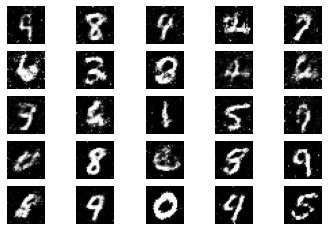

6001 [D loss: 0.649107, acc.: 59.38%] [G loss: 0.884683]
6002 [D loss: 0.683606, acc.: 57.81%] [G loss: 0.901043]
6003 [D loss: 0.638900, acc.: 60.94%] [G loss: 0.843423]
6004 [D loss: 0.633570, acc.: 63.28%] [G loss: 0.872394]
6005 [D loss: 0.650260, acc.: 67.19%] [G loss: 0.914949]
6006 [D loss: 0.705313, acc.: 50.00%] [G loss: 0.863032]
6007 [D loss: 0.653559, acc.: 55.47%] [G loss: 0.884984]
6008 [D loss: 0.647597, acc.: 64.06%] [G loss: 0.892480]
6009 [D loss: 0.646725, acc.: 57.81%] [G loss: 0.933394]
6010 [D loss: 0.705253, acc.: 53.12%] [G loss: 0.932449]
6011 [D loss: 0.698306, acc.: 55.47%] [G loss: 0.920555]
6012 [D loss: 0.656341, acc.: 60.16%] [G loss: 0.923055]
6013 [D loss: 0.623029, acc.: 65.62%] [G loss: 0.868303]
6014 [D loss: 0.668207, acc.: 58.59%] [G loss: 0.866358]
6015 [D loss: 0.669558, acc.: 57.81%] [G loss: 0.819659]
6016 [D loss: 0.666174, acc.: 66.41%] [G loss: 0.872226]
6017 [D loss: 0.716932, acc.: 55.47%] [G loss: 0.888097]
6018 [D loss: 0.634414, acc.: 6

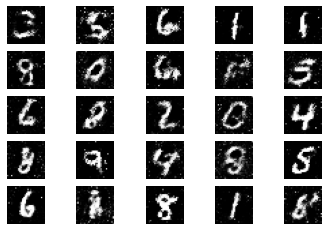

6101 [D loss: 0.641145, acc.: 64.06%] [G loss: 0.897659]
6102 [D loss: 0.667061, acc.: 61.72%] [G loss: 0.884747]
6103 [D loss: 0.651165, acc.: 63.28%] [G loss: 0.878503]
6104 [D loss: 0.686246, acc.: 54.69%] [G loss: 0.827006]
6105 [D loss: 0.689803, acc.: 54.69%] [G loss: 0.907574]
6106 [D loss: 0.624744, acc.: 64.84%] [G loss: 0.904887]
6107 [D loss: 0.650397, acc.: 60.16%] [G loss: 0.923802]
6108 [D loss: 0.668821, acc.: 57.03%] [G loss: 0.883513]
6109 [D loss: 0.642731, acc.: 64.06%] [G loss: 0.856939]
6110 [D loss: 0.654601, acc.: 63.28%] [G loss: 0.869380]
6111 [D loss: 0.692764, acc.: 56.25%] [G loss: 0.834313]
6112 [D loss: 0.651292, acc.: 60.16%] [G loss: 0.887835]
6113 [D loss: 0.699963, acc.: 53.91%] [G loss: 0.902577]
6114 [D loss: 0.661551, acc.: 60.16%] [G loss: 0.876494]
6115 [D loss: 0.672321, acc.: 57.03%] [G loss: 0.875419]
6116 [D loss: 0.649003, acc.: 63.28%] [G loss: 0.860358]
6117 [D loss: 0.703887, acc.: 53.12%] [G loss: 0.816267]
6118 [D loss: 0.673899, acc.: 5

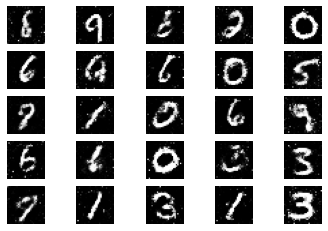

6201 [D loss: 0.646010, acc.: 62.50%] [G loss: 0.870511]
6202 [D loss: 0.643687, acc.: 60.16%] [G loss: 0.864560]
6203 [D loss: 0.670095, acc.: 62.50%] [G loss: 0.890648]
6204 [D loss: 0.686530, acc.: 53.12%] [G loss: 0.868473]
6205 [D loss: 0.635710, acc.: 67.19%] [G loss: 0.891333]
6206 [D loss: 0.662826, acc.: 60.94%] [G loss: 0.879462]
6207 [D loss: 0.683824, acc.: 55.47%] [G loss: 0.883656]
6208 [D loss: 0.651954, acc.: 60.94%] [G loss: 0.869640]
6209 [D loss: 0.638645, acc.: 64.84%] [G loss: 0.885616]
6210 [D loss: 0.657431, acc.: 56.25%] [G loss: 0.866353]
6211 [D loss: 0.662928, acc.: 60.94%] [G loss: 0.921769]
6212 [D loss: 0.642094, acc.: 62.50%] [G loss: 0.883989]
6213 [D loss: 0.650418, acc.: 63.28%] [G loss: 0.936147]
6214 [D loss: 0.648227, acc.: 63.28%] [G loss: 0.939383]
6215 [D loss: 0.644685, acc.: 64.84%] [G loss: 0.899091]
6216 [D loss: 0.659581, acc.: 58.59%] [G loss: 0.891746]
6217 [D loss: 0.676694, acc.: 57.81%] [G loss: 0.859093]
6218 [D loss: 0.624238, acc.: 6

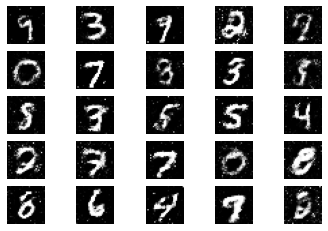

6301 [D loss: 0.641844, acc.: 62.50%] [G loss: 0.892725]
6302 [D loss: 0.677887, acc.: 57.81%] [G loss: 0.896767]
6303 [D loss: 0.668362, acc.: 60.16%] [G loss: 0.840129]
6304 [D loss: 0.632263, acc.: 66.41%] [G loss: 0.907119]
6305 [D loss: 0.637078, acc.: 64.84%] [G loss: 0.922243]
6306 [D loss: 0.670938, acc.: 57.03%] [G loss: 0.931880]
6307 [D loss: 0.649240, acc.: 64.84%] [G loss: 0.884906]
6308 [D loss: 0.627734, acc.: 69.53%] [G loss: 0.885556]
6309 [D loss: 0.697225, acc.: 56.25%] [G loss: 0.861612]
6310 [D loss: 0.668463, acc.: 57.03%] [G loss: 0.892421]
6311 [D loss: 0.643937, acc.: 64.84%] [G loss: 0.849644]
6312 [D loss: 0.653449, acc.: 60.94%] [G loss: 0.889188]
6313 [D loss: 0.658973, acc.: 62.50%] [G loss: 0.935989]
6314 [D loss: 0.695390, acc.: 60.16%] [G loss: 0.890627]
6315 [D loss: 0.663904, acc.: 57.03%] [G loss: 0.884469]
6316 [D loss: 0.639246, acc.: 60.94%] [G loss: 0.881506]
6317 [D loss: 0.677761, acc.: 52.34%] [G loss: 0.879807]
6318 [D loss: 0.667002, acc.: 6

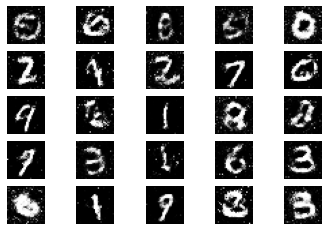

6401 [D loss: 0.607170, acc.: 69.53%] [G loss: 0.842877]
6402 [D loss: 0.636864, acc.: 65.62%] [G loss: 0.890902]
6403 [D loss: 0.653642, acc.: 66.41%] [G loss: 0.896512]
6404 [D loss: 0.684781, acc.: 57.81%] [G loss: 0.878558]
6405 [D loss: 0.668363, acc.: 60.94%] [G loss: 0.871193]
6406 [D loss: 0.687671, acc.: 52.34%] [G loss: 0.866382]
6407 [D loss: 0.679771, acc.: 53.91%] [G loss: 0.850075]
6408 [D loss: 0.651747, acc.: 60.94%] [G loss: 0.831001]
6409 [D loss: 0.687057, acc.: 57.03%] [G loss: 0.898917]
6410 [D loss: 0.694493, acc.: 53.12%] [G loss: 0.884620]
6411 [D loss: 0.653290, acc.: 58.59%] [G loss: 0.883206]
6412 [D loss: 0.649348, acc.: 64.84%] [G loss: 0.864565]
6413 [D loss: 0.654946, acc.: 65.62%] [G loss: 0.898334]
6414 [D loss: 0.683277, acc.: 57.81%] [G loss: 0.812410]
6415 [D loss: 0.697197, acc.: 52.34%] [G loss: 0.824301]
6416 [D loss: 0.657679, acc.: 58.59%] [G loss: 0.881160]
6417 [D loss: 0.648219, acc.: 66.41%] [G loss: 0.829194]
6418 [D loss: 0.659562, acc.: 6

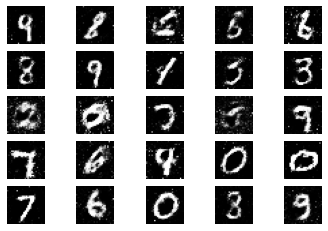

6501 [D loss: 0.670028, acc.: 60.94%] [G loss: 0.835337]
6502 [D loss: 0.665013, acc.: 57.03%] [G loss: 0.848121]
6503 [D loss: 0.655032, acc.: 55.47%] [G loss: 0.886852]
6504 [D loss: 0.633701, acc.: 64.84%] [G loss: 0.858021]
6505 [D loss: 0.642785, acc.: 64.06%] [G loss: 0.876107]
6506 [D loss: 0.622512, acc.: 63.28%] [G loss: 0.875180]
6507 [D loss: 0.669803, acc.: 60.94%] [G loss: 0.877657]
6508 [D loss: 0.643916, acc.: 64.84%] [G loss: 0.890767]
6509 [D loss: 0.675449, acc.: 56.25%] [G loss: 0.872299]
6510 [D loss: 0.680220, acc.: 56.25%] [G loss: 0.886573]
6511 [D loss: 0.677664, acc.: 53.12%] [G loss: 0.880821]
6512 [D loss: 0.639396, acc.: 66.41%] [G loss: 0.870179]
6513 [D loss: 0.680346, acc.: 57.81%] [G loss: 0.914327]
6514 [D loss: 0.680178, acc.: 56.25%] [G loss: 0.911104]
6515 [D loss: 0.665308, acc.: 56.25%] [G loss: 0.891857]
6516 [D loss: 0.671477, acc.: 57.03%] [G loss: 0.893025]
6517 [D loss: 0.612271, acc.: 69.53%] [G loss: 0.975983]
6518 [D loss: 0.672633, acc.: 5

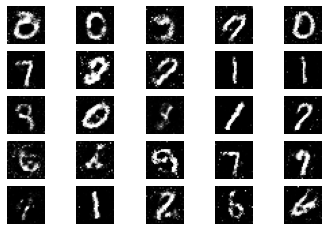

6601 [D loss: 0.655760, acc.: 58.59%] [G loss: 0.864422]
6602 [D loss: 0.668434, acc.: 56.25%] [G loss: 0.872102]
6603 [D loss: 0.642393, acc.: 62.50%] [G loss: 0.877149]
6604 [D loss: 0.668392, acc.: 63.28%] [G loss: 0.886724]
6605 [D loss: 0.643968, acc.: 62.50%] [G loss: 0.896783]
6606 [D loss: 0.679423, acc.: 54.69%] [G loss: 0.895750]
6607 [D loss: 0.707490, acc.: 52.34%] [G loss: 0.881148]
6608 [D loss: 0.612243, acc.: 67.19%] [G loss: 0.885334]
6609 [D loss: 0.655675, acc.: 62.50%] [G loss: 0.862401]
6610 [D loss: 0.665881, acc.: 58.59%] [G loss: 0.895510]
6611 [D loss: 0.666073, acc.: 57.03%] [G loss: 0.857496]
6612 [D loss: 0.667640, acc.: 57.81%] [G loss: 0.846793]
6613 [D loss: 0.625372, acc.: 71.09%] [G loss: 0.854491]
6614 [D loss: 0.707336, acc.: 56.25%] [G loss: 0.897380]
6615 [D loss: 0.654758, acc.: 62.50%] [G loss: 0.885323]
6616 [D loss: 0.633444, acc.: 67.97%] [G loss: 0.851619]
6617 [D loss: 0.688504, acc.: 55.47%] [G loss: 0.905180]
6618 [D loss: 0.678390, acc.: 6

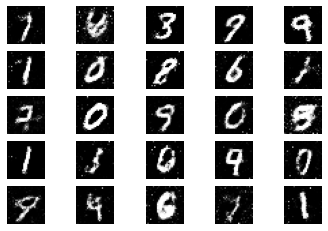

6701 [D loss: 0.667796, acc.: 60.16%] [G loss: 0.882130]
6702 [D loss: 0.667574, acc.: 65.62%] [G loss: 0.895413]
6703 [D loss: 0.613436, acc.: 67.19%] [G loss: 0.914704]
6704 [D loss: 0.669397, acc.: 64.84%] [G loss: 0.911757]
6705 [D loss: 0.646166, acc.: 64.84%] [G loss: 0.891595]
6706 [D loss: 0.640199, acc.: 63.28%] [G loss: 0.875699]
6707 [D loss: 0.669923, acc.: 57.03%] [G loss: 0.927768]
6708 [D loss: 0.659434, acc.: 62.50%] [G loss: 0.933018]
6709 [D loss: 0.641959, acc.: 66.41%] [G loss: 0.880443]
6710 [D loss: 0.664452, acc.: 63.28%] [G loss: 0.895585]
6711 [D loss: 0.653124, acc.: 58.59%] [G loss: 0.905002]
6712 [D loss: 0.649894, acc.: 66.41%] [G loss: 0.907642]
6713 [D loss: 0.665550, acc.: 60.16%] [G loss: 0.889368]
6714 [D loss: 0.643214, acc.: 62.50%] [G loss: 0.866090]
6715 [D loss: 0.675563, acc.: 60.16%] [G loss: 0.886295]
6716 [D loss: 0.644992, acc.: 59.38%] [G loss: 0.844216]
6717 [D loss: 0.696508, acc.: 50.00%] [G loss: 0.866490]
6718 [D loss: 0.679290, acc.: 5

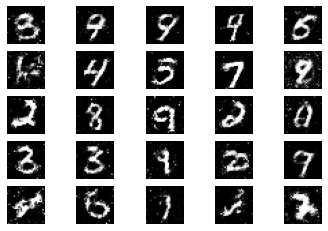

6801 [D loss: 0.634323, acc.: 63.28%] [G loss: 0.874084]
6802 [D loss: 0.654749, acc.: 60.94%] [G loss: 0.847740]
6803 [D loss: 0.662768, acc.: 61.72%] [G loss: 0.876458]
6804 [D loss: 0.663274, acc.: 58.59%] [G loss: 0.866610]
6805 [D loss: 0.640135, acc.: 62.50%] [G loss: 0.905841]
6806 [D loss: 0.648588, acc.: 58.59%] [G loss: 0.865584]
6807 [D loss: 0.602935, acc.: 72.66%] [G loss: 0.848401]
6808 [D loss: 0.622254, acc.: 67.97%] [G loss: 0.874898]
6809 [D loss: 0.669567, acc.: 59.38%] [G loss: 0.847998]
6810 [D loss: 0.634600, acc.: 64.84%] [G loss: 0.915903]
6811 [D loss: 0.638783, acc.: 66.41%] [G loss: 0.897401]
6812 [D loss: 0.682274, acc.: 62.50%] [G loss: 0.893943]
6813 [D loss: 0.643710, acc.: 59.38%] [G loss: 0.868129]
6814 [D loss: 0.693977, acc.: 57.81%] [G loss: 0.839887]
6815 [D loss: 0.640838, acc.: 62.50%] [G loss: 0.836933]
6816 [D loss: 0.648130, acc.: 58.59%] [G loss: 0.843173]
6817 [D loss: 0.662695, acc.: 64.06%] [G loss: 0.901689]
6818 [D loss: 0.642785, acc.: 6

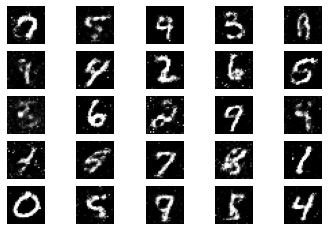

6901 [D loss: 0.645366, acc.: 61.72%] [G loss: 0.854579]
6902 [D loss: 0.681340, acc.: 53.12%] [G loss: 0.902929]
6903 [D loss: 0.638619, acc.: 64.06%] [G loss: 0.860395]
6904 [D loss: 0.675907, acc.: 57.81%] [G loss: 0.861284]
6905 [D loss: 0.658090, acc.: 65.62%] [G loss: 0.850597]
6906 [D loss: 0.714591, acc.: 53.12%] [G loss: 0.869155]
6907 [D loss: 0.648717, acc.: 57.81%] [G loss: 0.853892]
6908 [D loss: 0.625321, acc.: 70.31%] [G loss: 0.930204]
6909 [D loss: 0.689123, acc.: 55.47%] [G loss: 0.890884]
6910 [D loss: 0.657451, acc.: 58.59%] [G loss: 0.926474]
6911 [D loss: 0.689098, acc.: 50.78%] [G loss: 0.897710]
6912 [D loss: 0.683733, acc.: 57.03%] [G loss: 0.880698]
6913 [D loss: 0.665602, acc.: 59.38%] [G loss: 0.876194]
6914 [D loss: 0.650705, acc.: 57.81%] [G loss: 0.872022]
6915 [D loss: 0.644405, acc.: 62.50%] [G loss: 0.871886]
6916 [D loss: 0.595771, acc.: 72.66%] [G loss: 0.840704]
6917 [D loss: 0.669915, acc.: 62.50%] [G loss: 0.862826]
6918 [D loss: 0.665205, acc.: 6

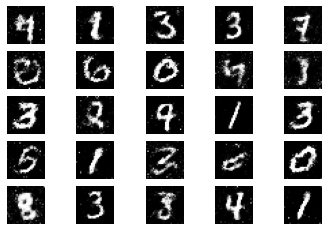

7001 [D loss: 0.709831, acc.: 50.00%] [G loss: 0.881221]
7002 [D loss: 0.675786, acc.: 60.94%] [G loss: 0.930156]
7003 [D loss: 0.677379, acc.: 60.94%] [G loss: 0.886109]
7004 [D loss: 0.639754, acc.: 70.31%] [G loss: 0.891419]
7005 [D loss: 0.651103, acc.: 67.97%] [G loss: 0.862944]
7006 [D loss: 0.666956, acc.: 57.03%] [G loss: 0.918188]
7007 [D loss: 0.673753, acc.: 59.38%] [G loss: 0.880561]
7008 [D loss: 0.640503, acc.: 59.38%] [G loss: 0.854354]
7009 [D loss: 0.623854, acc.: 67.97%] [G loss: 0.892166]
7010 [D loss: 0.647493, acc.: 69.53%] [G loss: 0.868469]
7011 [D loss: 0.686479, acc.: 53.91%] [G loss: 0.773880]
7012 [D loss: 0.648684, acc.: 60.16%] [G loss: 0.846442]
7013 [D loss: 0.643787, acc.: 65.62%] [G loss: 0.859230]
7014 [D loss: 0.644629, acc.: 63.28%] [G loss: 0.895700]
7015 [D loss: 0.642017, acc.: 61.72%] [G loss: 0.915518]
7016 [D loss: 0.672818, acc.: 54.69%] [G loss: 0.864126]
7017 [D loss: 0.669818, acc.: 55.47%] [G loss: 0.898407]
7018 [D loss: 0.691798, acc.: 5

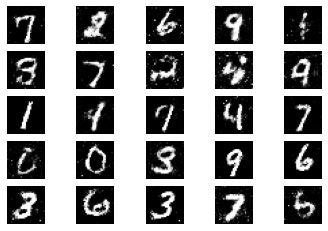

7101 [D loss: 0.688274, acc.: 57.81%] [G loss: 0.861036]
7102 [D loss: 0.636391, acc.: 67.19%] [G loss: 0.897160]
7103 [D loss: 0.625657, acc.: 64.84%] [G loss: 0.840446]
7104 [D loss: 0.661235, acc.: 57.03%] [G loss: 0.904012]
7105 [D loss: 0.632796, acc.: 61.72%] [G loss: 0.923833]
7106 [D loss: 0.676419, acc.: 54.69%] [G loss: 0.935059]
7107 [D loss: 0.663309, acc.: 55.47%] [G loss: 0.949927]
7108 [D loss: 0.641386, acc.: 64.06%] [G loss: 0.910115]
7109 [D loss: 0.663714, acc.: 64.84%] [G loss: 0.872384]
7110 [D loss: 0.661415, acc.: 60.16%] [G loss: 0.881498]
7111 [D loss: 0.656177, acc.: 63.28%] [G loss: 0.879538]
7112 [D loss: 0.661627, acc.: 57.03%] [G loss: 0.898428]
7113 [D loss: 0.634780, acc.: 62.50%] [G loss: 0.880487]
7114 [D loss: 0.651365, acc.: 56.25%] [G loss: 0.878205]
7115 [D loss: 0.677446, acc.: 56.25%] [G loss: 0.858161]
7116 [D loss: 0.699361, acc.: 48.44%] [G loss: 0.869104]
7117 [D loss: 0.634953, acc.: 61.72%] [G loss: 0.896398]
7118 [D loss: 0.646840, acc.: 6

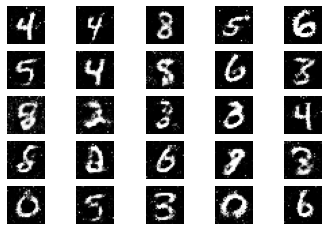

7201 [D loss: 0.659530, acc.: 57.03%] [G loss: 0.889353]
7202 [D loss: 0.634105, acc.: 68.75%] [G loss: 0.860244]
7203 [D loss: 0.664750, acc.: 59.38%] [G loss: 0.835602]
7204 [D loss: 0.678132, acc.: 60.16%] [G loss: 0.849439]
7205 [D loss: 0.655369, acc.: 59.38%] [G loss: 0.904857]
7206 [D loss: 0.678069, acc.: 56.25%] [G loss: 0.850120]
7207 [D loss: 0.675034, acc.: 60.94%] [G loss: 0.832646]
7208 [D loss: 0.655247, acc.: 61.72%] [G loss: 0.863157]
7209 [D loss: 0.650595, acc.: 58.59%] [G loss: 0.900040]
7210 [D loss: 0.646820, acc.: 60.16%] [G loss: 0.884236]
7211 [D loss: 0.659028, acc.: 58.59%] [G loss: 0.894041]
7212 [D loss: 0.657519, acc.: 64.06%] [G loss: 0.871250]
7213 [D loss: 0.688718, acc.: 53.12%] [G loss: 0.905341]
7214 [D loss: 0.630253, acc.: 66.41%] [G loss: 0.889386]
7215 [D loss: 0.658450, acc.: 60.94%] [G loss: 0.909032]
7216 [D loss: 0.646112, acc.: 64.06%] [G loss: 0.889937]
7217 [D loss: 0.665977, acc.: 60.16%] [G loss: 0.870399]
7218 [D loss: 0.652725, acc.: 6

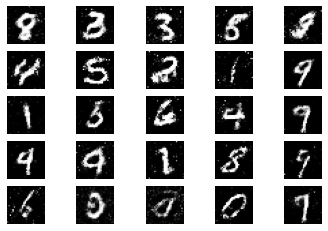

7301 [D loss: 0.639656, acc.: 60.94%] [G loss: 0.858379]
7302 [D loss: 0.655327, acc.: 64.84%] [G loss: 0.889447]
7303 [D loss: 0.672543, acc.: 58.59%] [G loss: 0.917849]
7304 [D loss: 0.625336, acc.: 69.53%] [G loss: 0.871689]
7305 [D loss: 0.641599, acc.: 67.19%] [G loss: 0.874213]
7306 [D loss: 0.656033, acc.: 57.81%] [G loss: 0.898794]
7307 [D loss: 0.680379, acc.: 56.25%] [G loss: 0.875111]
7308 [D loss: 0.658446, acc.: 59.38%] [G loss: 0.858155]
7309 [D loss: 0.655067, acc.: 60.16%] [G loss: 0.885426]
7310 [D loss: 0.681251, acc.: 58.59%] [G loss: 0.881234]
7311 [D loss: 0.661019, acc.: 58.59%] [G loss: 0.850773]
7312 [D loss: 0.686056, acc.: 54.69%] [G loss: 0.887773]
7313 [D loss: 0.632888, acc.: 61.72%] [G loss: 0.866411]
7314 [D loss: 0.641583, acc.: 64.06%] [G loss: 0.834009]
7315 [D loss: 0.633706, acc.: 66.41%] [G loss: 0.797751]
7316 [D loss: 0.670650, acc.: 56.25%] [G loss: 0.891545]
7317 [D loss: 0.606471, acc.: 71.09%] [G loss: 0.858234]
7318 [D loss: 0.635195, acc.: 6

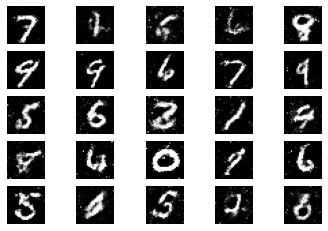

7401 [D loss: 0.643291, acc.: 64.84%] [G loss: 0.949644]
7402 [D loss: 0.670339, acc.: 63.28%] [G loss: 0.930952]
7403 [D loss: 0.654066, acc.: 62.50%] [G loss: 0.905622]
7404 [D loss: 0.676845, acc.: 61.72%] [G loss: 0.852505]
7405 [D loss: 0.684679, acc.: 53.12%] [G loss: 0.911225]
7406 [D loss: 0.662377, acc.: 59.38%] [G loss: 0.895317]
7407 [D loss: 0.665756, acc.: 57.03%] [G loss: 0.920552]
7408 [D loss: 0.621298, acc.: 64.06%] [G loss: 0.897865]
7409 [D loss: 0.625288, acc.: 64.84%] [G loss: 0.905885]
7410 [D loss: 0.639269, acc.: 65.62%] [G loss: 0.867053]
7411 [D loss: 0.601734, acc.: 66.41%] [G loss: 0.852796]
7412 [D loss: 0.634086, acc.: 61.72%] [G loss: 0.885001]
7413 [D loss: 0.652071, acc.: 66.41%] [G loss: 0.900782]
7414 [D loss: 0.687576, acc.: 59.38%] [G loss: 0.882215]
7415 [D loss: 0.645987, acc.: 60.94%] [G loss: 0.888580]
7416 [D loss: 0.667386, acc.: 60.94%] [G loss: 0.851654]
7417 [D loss: 0.653425, acc.: 61.72%] [G loss: 0.896912]
7418 [D loss: 0.623344, acc.: 6

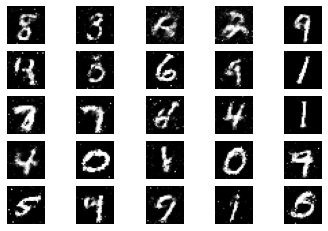

7501 [D loss: 0.695253, acc.: 54.69%] [G loss: 0.932061]
7502 [D loss: 0.641558, acc.: 60.16%] [G loss: 0.868397]
7503 [D loss: 0.641798, acc.: 66.41%] [G loss: 0.877638]
7504 [D loss: 0.664036, acc.: 60.16%] [G loss: 0.922613]
7505 [D loss: 0.667613, acc.: 63.28%] [G loss: 0.920552]
7506 [D loss: 0.652067, acc.: 58.59%] [G loss: 0.923892]
7507 [D loss: 0.702724, acc.: 54.69%] [G loss: 0.920044]
7508 [D loss: 0.705630, acc.: 48.44%] [G loss: 0.818530]
7509 [D loss: 0.652554, acc.: 66.41%] [G loss: 0.867777]
7510 [D loss: 0.643233, acc.: 63.28%] [G loss: 0.818886]
7511 [D loss: 0.694393, acc.: 53.91%] [G loss: 0.837610]
7512 [D loss: 0.633655, acc.: 68.75%] [G loss: 0.855584]
7513 [D loss: 0.704760, acc.: 47.66%] [G loss: 0.875954]
7514 [D loss: 0.599405, acc.: 71.09%] [G loss: 0.847731]
7515 [D loss: 0.682199, acc.: 57.81%] [G loss: 0.878273]
7516 [D loss: 0.675643, acc.: 59.38%] [G loss: 0.860800]
7517 [D loss: 0.631169, acc.: 67.19%] [G loss: 0.858230]
7518 [D loss: 0.627958, acc.: 6

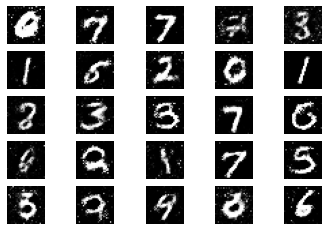

7601 [D loss: 0.644784, acc.: 62.50%] [G loss: 0.911467]
7602 [D loss: 0.649233, acc.: 62.50%] [G loss: 0.899503]
7603 [D loss: 0.634029, acc.: 62.50%] [G loss: 0.861305]
7604 [D loss: 0.659645, acc.: 62.50%] [G loss: 0.859113]
7605 [D loss: 0.604750, acc.: 67.97%] [G loss: 0.947909]
7606 [D loss: 0.647387, acc.: 64.84%] [G loss: 0.916919]
7607 [D loss: 0.670943, acc.: 57.03%] [G loss: 0.863331]
7608 [D loss: 0.660708, acc.: 59.38%] [G loss: 0.874978]
7609 [D loss: 0.667527, acc.: 58.59%] [G loss: 0.845215]
7610 [D loss: 0.656913, acc.: 65.62%] [G loss: 0.852701]
7611 [D loss: 0.667917, acc.: 58.59%] [G loss: 0.864443]
7612 [D loss: 0.677851, acc.: 57.03%] [G loss: 0.879743]
7613 [D loss: 0.660714, acc.: 58.59%] [G loss: 0.875523]
7614 [D loss: 0.668612, acc.: 57.81%] [G loss: 0.933657]
7615 [D loss: 0.612681, acc.: 67.97%] [G loss: 0.870004]
7616 [D loss: 0.703469, acc.: 54.69%] [G loss: 0.908083]
7617 [D loss: 0.647472, acc.: 58.59%] [G loss: 0.931992]
7618 [D loss: 0.682624, acc.: 6

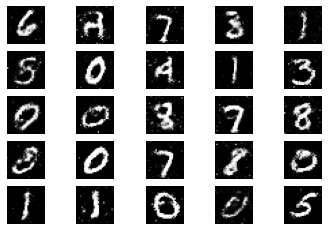

7701 [D loss: 0.650533, acc.: 59.38%] [G loss: 0.889818]
7702 [D loss: 0.667617, acc.: 56.25%] [G loss: 0.864927]
7703 [D loss: 0.656801, acc.: 61.72%] [G loss: 0.863572]
7704 [D loss: 0.661790, acc.: 60.16%] [G loss: 0.841718]
7705 [D loss: 0.654417, acc.: 67.97%] [G loss: 0.817466]
7706 [D loss: 0.653640, acc.: 59.38%] [G loss: 0.829076]
7707 [D loss: 0.701305, acc.: 55.47%] [G loss: 0.826303]
7708 [D loss: 0.631980, acc.: 64.84%] [G loss: 0.847252]
7709 [D loss: 0.685910, acc.: 49.22%] [G loss: 0.887709]
7710 [D loss: 0.658726, acc.: 63.28%] [G loss: 0.899929]
7711 [D loss: 0.669089, acc.: 61.72%] [G loss: 0.895235]
7712 [D loss: 0.664824, acc.: 56.25%] [G loss: 0.895242]
7713 [D loss: 0.684584, acc.: 55.47%] [G loss: 0.854383]
7714 [D loss: 0.714459, acc.: 49.22%] [G loss: 0.901151]
7715 [D loss: 0.699359, acc.: 50.78%] [G loss: 0.933753]
7716 [D loss: 0.675361, acc.: 60.16%] [G loss: 0.896580]
7717 [D loss: 0.688404, acc.: 57.81%] [G loss: 0.878612]
7718 [D loss: 0.673791, acc.: 5

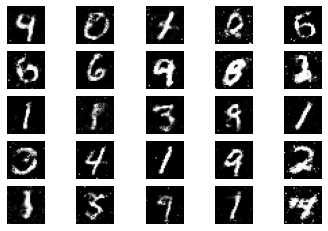

7801 [D loss: 0.620296, acc.: 64.84%] [G loss: 0.895085]
7802 [D loss: 0.640564, acc.: 67.19%] [G loss: 0.853734]
7803 [D loss: 0.633453, acc.: 69.53%] [G loss: 0.841358]
7804 [D loss: 0.641747, acc.: 58.59%] [G loss: 0.875425]
7805 [D loss: 0.679579, acc.: 57.81%] [G loss: 0.912888]
7806 [D loss: 0.672917, acc.: 58.59%] [G loss: 0.929317]
7807 [D loss: 0.655573, acc.: 62.50%] [G loss: 0.874401]
7808 [D loss: 0.654328, acc.: 58.59%] [G loss: 0.873173]
7809 [D loss: 0.676871, acc.: 54.69%] [G loss: 0.903584]
7810 [D loss: 0.645879, acc.: 67.97%] [G loss: 0.881386]
7811 [D loss: 0.637781, acc.: 59.38%] [G loss: 0.879315]
7812 [D loss: 0.624649, acc.: 67.19%] [G loss: 0.906690]
7813 [D loss: 0.673092, acc.: 57.81%] [G loss: 0.954277]
7814 [D loss: 0.715835, acc.: 50.00%] [G loss: 0.898679]
7815 [D loss: 0.661326, acc.: 59.38%] [G loss: 0.874453]
7816 [D loss: 0.672488, acc.: 57.03%] [G loss: 0.872502]
7817 [D loss: 0.678016, acc.: 54.69%] [G loss: 0.881061]
7818 [D loss: 0.622896, acc.: 6

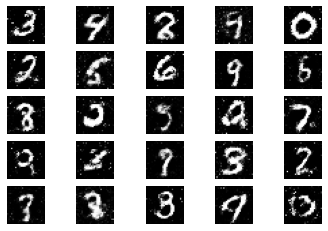

7901 [D loss: 0.676578, acc.: 60.16%] [G loss: 0.852340]
7902 [D loss: 0.660365, acc.: 61.72%] [G loss: 0.868005]
7903 [D loss: 0.651800, acc.: 63.28%] [G loss: 0.822554]
7904 [D loss: 0.643972, acc.: 62.50%] [G loss: 0.846918]
7905 [D loss: 0.638845, acc.: 64.84%] [G loss: 0.857889]
7906 [D loss: 0.657560, acc.: 63.28%] [G loss: 0.897294]
7907 [D loss: 0.645448, acc.: 62.50%] [G loss: 0.808406]
7908 [D loss: 0.661664, acc.: 61.72%] [G loss: 0.896188]
7909 [D loss: 0.655198, acc.: 61.72%] [G loss: 0.892055]
7910 [D loss: 0.701742, acc.: 52.34%] [G loss: 0.862201]
7911 [D loss: 0.624569, acc.: 62.50%] [G loss: 0.847296]
7912 [D loss: 0.741501, acc.: 51.56%] [G loss: 0.956924]
7913 [D loss: 0.719610, acc.: 50.00%] [G loss: 0.902644]
7914 [D loss: 0.627147, acc.: 64.84%] [G loss: 0.927815]
7915 [D loss: 0.653389, acc.: 61.72%] [G loss: 0.904186]
7916 [D loss: 0.710055, acc.: 48.44%] [G loss: 0.873055]
7917 [D loss: 0.664514, acc.: 57.03%] [G loss: 0.891730]
7918 [D loss: 0.673316, acc.: 5

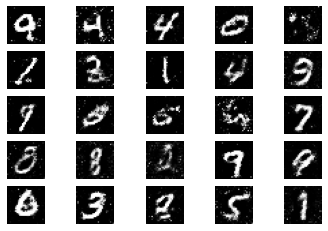

8001 [D loss: 0.638586, acc.: 62.50%] [G loss: 0.909485]
8002 [D loss: 0.641392, acc.: 63.28%] [G loss: 0.858826]
8003 [D loss: 0.698911, acc.: 53.12%] [G loss: 0.868049]
8004 [D loss: 0.633278, acc.: 66.41%] [G loss: 0.880537]
8005 [D loss: 0.644234, acc.: 66.41%] [G loss: 0.897153]
8006 [D loss: 0.606401, acc.: 71.88%] [G loss: 0.852319]
8007 [D loss: 0.699983, acc.: 57.03%] [G loss: 0.921110]
8008 [D loss: 0.622842, acc.: 64.84%] [G loss: 0.854987]
8009 [D loss: 0.677412, acc.: 57.03%] [G loss: 0.877761]
8010 [D loss: 0.668778, acc.: 62.50%] [G loss: 0.851783]
8011 [D loss: 0.638587, acc.: 66.41%] [G loss: 0.902182]
8012 [D loss: 0.685259, acc.: 60.16%] [G loss: 0.865683]
8013 [D loss: 0.672149, acc.: 60.16%] [G loss: 0.904925]
8014 [D loss: 0.658423, acc.: 68.75%] [G loss: 0.921615]
8015 [D loss: 0.690948, acc.: 57.03%] [G loss: 0.867117]
8016 [D loss: 0.650553, acc.: 62.50%] [G loss: 0.874555]
8017 [D loss: 0.661269, acc.: 64.06%] [G loss: 0.832456]
8018 [D loss: 0.659660, acc.: 6

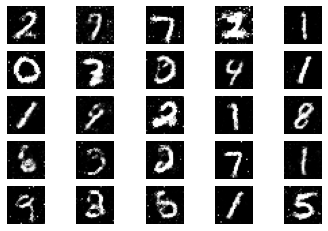

8101 [D loss: 0.670361, acc.: 60.16%] [G loss: 0.913360]
8102 [D loss: 0.681702, acc.: 53.12%] [G loss: 0.859409]
8103 [D loss: 0.641490, acc.: 61.72%] [G loss: 0.878072]
8104 [D loss: 0.658364, acc.: 65.62%] [G loss: 0.927282]
8105 [D loss: 0.647488, acc.: 61.72%] [G loss: 0.913568]
8106 [D loss: 0.675014, acc.: 54.69%] [G loss: 0.917442]
8107 [D loss: 0.608236, acc.: 67.97%] [G loss: 0.919261]
8108 [D loss: 0.666431, acc.: 60.16%] [G loss: 0.915113]
8109 [D loss: 0.673237, acc.: 57.81%] [G loss: 0.856230]
8110 [D loss: 0.694983, acc.: 54.69%] [G loss: 0.830562]
8111 [D loss: 0.630299, acc.: 67.97%] [G loss: 0.816946]
8112 [D loss: 0.629112, acc.: 67.19%] [G loss: 0.893088]
8113 [D loss: 0.632538, acc.: 60.16%] [G loss: 0.884679]
8114 [D loss: 0.666928, acc.: 60.94%] [G loss: 0.872948]
8115 [D loss: 0.648442, acc.: 64.84%] [G loss: 0.901969]
8116 [D loss: 0.713944, acc.: 53.91%] [G loss: 0.898593]
8117 [D loss: 0.652771, acc.: 64.84%] [G loss: 0.855116]
8118 [D loss: 0.631326, acc.: 6

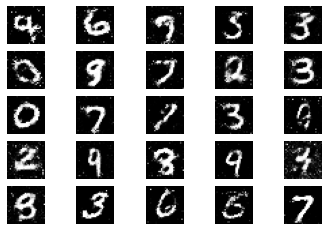

8201 [D loss: 0.681695, acc.: 54.69%] [G loss: 0.906486]
8202 [D loss: 0.714553, acc.: 56.25%] [G loss: 0.871711]
8203 [D loss: 0.643940, acc.: 62.50%] [G loss: 0.876392]
8204 [D loss: 0.670317, acc.: 58.59%] [G loss: 0.914629]
8205 [D loss: 0.656288, acc.: 63.28%] [G loss: 0.899282]
8206 [D loss: 0.660461, acc.: 57.03%] [G loss: 0.926340]
8207 [D loss: 0.653211, acc.: 62.50%] [G loss: 0.893580]
8208 [D loss: 0.660313, acc.: 60.94%] [G loss: 0.919909]
8209 [D loss: 0.633400, acc.: 67.97%] [G loss: 0.905458]
8210 [D loss: 0.676599, acc.: 60.94%] [G loss: 0.880855]
8211 [D loss: 0.646139, acc.: 65.62%] [G loss: 0.929154]
8212 [D loss: 0.662488, acc.: 60.94%] [G loss: 0.834976]
8213 [D loss: 0.668252, acc.: 64.84%] [G loss: 0.898091]
8214 [D loss: 0.671857, acc.: 57.81%] [G loss: 0.892763]
8215 [D loss: 0.629973, acc.: 66.41%] [G loss: 0.879505]
8216 [D loss: 0.618705, acc.: 67.19%] [G loss: 0.958608]
8217 [D loss: 0.617407, acc.: 67.19%] [G loss: 0.935355]
8218 [D loss: 0.643498, acc.: 6

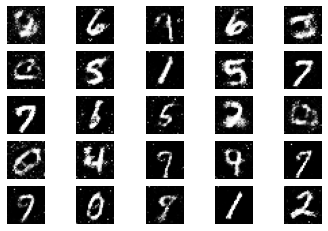

8301 [D loss: 0.669541, acc.: 62.50%] [G loss: 0.900462]
8302 [D loss: 0.625745, acc.: 68.75%] [G loss: 0.853753]
8303 [D loss: 0.621303, acc.: 68.75%] [G loss: 0.894343]
8304 [D loss: 0.710193, acc.: 50.00%] [G loss: 0.909159]
8305 [D loss: 0.678521, acc.: 59.38%] [G loss: 0.896804]
8306 [D loss: 0.644479, acc.: 66.41%] [G loss: 0.838484]
8307 [D loss: 0.676811, acc.: 61.72%] [G loss: 0.853570]
8308 [D loss: 0.673926, acc.: 58.59%] [G loss: 0.845342]
8309 [D loss: 0.640436, acc.: 63.28%] [G loss: 0.942984]
8310 [D loss: 0.655055, acc.: 64.06%] [G loss: 0.899257]
8311 [D loss: 0.652008, acc.: 60.16%] [G loss: 0.894426]
8312 [D loss: 0.636476, acc.: 63.28%] [G loss: 0.876194]
8313 [D loss: 0.697232, acc.: 54.69%] [G loss: 0.909561]
8314 [D loss: 0.669239, acc.: 58.59%] [G loss: 0.838690]
8315 [D loss: 0.659215, acc.: 61.72%] [G loss: 0.870726]
8316 [D loss: 0.624491, acc.: 65.62%] [G loss: 0.803652]
8317 [D loss: 0.683925, acc.: 60.16%] [G loss: 0.848131]
8318 [D loss: 0.689032, acc.: 5

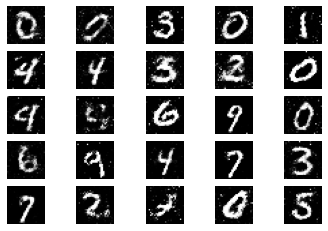

8401 [D loss: 0.661260, acc.: 60.94%] [G loss: 0.797463]
8402 [D loss: 0.643843, acc.: 67.97%] [G loss: 0.860984]
8403 [D loss: 0.657366, acc.: 61.72%] [G loss: 0.861271]
8404 [D loss: 0.668928, acc.: 58.59%] [G loss: 0.896250]
8405 [D loss: 0.646877, acc.: 61.72%] [G loss: 0.928086]
8406 [D loss: 0.653999, acc.: 54.69%] [G loss: 0.867315]
8407 [D loss: 0.667349, acc.: 60.94%] [G loss: 0.913207]
8408 [D loss: 0.662314, acc.: 59.38%] [G loss: 0.899137]
8409 [D loss: 0.698531, acc.: 52.34%] [G loss: 0.829690]
8410 [D loss: 0.699541, acc.: 53.12%] [G loss: 0.856084]
8411 [D loss: 0.613862, acc.: 67.97%] [G loss: 0.889599]
8412 [D loss: 0.642158, acc.: 63.28%] [G loss: 0.922463]
8413 [D loss: 0.680483, acc.: 59.38%] [G loss: 0.854165]
8414 [D loss: 0.641716, acc.: 66.41%] [G loss: 0.928691]
8415 [D loss: 0.669956, acc.: 59.38%] [G loss: 0.943778]
8416 [D loss: 0.681424, acc.: 52.34%] [G loss: 0.851181]
8417 [D loss: 0.671812, acc.: 58.59%] [G loss: 0.890345]
8418 [D loss: 0.633552, acc.: 6

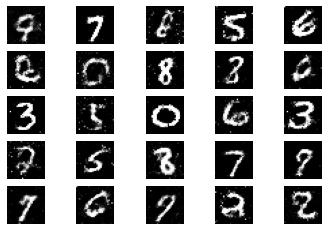

8501 [D loss: 0.717235, acc.: 51.56%] [G loss: 0.861299]
8502 [D loss: 0.664491, acc.: 54.69%] [G loss: 0.877751]
8503 [D loss: 0.676202, acc.: 62.50%] [G loss: 0.932375]
8504 [D loss: 0.679604, acc.: 59.38%] [G loss: 0.891293]
8505 [D loss: 0.671307, acc.: 57.03%] [G loss: 0.947304]
8506 [D loss: 0.661401, acc.: 60.16%] [G loss: 0.917703]
8507 [D loss: 0.671102, acc.: 56.25%] [G loss: 0.861920]
8508 [D loss: 0.660444, acc.: 57.03%] [G loss: 0.878217]
8509 [D loss: 0.684052, acc.: 54.69%] [G loss: 0.890227]
8510 [D loss: 0.651990, acc.: 63.28%] [G loss: 0.870466]
8511 [D loss: 0.696473, acc.: 57.03%] [G loss: 0.902900]
8512 [D loss: 0.666633, acc.: 56.25%] [G loss: 0.884659]
8513 [D loss: 0.640695, acc.: 67.19%] [G loss: 0.873477]
8514 [D loss: 0.664021, acc.: 57.81%] [G loss: 0.930338]
8515 [D loss: 0.640207, acc.: 64.84%] [G loss: 0.867754]
8516 [D loss: 0.663335, acc.: 62.50%] [G loss: 0.866387]
8517 [D loss: 0.680415, acc.: 58.59%] [G loss: 0.874532]
8518 [D loss: 0.632434, acc.: 6

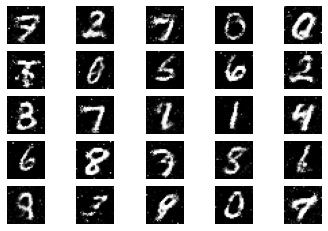

8601 [D loss: 0.622186, acc.: 66.41%] [G loss: 0.946515]
8602 [D loss: 0.628201, acc.: 64.84%] [G loss: 0.934181]
8603 [D loss: 0.648566, acc.: 64.06%] [G loss: 0.889745]
8604 [D loss: 0.662096, acc.: 56.25%] [G loss: 0.902837]
8605 [D loss: 0.624554, acc.: 67.97%] [G loss: 0.947778]
8606 [D loss: 0.634440, acc.: 64.06%] [G loss: 0.849780]
8607 [D loss: 0.680152, acc.: 50.78%] [G loss: 0.894204]
8608 [D loss: 0.636115, acc.: 67.19%] [G loss: 0.847916]
8609 [D loss: 0.694990, acc.: 49.22%] [G loss: 0.977827]
8610 [D loss: 0.655936, acc.: 64.06%] [G loss: 0.896124]
8611 [D loss: 0.705172, acc.: 51.56%] [G loss: 0.927355]
8612 [D loss: 0.598466, acc.: 68.75%] [G loss: 0.932213]
8613 [D loss: 0.664322, acc.: 60.94%] [G loss: 0.910086]
8614 [D loss: 0.656794, acc.: 60.94%] [G loss: 0.865252]
8615 [D loss: 0.660146, acc.: 57.81%] [G loss: 0.871117]
8616 [D loss: 0.654107, acc.: 62.50%] [G loss: 0.895127]
8617 [D loss: 0.646435, acc.: 64.06%] [G loss: 0.911198]
8618 [D loss: 0.680114, acc.: 5

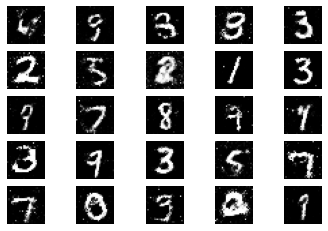

8701 [D loss: 0.676385, acc.: 54.69%] [G loss: 0.956466]
8702 [D loss: 0.616662, acc.: 64.06%] [G loss: 0.901874]
8703 [D loss: 0.664535, acc.: 60.16%] [G loss: 0.871948]
8704 [D loss: 0.663328, acc.: 60.94%] [G loss: 0.849413]
8705 [D loss: 0.640952, acc.: 67.97%] [G loss: 0.882338]
8706 [D loss: 0.631095, acc.: 61.72%] [G loss: 0.907828]
8707 [D loss: 0.657499, acc.: 62.50%] [G loss: 0.841075]
8708 [D loss: 0.682313, acc.: 55.47%] [G loss: 0.890443]
8709 [D loss: 0.618968, acc.: 59.38%] [G loss: 0.879123]
8710 [D loss: 0.633061, acc.: 64.84%] [G loss: 0.874409]
8711 [D loss: 0.646629, acc.: 64.84%] [G loss: 0.898947]
8712 [D loss: 0.641051, acc.: 66.41%] [G loss: 0.921760]
8713 [D loss: 0.645596, acc.: 64.06%] [G loss: 0.887341]
8714 [D loss: 0.671557, acc.: 57.81%] [G loss: 0.916802]
8715 [D loss: 0.642831, acc.: 65.62%] [G loss: 0.919167]
8716 [D loss: 0.637666, acc.: 65.62%] [G loss: 0.911920]
8717 [D loss: 0.661310, acc.: 56.25%] [G loss: 0.869012]
8718 [D loss: 0.643819, acc.: 6

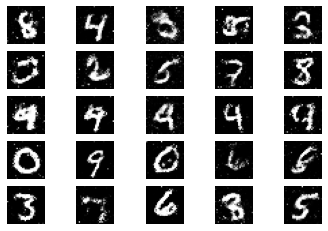

8801 [D loss: 0.681161, acc.: 57.81%] [G loss: 0.912476]
8802 [D loss: 0.670206, acc.: 58.59%] [G loss: 0.858057]
8803 [D loss: 0.669205, acc.: 60.16%] [G loss: 0.913755]
8804 [D loss: 0.681880, acc.: 54.69%] [G loss: 0.843890]
8805 [D loss: 0.652853, acc.: 60.16%] [G loss: 0.816968]
8806 [D loss: 0.685527, acc.: 53.91%] [G loss: 0.816924]
8807 [D loss: 0.629827, acc.: 61.72%] [G loss: 0.813887]
8808 [D loss: 0.644086, acc.: 63.28%] [G loss: 0.828061]
8809 [D loss: 0.660388, acc.: 57.03%] [G loss: 0.851026]
8810 [D loss: 0.663289, acc.: 62.50%] [G loss: 0.923416]
8811 [D loss: 0.665453, acc.: 57.03%] [G loss: 0.861354]
8812 [D loss: 0.635225, acc.: 67.97%] [G loss: 0.763502]
8813 [D loss: 0.666923, acc.: 57.81%] [G loss: 0.826099]
8814 [D loss: 0.657696, acc.: 57.81%] [G loss: 0.834463]
8815 [D loss: 0.639955, acc.: 66.41%] [G loss: 0.883155]
8816 [D loss: 0.636378, acc.: 64.06%] [G loss: 0.868771]
8817 [D loss: 0.674933, acc.: 57.03%] [G loss: 0.907471]
8818 [D loss: 0.704986, acc.: 5

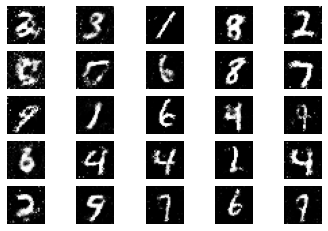

8901 [D loss: 0.661554, acc.: 59.38%] [G loss: 0.864079]
8902 [D loss: 0.662423, acc.: 62.50%] [G loss: 0.861799]
8903 [D loss: 0.644000, acc.: 63.28%] [G loss: 0.869740]
8904 [D loss: 0.693149, acc.: 53.12%] [G loss: 0.855629]
8905 [D loss: 0.634027, acc.: 64.84%] [G loss: 0.946525]
8906 [D loss: 0.701240, acc.: 52.34%] [G loss: 0.875515]
8907 [D loss: 0.660510, acc.: 60.16%] [G loss: 0.900531]
8908 [D loss: 0.672317, acc.: 57.81%] [G loss: 0.932923]
8909 [D loss: 0.642109, acc.: 63.28%] [G loss: 0.880726]
8910 [D loss: 0.652043, acc.: 60.94%] [G loss: 0.860695]
8911 [D loss: 0.667099, acc.: 57.03%] [G loss: 0.938846]
8912 [D loss: 0.646254, acc.: 60.16%] [G loss: 0.888736]
8913 [D loss: 0.650902, acc.: 56.25%] [G loss: 0.855410]
8914 [D loss: 0.641672, acc.: 64.06%] [G loss: 0.854679]
8915 [D loss: 0.679386, acc.: 54.69%] [G loss: 0.868257]
8916 [D loss: 0.683977, acc.: 55.47%] [G loss: 0.856124]
8917 [D loss: 0.637287, acc.: 60.16%] [G loss: 0.864234]
8918 [D loss: 0.633439, acc.: 6

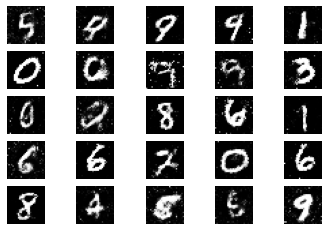

9001 [D loss: 0.677763, acc.: 53.91%] [G loss: 0.874695]
9002 [D loss: 0.638131, acc.: 67.97%] [G loss: 0.901485]
9003 [D loss: 0.664310, acc.: 63.28%] [G loss: 0.900275]
9004 [D loss: 0.696262, acc.: 57.81%] [G loss: 0.899548]
9005 [D loss: 0.666756, acc.: 56.25%] [G loss: 0.872267]
9006 [D loss: 0.628093, acc.: 64.84%] [G loss: 0.840691]
9007 [D loss: 0.669712, acc.: 57.03%] [G loss: 0.890594]
9008 [D loss: 0.661645, acc.: 60.94%] [G loss: 0.885297]
9009 [D loss: 0.652557, acc.: 61.72%] [G loss: 0.902670]
9010 [D loss: 0.665115, acc.: 64.06%] [G loss: 0.854272]
9011 [D loss: 0.659718, acc.: 58.59%] [G loss: 0.921797]
9012 [D loss: 0.667455, acc.: 57.81%] [G loss: 0.839324]
9013 [D loss: 0.647005, acc.: 64.06%] [G loss: 0.873774]
9014 [D loss: 0.678127, acc.: 60.16%] [G loss: 0.859524]
9015 [D loss: 0.669494, acc.: 59.38%] [G loss: 0.904963]
9016 [D loss: 0.641101, acc.: 62.50%] [G loss: 0.865316]
9017 [D loss: 0.685589, acc.: 59.38%] [G loss: 0.859912]
9018 [D loss: 0.658699, acc.: 6

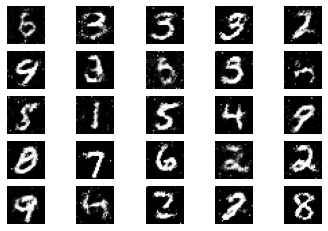

9101 [D loss: 0.671324, acc.: 58.59%] [G loss: 0.850154]
9102 [D loss: 0.697277, acc.: 52.34%] [G loss: 0.913476]
9103 [D loss: 0.660618, acc.: 57.81%] [G loss: 0.887582]
9104 [D loss: 0.709493, acc.: 49.22%] [G loss: 0.915466]
9105 [D loss: 0.667295, acc.: 57.03%] [G loss: 0.903918]
9106 [D loss: 0.650667, acc.: 60.16%] [G loss: 0.900172]
9107 [D loss: 0.676580, acc.: 57.03%] [G loss: 0.864649]
9108 [D loss: 0.637987, acc.: 63.28%] [G loss: 0.888850]
9109 [D loss: 0.664448, acc.: 63.28%] [G loss: 0.887848]
9110 [D loss: 0.626197, acc.: 67.97%] [G loss: 0.911206]
9111 [D loss: 0.627391, acc.: 68.75%] [G loss: 0.944546]
9112 [D loss: 0.635351, acc.: 66.41%] [G loss: 0.933531]
9113 [D loss: 0.607994, acc.: 64.06%] [G loss: 0.910826]
9114 [D loss: 0.688980, acc.: 53.12%] [G loss: 0.854754]
9115 [D loss: 0.622378, acc.: 62.50%] [G loss: 0.818841]
9116 [D loss: 0.658875, acc.: 60.94%] [G loss: 0.930520]
9117 [D loss: 0.616295, acc.: 71.09%] [G loss: 0.922922]
9118 [D loss: 0.638547, acc.: 6

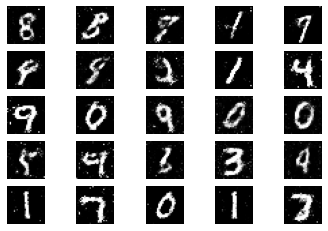

9201 [D loss: 0.685391, acc.: 55.47%] [G loss: 0.869051]
9202 [D loss: 0.673175, acc.: 53.12%] [G loss: 0.918592]
9203 [D loss: 0.650160, acc.: 60.16%] [G loss: 0.924330]
9204 [D loss: 0.681476, acc.: 57.03%] [G loss: 0.905733]
9205 [D loss: 0.700459, acc.: 56.25%] [G loss: 0.907104]
9206 [D loss: 0.651828, acc.: 56.25%] [G loss: 0.892796]
9207 [D loss: 0.671131, acc.: 62.50%] [G loss: 0.882947]
9208 [D loss: 0.720692, acc.: 56.25%] [G loss: 0.845595]
9209 [D loss: 0.653221, acc.: 61.72%] [G loss: 0.809424]
9210 [D loss: 0.652047, acc.: 60.16%] [G loss: 0.882553]
9211 [D loss: 0.662057, acc.: 56.25%] [G loss: 0.860428]
9212 [D loss: 0.642034, acc.: 61.72%] [G loss: 0.909111]
9213 [D loss: 0.671142, acc.: 56.25%] [G loss: 0.843225]
9214 [D loss: 0.630484, acc.: 61.72%] [G loss: 0.823397]
9215 [D loss: 0.651248, acc.: 63.28%] [G loss: 0.842659]
9216 [D loss: 0.679401, acc.: 61.72%] [G loss: 0.853637]
9217 [D loss: 0.622962, acc.: 64.06%] [G loss: 0.957377]
9218 [D loss: 0.656714, acc.: 5

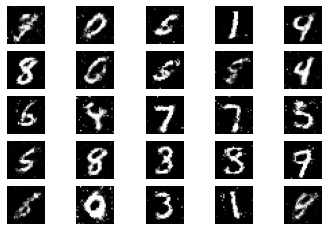

9301 [D loss: 0.644371, acc.: 64.84%] [G loss: 0.874847]
9302 [D loss: 0.670433, acc.: 57.81%] [G loss: 0.911078]
9303 [D loss: 0.606496, acc.: 68.75%] [G loss: 0.942444]
9304 [D loss: 0.699560, acc.: 57.03%] [G loss: 0.873725]
9305 [D loss: 0.644416, acc.: 64.06%] [G loss: 0.876319]
9306 [D loss: 0.625154, acc.: 68.75%] [G loss: 0.885176]
9307 [D loss: 0.642800, acc.: 63.28%] [G loss: 0.845015]
9308 [D loss: 0.650630, acc.: 63.28%] [G loss: 0.900100]
9309 [D loss: 0.648212, acc.: 64.84%] [G loss: 0.914621]
9310 [D loss: 0.634115, acc.: 70.31%] [G loss: 0.943439]
9311 [D loss: 0.655312, acc.: 64.06%] [G loss: 0.859812]
9312 [D loss: 0.670843, acc.: 56.25%] [G loss: 0.894233]
9313 [D loss: 0.662994, acc.: 60.16%] [G loss: 0.868331]
9314 [D loss: 0.651781, acc.: 59.38%] [G loss: 0.833332]
9315 [D loss: 0.656755, acc.: 56.25%] [G loss: 0.883516]
9316 [D loss: 0.698718, acc.: 52.34%] [G loss: 0.904358]
9317 [D loss: 0.645815, acc.: 60.94%] [G loss: 0.886241]
9318 [D loss: 0.637907, acc.: 6

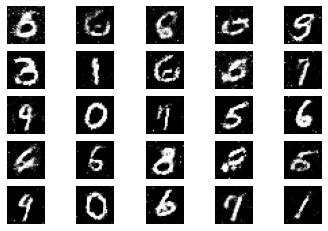

9401 [D loss: 0.626100, acc.: 65.62%] [G loss: 0.947520]
9402 [D loss: 0.666433, acc.: 64.06%] [G loss: 0.861148]
9403 [D loss: 0.693432, acc.: 57.03%] [G loss: 0.848507]
9404 [D loss: 0.669730, acc.: 55.47%] [G loss: 0.889336]
9405 [D loss: 0.657159, acc.: 61.72%] [G loss: 0.869339]
9406 [D loss: 0.684974, acc.: 60.94%] [G loss: 0.873746]
9407 [D loss: 0.685291, acc.: 55.47%] [G loss: 0.960664]
9408 [D loss: 0.666061, acc.: 59.38%] [G loss: 0.874978]
9409 [D loss: 0.654500, acc.: 61.72%] [G loss: 0.896270]
9410 [D loss: 0.689200, acc.: 57.03%] [G loss: 0.899435]
9411 [D loss: 0.646260, acc.: 61.72%] [G loss: 0.920667]
9412 [D loss: 0.670637, acc.: 57.81%] [G loss: 0.904209]
9413 [D loss: 0.655203, acc.: 56.25%] [G loss: 0.905241]
9414 [D loss: 0.642500, acc.: 61.72%] [G loss: 0.960588]
9415 [D loss: 0.676890, acc.: 57.81%] [G loss: 0.906095]
9416 [D loss: 0.660723, acc.: 57.81%] [G loss: 0.893973]
9417 [D loss: 0.617006, acc.: 67.97%] [G loss: 0.885750]
9418 [D loss: 0.615043, acc.: 7

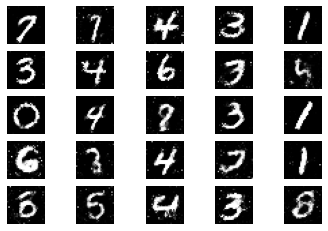

9501 [D loss: 0.658023, acc.: 60.94%] [G loss: 0.831802]
9502 [D loss: 0.682070, acc.: 53.91%] [G loss: 0.916854]
9503 [D loss: 0.661198, acc.: 59.38%] [G loss: 0.927635]
9504 [D loss: 0.668456, acc.: 67.19%] [G loss: 0.862076]
9505 [D loss: 0.664249, acc.: 61.72%] [G loss: 0.859216]
9506 [D loss: 0.638956, acc.: 60.94%] [G loss: 0.923262]
9507 [D loss: 0.640990, acc.: 62.50%] [G loss: 0.868357]
9508 [D loss: 0.653623, acc.: 60.94%] [G loss: 0.935746]
9509 [D loss: 0.657290, acc.: 61.72%] [G loss: 0.834460]
9510 [D loss: 0.699560, acc.: 55.47%] [G loss: 0.901577]
9511 [D loss: 0.659203, acc.: 60.94%] [G loss: 0.960321]
9512 [D loss: 0.674606, acc.: 55.47%] [G loss: 0.867077]
9513 [D loss: 0.650271, acc.: 63.28%] [G loss: 0.892220]
9514 [D loss: 0.639047, acc.: 63.28%] [G loss: 0.835793]
9515 [D loss: 0.635372, acc.: 63.28%] [G loss: 0.885526]
9516 [D loss: 0.694711, acc.: 56.25%] [G loss: 0.854501]
9517 [D loss: 0.619724, acc.: 67.97%] [G loss: 0.879682]
9518 [D loss: 0.647807, acc.: 5

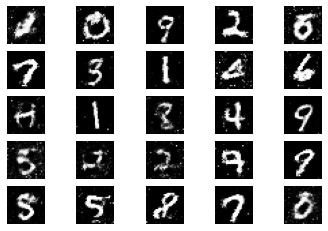

9601 [D loss: 0.654887, acc.: 58.59%] [G loss: 0.846415]
9602 [D loss: 0.677881, acc.: 52.34%] [G loss: 0.906003]
9603 [D loss: 0.634766, acc.: 68.75%] [G loss: 0.881157]
9604 [D loss: 0.688210, acc.: 56.25%] [G loss: 0.910959]
9605 [D loss: 0.650210, acc.: 58.59%] [G loss: 0.884254]
9606 [D loss: 0.669535, acc.: 57.81%] [G loss: 0.885885]
9607 [D loss: 0.644575, acc.: 61.72%] [G loss: 0.858409]
9608 [D loss: 0.660397, acc.: 60.16%] [G loss: 0.880811]
9609 [D loss: 0.639231, acc.: 63.28%] [G loss: 0.871661]
9610 [D loss: 0.665299, acc.: 57.81%] [G loss: 0.924280]
9611 [D loss: 0.633496, acc.: 67.97%] [G loss: 0.919413]
9612 [D loss: 0.650285, acc.: 63.28%] [G loss: 0.919167]
9613 [D loss: 0.686618, acc.: 55.47%] [G loss: 0.934421]
9614 [D loss: 0.657066, acc.: 58.59%] [G loss: 0.900402]
9615 [D loss: 0.700427, acc.: 55.47%] [G loss: 0.951485]
9616 [D loss: 0.672722, acc.: 60.94%] [G loss: 0.898042]
9617 [D loss: 0.657251, acc.: 65.62%] [G loss: 0.927099]
9618 [D loss: 0.619591, acc.: 6

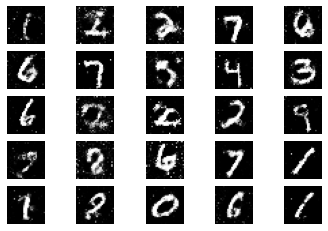

9701 [D loss: 0.668838, acc.: 62.50%] [G loss: 0.888394]
9702 [D loss: 0.643801, acc.: 61.72%] [G loss: 0.941877]
9703 [D loss: 0.696243, acc.: 53.12%] [G loss: 0.904390]
9704 [D loss: 0.641476, acc.: 62.50%] [G loss: 0.879646]
9705 [D loss: 0.645432, acc.: 62.50%] [G loss: 0.923580]
9706 [D loss: 0.655274, acc.: 63.28%] [G loss: 0.875251]
9707 [D loss: 0.700258, acc.: 57.03%] [G loss: 0.847108]
9708 [D loss: 0.627489, acc.: 63.28%] [G loss: 0.916136]
9709 [D loss: 0.680712, acc.: 57.81%] [G loss: 0.874201]
9710 [D loss: 0.645461, acc.: 61.72%] [G loss: 0.933908]
9711 [D loss: 0.696604, acc.: 50.00%] [G loss: 0.855666]
9712 [D loss: 0.645246, acc.: 60.16%] [G loss: 0.919120]
9713 [D loss: 0.686132, acc.: 53.12%] [G loss: 0.899302]
9714 [D loss: 0.663829, acc.: 60.16%] [G loss: 0.896733]
9715 [D loss: 0.695665, acc.: 52.34%] [G loss: 0.922524]
9716 [D loss: 0.680237, acc.: 52.34%] [G loss: 0.867094]
9717 [D loss: 0.658469, acc.: 57.81%] [G loss: 0.925429]
9718 [D loss: 0.677803, acc.: 5

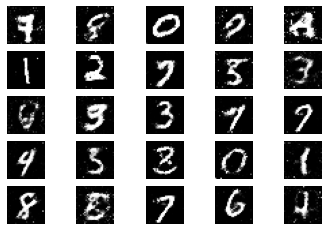

9801 [D loss: 0.649164, acc.: 64.06%] [G loss: 0.838146]
9802 [D loss: 0.628937, acc.: 61.72%] [G loss: 0.928192]
9803 [D loss: 0.695494, acc.: 53.91%] [G loss: 0.936850]
9804 [D loss: 0.669563, acc.: 58.59%] [G loss: 0.933391]
9805 [D loss: 0.678127, acc.: 55.47%] [G loss: 0.878361]
9806 [D loss: 0.663678, acc.: 64.06%] [G loss: 0.932286]
9807 [D loss: 0.650227, acc.: 62.50%] [G loss: 0.929157]
9808 [D loss: 0.676548, acc.: 58.59%] [G loss: 0.887099]
9809 [D loss: 0.650337, acc.: 55.47%] [G loss: 0.913417]
9810 [D loss: 0.695093, acc.: 54.69%] [G loss: 0.799280]
9811 [D loss: 0.687261, acc.: 56.25%] [G loss: 0.881043]
9812 [D loss: 0.680991, acc.: 59.38%] [G loss: 0.886930]
9813 [D loss: 0.656621, acc.: 66.41%] [G loss: 0.876214]
9814 [D loss: 0.646762, acc.: 60.94%] [G loss: 0.879510]
9815 [D loss: 0.663362, acc.: 57.81%] [G loss: 0.846857]
9816 [D loss: 0.661429, acc.: 62.50%] [G loss: 0.897617]
9817 [D loss: 0.652343, acc.: 59.38%] [G loss: 0.886794]
9818 [D loss: 0.679570, acc.: 5

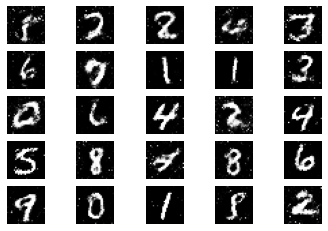

9901 [D loss: 0.651801, acc.: 67.97%] [G loss: 0.852713]
9902 [D loss: 0.675055, acc.: 57.81%] [G loss: 0.895677]
9903 [D loss: 0.652301, acc.: 61.72%] [G loss: 0.925307]
9904 [D loss: 0.658942, acc.: 63.28%] [G loss: 0.936430]
9905 [D loss: 0.694685, acc.: 53.12%] [G loss: 0.874567]
9906 [D loss: 0.645253, acc.: 62.50%] [G loss: 0.846783]
9907 [D loss: 0.638760, acc.: 63.28%] [G loss: 0.872932]
9908 [D loss: 0.684108, acc.: 57.03%] [G loss: 0.953090]
9909 [D loss: 0.645574, acc.: 64.84%] [G loss: 0.849049]
9910 [D loss: 0.662599, acc.: 64.06%] [G loss: 0.894660]
9911 [D loss: 0.638998, acc.: 71.09%] [G loss: 0.862099]
9912 [D loss: 0.639829, acc.: 64.84%] [G loss: 0.906783]
9913 [D loss: 0.667179, acc.: 57.03%] [G loss: 0.838504]
9914 [D loss: 0.619921, acc.: 67.97%] [G loss: 0.891079]
9915 [D loss: 0.678278, acc.: 60.94%] [G loss: 0.848062]
9916 [D loss: 0.677258, acc.: 55.47%] [G loss: 0.850692]
9917 [D loss: 0.643872, acc.: 59.38%] [G loss: 0.877524]
9918 [D loss: 0.642168, acc.: 6

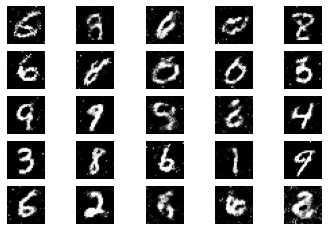

10001 [D loss: 0.623493, acc.: 66.41%] [G loss: 0.902051]
10002 [D loss: 0.645506, acc.: 62.50%] [G loss: 0.949964]
10003 [D loss: 0.677646, acc.: 58.59%] [G loss: 0.898885]
10004 [D loss: 0.627315, acc.: 65.62%] [G loss: 0.844984]
10005 [D loss: 0.654036, acc.: 57.81%] [G loss: 0.904791]
10006 [D loss: 0.663339, acc.: 62.50%] [G loss: 0.894493]
10007 [D loss: 0.640890, acc.: 64.84%] [G loss: 0.895627]
10008 [D loss: 0.668646, acc.: 61.72%] [G loss: 0.850601]
10009 [D loss: 0.688919, acc.: 52.34%] [G loss: 0.849438]
10010 [D loss: 0.652479, acc.: 62.50%] [G loss: 0.874288]
10011 [D loss: 0.652198, acc.: 63.28%] [G loss: 0.844770]
10012 [D loss: 0.674938, acc.: 56.25%] [G loss: 0.877027]
10013 [D loss: 0.646536, acc.: 60.94%] [G loss: 0.867979]
10014 [D loss: 0.675642, acc.: 53.91%] [G loss: 0.854746]
10015 [D loss: 0.604680, acc.: 73.44%] [G loss: 0.858123]
10016 [D loss: 0.651884, acc.: 60.94%] [G loss: 0.904532]
10017 [D loss: 0.652331, acc.: 60.94%] [G loss: 0.853132]
10018 [D loss:

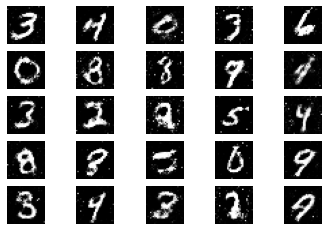

10101 [D loss: 0.643513, acc.: 63.28%] [G loss: 0.887648]
10102 [D loss: 0.660398, acc.: 61.72%] [G loss: 0.890721]
10103 [D loss: 0.654089, acc.: 61.72%] [G loss: 0.928073]
10104 [D loss: 0.655086, acc.: 65.62%] [G loss: 0.890582]
10105 [D loss: 0.644222, acc.: 67.19%] [G loss: 0.895129]
10106 [D loss: 0.750212, acc.: 44.53%] [G loss: 0.923758]
10107 [D loss: 0.659364, acc.: 62.50%] [G loss: 0.897680]
10108 [D loss: 0.695802, acc.: 50.00%] [G loss: 0.969166]
10109 [D loss: 0.641824, acc.: 67.19%] [G loss: 0.978199]
10110 [D loss: 0.696262, acc.: 60.16%] [G loss: 0.863792]
10111 [D loss: 0.603211, acc.: 71.09%] [G loss: 0.854571]
10112 [D loss: 0.677522, acc.: 60.94%] [G loss: 0.846536]
10113 [D loss: 0.678004, acc.: 53.91%] [G loss: 0.877892]
10114 [D loss: 0.660374, acc.: 57.81%] [G loss: 0.882186]
10115 [D loss: 0.672878, acc.: 54.69%] [G loss: 0.822982]
10116 [D loss: 0.679505, acc.: 57.03%] [G loss: 0.910540]
10117 [D loss: 0.665881, acc.: 57.81%] [G loss: 0.876813]
10118 [D loss:

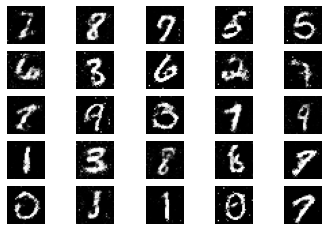

10201 [D loss: 0.659382, acc.: 60.94%] [G loss: 0.917430]
10202 [D loss: 0.707232, acc.: 50.00%] [G loss: 0.856949]
10203 [D loss: 0.662488, acc.: 64.84%] [G loss: 0.861826]
10204 [D loss: 0.683792, acc.: 57.03%] [G loss: 0.848832]
10205 [D loss: 0.653694, acc.: 62.50%] [G loss: 0.841227]
10206 [D loss: 0.594291, acc.: 72.66%] [G loss: 0.943677]
10207 [D loss: 0.688357, acc.: 55.47%] [G loss: 0.912659]
10208 [D loss: 0.681930, acc.: 53.91%] [G loss: 0.900973]
10209 [D loss: 0.679852, acc.: 59.38%] [G loss: 0.875243]
10210 [D loss: 0.697490, acc.: 57.03%] [G loss: 0.890265]
10211 [D loss: 0.644828, acc.: 63.28%] [G loss: 0.833104]
10212 [D loss: 0.662577, acc.: 58.59%] [G loss: 0.927998]
10213 [D loss: 0.669519, acc.: 58.59%] [G loss: 0.895388]
10214 [D loss: 0.688862, acc.: 56.25%] [G loss: 0.889979]
10215 [D loss: 0.656721, acc.: 63.28%] [G loss: 0.930740]
10216 [D loss: 0.654316, acc.: 57.81%] [G loss: 0.875829]
10217 [D loss: 0.698497, acc.: 54.69%] [G loss: 0.846677]
10218 [D loss:

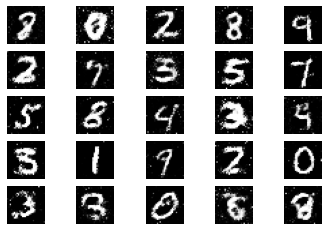

10301 [D loss: 0.651172, acc.: 59.38%] [G loss: 0.843128]
10302 [D loss: 0.646354, acc.: 59.38%] [G loss: 0.864967]
10303 [D loss: 0.608851, acc.: 66.41%] [G loss: 0.895622]
10304 [D loss: 0.646571, acc.: 60.94%] [G loss: 0.887569]
10305 [D loss: 0.712170, acc.: 48.44%] [G loss: 0.878180]
10306 [D loss: 0.671202, acc.: 60.94%] [G loss: 0.851944]
10307 [D loss: 0.670647, acc.: 57.81%] [G loss: 0.884234]
10308 [D loss: 0.660623, acc.: 57.03%] [G loss: 0.891463]
10309 [D loss: 0.674716, acc.: 61.72%] [G loss: 0.952857]
10310 [D loss: 0.642712, acc.: 64.84%] [G loss: 0.895373]
10311 [D loss: 0.710638, acc.: 48.44%] [G loss: 0.859813]
10312 [D loss: 0.667519, acc.: 64.06%] [G loss: 0.907034]
10313 [D loss: 0.657155, acc.: 60.94%] [G loss: 0.893357]
10314 [D loss: 0.679472, acc.: 55.47%] [G loss: 0.863236]
10315 [D loss: 0.651757, acc.: 56.25%] [G loss: 0.880975]
10316 [D loss: 0.665785, acc.: 57.81%] [G loss: 0.882091]
10317 [D loss: 0.688557, acc.: 53.12%] [G loss: 0.855732]
10318 [D loss:

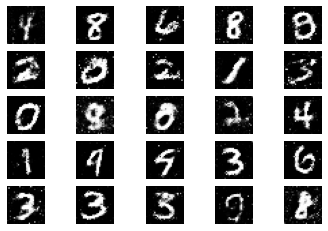

10401 [D loss: 0.657191, acc.: 64.84%] [G loss: 0.877272]
10402 [D loss: 0.684473, acc.: 55.47%] [G loss: 0.869674]
10403 [D loss: 0.609003, acc.: 64.06%] [G loss: 0.868916]
10404 [D loss: 0.691691, acc.: 53.91%] [G loss: 0.882949]
10405 [D loss: 0.649919, acc.: 67.19%] [G loss: 0.975318]
10406 [D loss: 0.735972, acc.: 53.91%] [G loss: 0.955516]
10407 [D loss: 0.624937, acc.: 67.19%] [G loss: 0.886197]
10408 [D loss: 0.682148, acc.: 52.34%] [G loss: 0.872860]
10409 [D loss: 0.677339, acc.: 58.59%] [G loss: 0.873035]
10410 [D loss: 0.661100, acc.: 57.03%] [G loss: 0.891433]
10411 [D loss: 0.690681, acc.: 52.34%] [G loss: 0.907878]
10412 [D loss: 0.634974, acc.: 64.06%] [G loss: 0.883156]
10413 [D loss: 0.661521, acc.: 65.62%] [G loss: 0.881584]
10414 [D loss: 0.644260, acc.: 61.72%] [G loss: 0.885652]
10415 [D loss: 0.644593, acc.: 64.06%] [G loss: 0.909035]
10416 [D loss: 0.667847, acc.: 60.94%] [G loss: 0.883384]
10417 [D loss: 0.635460, acc.: 67.97%] [G loss: 0.860828]
10418 [D loss:

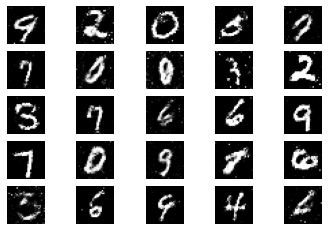

10501 [D loss: 0.620494, acc.: 63.28%] [G loss: 0.830244]
10502 [D loss: 0.676198, acc.: 60.94%] [G loss: 0.864666]
10503 [D loss: 0.649605, acc.: 57.81%] [G loss: 0.885932]
10504 [D loss: 0.696344, acc.: 54.69%] [G loss: 0.888926]
10505 [D loss: 0.658548, acc.: 62.50%] [G loss: 0.932911]
10506 [D loss: 0.639984, acc.: 64.84%] [G loss: 0.919804]
10507 [D loss: 0.681193, acc.: 57.81%] [G loss: 0.903492]
10508 [D loss: 0.630996, acc.: 66.41%] [G loss: 0.852748]
10509 [D loss: 0.614095, acc.: 64.06%] [G loss: 0.879587]
10510 [D loss: 0.665689, acc.: 57.03%] [G loss: 0.874429]
10511 [D loss: 0.615948, acc.: 70.31%] [G loss: 0.946944]
10512 [D loss: 0.726530, acc.: 53.91%] [G loss: 0.865949]
10513 [D loss: 0.708800, acc.: 59.38%] [G loss: 0.936675]
10514 [D loss: 0.694750, acc.: 51.56%] [G loss: 0.925751]
10515 [D loss: 0.649852, acc.: 62.50%] [G loss: 0.877272]
10516 [D loss: 0.698849, acc.: 50.78%] [G loss: 0.862952]
10517 [D loss: 0.653297, acc.: 59.38%] [G loss: 0.839550]
10518 [D loss:

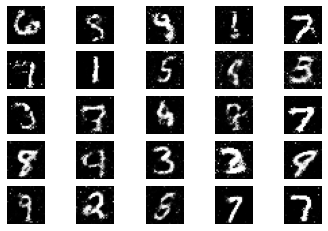

10601 [D loss: 0.648983, acc.: 61.72%] [G loss: 0.910954]
10602 [D loss: 0.667783, acc.: 56.25%] [G loss: 0.902844]
10603 [D loss: 0.679416, acc.: 60.16%] [G loss: 0.848537]
10604 [D loss: 0.633846, acc.: 67.97%] [G loss: 0.927367]
10605 [D loss: 0.653937, acc.: 57.81%] [G loss: 0.889423]
10606 [D loss: 0.653473, acc.: 63.28%] [G loss: 0.932729]
10607 [D loss: 0.676545, acc.: 55.47%] [G loss: 0.867485]
10608 [D loss: 0.657622, acc.: 59.38%] [G loss: 0.840567]
10609 [D loss: 0.676908, acc.: 60.16%] [G loss: 0.894307]
10610 [D loss: 0.706110, acc.: 50.00%] [G loss: 0.908410]
10611 [D loss: 0.672842, acc.: 59.38%] [G loss: 0.935369]
10612 [D loss: 0.637401, acc.: 64.84%] [G loss: 0.919885]
10613 [D loss: 0.658649, acc.: 63.28%] [G loss: 0.902536]
10614 [D loss: 0.705806, acc.: 52.34%] [G loss: 0.888227]
10615 [D loss: 0.648392, acc.: 62.50%] [G loss: 0.913760]
10616 [D loss: 0.620224, acc.: 64.06%] [G loss: 0.880297]
10617 [D loss: 0.712432, acc.: 50.78%] [G loss: 0.894162]
10618 [D loss:

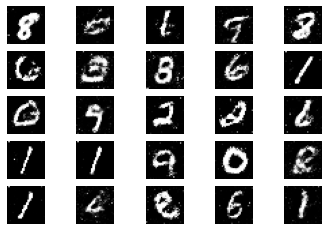

10701 [D loss: 0.648034, acc.: 67.97%] [G loss: 0.865073]
10702 [D loss: 0.665234, acc.: 51.56%] [G loss: 0.886797]
10703 [D loss: 0.652715, acc.: 64.84%] [G loss: 0.911662]
10704 [D loss: 0.675489, acc.: 57.03%] [G loss: 0.891070]
10705 [D loss: 0.618298, acc.: 62.50%] [G loss: 0.855968]
10706 [D loss: 0.648465, acc.: 64.06%] [G loss: 0.912360]
10707 [D loss: 0.657619, acc.: 54.69%] [G loss: 0.933358]
10708 [D loss: 0.680727, acc.: 53.91%] [G loss: 0.861605]
10709 [D loss: 0.647353, acc.: 61.72%] [G loss: 0.892986]
10710 [D loss: 0.654638, acc.: 57.03%] [G loss: 0.954704]
10711 [D loss: 0.676013, acc.: 55.47%] [G loss: 0.921309]
10712 [D loss: 0.686829, acc.: 53.12%] [G loss: 0.857335]
10713 [D loss: 0.699090, acc.: 53.12%] [G loss: 0.888292]
10714 [D loss: 0.619151, acc.: 62.50%] [G loss: 0.907342]
10715 [D loss: 0.628862, acc.: 67.19%] [G loss: 0.971313]
10716 [D loss: 0.684062, acc.: 51.56%] [G loss: 0.887412]
10717 [D loss: 0.688574, acc.: 54.69%] [G loss: 0.951251]
10718 [D loss:

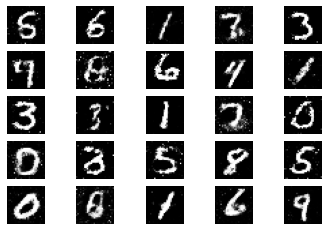

10801 [D loss: 0.645753, acc.: 68.75%] [G loss: 0.887952]
10802 [D loss: 0.646080, acc.: 63.28%] [G loss: 0.864811]
10803 [D loss: 0.679109, acc.: 58.59%] [G loss: 0.906529]
10804 [D loss: 0.655670, acc.: 63.28%] [G loss: 0.875840]
10805 [D loss: 0.700300, acc.: 56.25%] [G loss: 0.865330]
10806 [D loss: 0.655519, acc.: 59.38%] [G loss: 0.891905]
10807 [D loss: 0.657845, acc.: 63.28%] [G loss: 0.841027]
10808 [D loss: 0.644997, acc.: 62.50%] [G loss: 0.907355]
10809 [D loss: 0.641655, acc.: 64.06%] [G loss: 0.909446]
10810 [D loss: 0.691929, acc.: 51.56%] [G loss: 0.915536]
10811 [D loss: 0.683290, acc.: 54.69%] [G loss: 0.840081]
10812 [D loss: 0.687522, acc.: 56.25%] [G loss: 0.871334]
10813 [D loss: 0.688394, acc.: 59.38%] [G loss: 0.897015]
10814 [D loss: 0.641533, acc.: 59.38%] [G loss: 0.908396]
10815 [D loss: 0.648608, acc.: 57.81%] [G loss: 0.856459]
10816 [D loss: 0.686364, acc.: 52.34%] [G loss: 0.892495]
10817 [D loss: 0.626342, acc.: 64.84%] [G loss: 0.877417]
10818 [D loss:

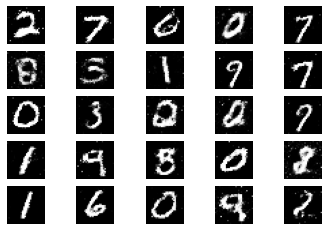

10901 [D loss: 0.648059, acc.: 64.84%] [G loss: 0.902628]
10902 [D loss: 0.691829, acc.: 57.81%] [G loss: 0.930923]
10903 [D loss: 0.685170, acc.: 53.91%] [G loss: 0.937449]
10904 [D loss: 0.665056, acc.: 57.81%] [G loss: 0.937147]
10905 [D loss: 0.682494, acc.: 58.59%] [G loss: 0.971474]
10906 [D loss: 0.710924, acc.: 58.59%] [G loss: 0.878817]
10907 [D loss: 0.657022, acc.: 57.03%] [G loss: 0.842568]
10908 [D loss: 0.681242, acc.: 59.38%] [G loss: 0.881197]
10909 [D loss: 0.630503, acc.: 67.19%] [G loss: 0.886314]
10910 [D loss: 0.685076, acc.: 55.47%] [G loss: 0.905321]
10911 [D loss: 0.669573, acc.: 57.81%] [G loss: 0.878691]
10912 [D loss: 0.648284, acc.: 60.16%] [G loss: 0.911921]
10913 [D loss: 0.665402, acc.: 58.59%] [G loss: 0.876310]
10914 [D loss: 0.660613, acc.: 58.59%] [G loss: 0.890643]
10915 [D loss: 0.675845, acc.: 59.38%] [G loss: 0.924197]
10916 [D loss: 0.633447, acc.: 68.75%] [G loss: 1.011368]
10917 [D loss: 0.673250, acc.: 60.94%] [G loss: 0.880530]
10918 [D loss:

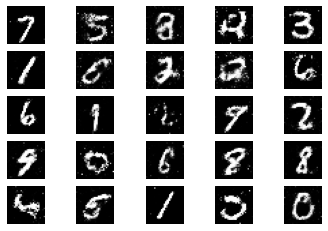

11001 [D loss: 0.589902, acc.: 74.22%] [G loss: 0.931402]
11002 [D loss: 0.649227, acc.: 62.50%] [G loss: 0.874073]
11003 [D loss: 0.630363, acc.: 64.84%] [G loss: 0.895853]
11004 [D loss: 0.654544, acc.: 59.38%] [G loss: 0.859593]
11005 [D loss: 0.650094, acc.: 63.28%] [G loss: 0.962913]
11006 [D loss: 0.645207, acc.: 65.62%] [G loss: 0.955292]
11007 [D loss: 0.708200, acc.: 53.12%] [G loss: 0.919591]
11008 [D loss: 0.679015, acc.: 51.56%] [G loss: 0.852690]
11009 [D loss: 0.636275, acc.: 61.72%] [G loss: 0.934275]
11010 [D loss: 0.660547, acc.: 57.03%] [G loss: 0.828080]
11011 [D loss: 0.656057, acc.: 63.28%] [G loss: 0.888588]
11012 [D loss: 0.665602, acc.: 62.50%] [G loss: 0.867565]
11013 [D loss: 0.675645, acc.: 60.16%] [G loss: 0.836507]
11014 [D loss: 0.644025, acc.: 64.06%] [G loss: 0.895496]
11015 [D loss: 0.666391, acc.: 57.81%] [G loss: 0.901536]
11016 [D loss: 0.680051, acc.: 55.47%] [G loss: 0.913658]
11017 [D loss: 0.644552, acc.: 61.72%] [G loss: 0.905316]
11018 [D loss:

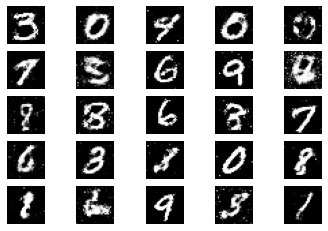

11101 [D loss: 0.628028, acc.: 67.19%] [G loss: 0.910654]
11102 [D loss: 0.670442, acc.: 58.59%] [G loss: 0.938462]
11103 [D loss: 0.654860, acc.: 59.38%] [G loss: 0.941252]
11104 [D loss: 0.644425, acc.: 63.28%] [G loss: 0.904437]
11105 [D loss: 0.652337, acc.: 55.47%] [G loss: 0.904174]
11106 [D loss: 0.652786, acc.: 64.06%] [G loss: 0.881261]
11107 [D loss: 0.655555, acc.: 64.06%] [G loss: 0.928871]
11108 [D loss: 0.664379, acc.: 53.91%] [G loss: 0.881434]
11109 [D loss: 0.656078, acc.: 60.16%] [G loss: 0.899575]
11110 [D loss: 0.649984, acc.: 64.06%] [G loss: 0.852334]
11111 [D loss: 0.610694, acc.: 75.00%] [G loss: 0.960301]
11112 [D loss: 0.660875, acc.: 60.94%] [G loss: 0.893236]
11113 [D loss: 0.663086, acc.: 63.28%] [G loss: 0.852043]
11114 [D loss: 0.610343, acc.: 67.97%] [G loss: 0.957436]
11115 [D loss: 0.672049, acc.: 60.16%] [G loss: 0.881143]
11116 [D loss: 0.658101, acc.: 58.59%] [G loss: 0.865367]
11117 [D loss: 0.687758, acc.: 55.47%] [G loss: 0.885153]
11118 [D loss:

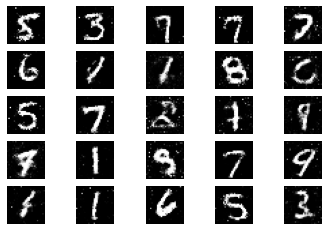

11201 [D loss: 0.630135, acc.: 66.41%] [G loss: 0.954908]
11202 [D loss: 0.674829, acc.: 56.25%] [G loss: 0.935172]
11203 [D loss: 0.634817, acc.: 60.94%] [G loss: 0.908322]
11204 [D loss: 0.687637, acc.: 56.25%] [G loss: 0.929515]
11205 [D loss: 0.670623, acc.: 57.81%] [G loss: 0.857257]
11206 [D loss: 0.676456, acc.: 60.94%] [G loss: 0.832459]
11207 [D loss: 0.615989, acc.: 67.19%] [G loss: 0.906278]
11208 [D loss: 0.649418, acc.: 61.72%] [G loss: 0.913283]
11209 [D loss: 0.682525, acc.: 63.28%] [G loss: 0.895986]
11210 [D loss: 0.671926, acc.: 59.38%] [G loss: 0.897144]
11211 [D loss: 0.668685, acc.: 60.16%] [G loss: 0.932400]
11212 [D loss: 0.628894, acc.: 62.50%] [G loss: 0.889570]
11213 [D loss: 0.661320, acc.: 55.47%] [G loss: 0.884787]
11214 [D loss: 0.642624, acc.: 67.19%] [G loss: 0.872646]
11215 [D loss: 0.724944, acc.: 53.91%] [G loss: 0.993851]
11216 [D loss: 0.619857, acc.: 71.09%] [G loss: 0.875962]
11217 [D loss: 0.664708, acc.: 60.16%] [G loss: 0.860312]
11218 [D loss:

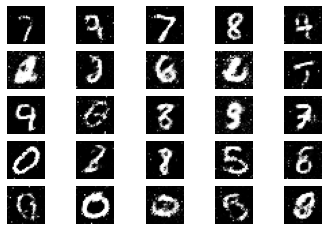

11301 [D loss: 0.609082, acc.: 70.31%] [G loss: 0.822150]
11302 [D loss: 0.682524, acc.: 60.16%] [G loss: 0.877145]
11303 [D loss: 0.715441, acc.: 54.69%] [G loss: 0.878359]
11304 [D loss: 0.646408, acc.: 66.41%] [G loss: 0.906753]
11305 [D loss: 0.696003, acc.: 52.34%] [G loss: 0.835772]
11306 [D loss: 0.705356, acc.: 53.91%] [G loss: 0.865381]
11307 [D loss: 0.638067, acc.: 67.97%] [G loss: 0.869772]
11308 [D loss: 0.656188, acc.: 60.94%] [G loss: 0.911338]
11309 [D loss: 0.632640, acc.: 67.97%] [G loss: 0.869425]
11310 [D loss: 0.638676, acc.: 62.50%] [G loss: 0.886483]
11311 [D loss: 0.667540, acc.: 60.94%] [G loss: 0.843438]
11312 [D loss: 0.695497, acc.: 54.69%] [G loss: 0.916417]
11313 [D loss: 0.657396, acc.: 64.06%] [G loss: 0.901358]
11314 [D loss: 0.668096, acc.: 65.62%] [G loss: 0.929014]
11315 [D loss: 0.669580, acc.: 56.25%] [G loss: 0.907280]
11316 [D loss: 0.642860, acc.: 63.28%] [G loss: 0.928966]
11317 [D loss: 0.652744, acc.: 63.28%] [G loss: 0.896390]
11318 [D loss:

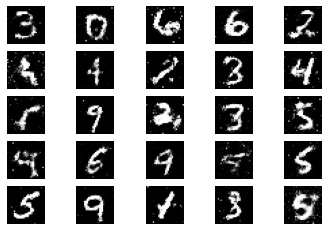

11401 [D loss: 0.641452, acc.: 61.72%] [G loss: 0.861266]
11402 [D loss: 0.639236, acc.: 68.75%] [G loss: 0.931367]
11403 [D loss: 0.682423, acc.: 56.25%] [G loss: 0.839721]
11404 [D loss: 0.684265, acc.: 53.91%] [G loss: 0.877857]
11405 [D loss: 0.671682, acc.: 56.25%] [G loss: 0.855378]
11406 [D loss: 0.662943, acc.: 57.81%] [G loss: 0.869714]
11407 [D loss: 0.646820, acc.: 60.16%] [G loss: 0.846832]
11408 [D loss: 0.663804, acc.: 57.03%] [G loss: 0.855819]
11409 [D loss: 0.698821, acc.: 49.22%] [G loss: 0.902686]
11410 [D loss: 0.594819, acc.: 71.88%] [G loss: 0.961254]
11411 [D loss: 0.682911, acc.: 57.03%] [G loss: 0.851644]
11412 [D loss: 0.659395, acc.: 60.16%] [G loss: 0.879743]
11413 [D loss: 0.624130, acc.: 65.62%] [G loss: 0.893986]
11414 [D loss: 0.659361, acc.: 57.03%] [G loss: 0.885627]
11415 [D loss: 0.640001, acc.: 62.50%] [G loss: 0.877626]
11416 [D loss: 0.646301, acc.: 67.19%] [G loss: 0.895131]
11417 [D loss: 0.672786, acc.: 55.47%] [G loss: 0.858857]
11418 [D loss:

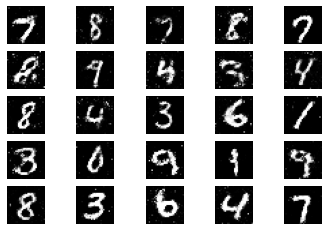

11501 [D loss: 0.715312, acc.: 51.56%] [G loss: 0.915367]
11502 [D loss: 0.674275, acc.: 63.28%] [G loss: 0.931099]
11503 [D loss: 0.689390, acc.: 51.56%] [G loss: 0.946966]
11504 [D loss: 0.646531, acc.: 62.50%] [G loss: 0.856051]
11505 [D loss: 0.670976, acc.: 57.81%] [G loss: 0.840513]
11506 [D loss: 0.675811, acc.: 57.81%] [G loss: 0.894707]
11507 [D loss: 0.646569, acc.: 61.72%] [G loss: 0.903956]
11508 [D loss: 0.623040, acc.: 68.75%] [G loss: 0.953198]
11509 [D loss: 0.639017, acc.: 63.28%] [G loss: 0.881855]
11510 [D loss: 0.678984, acc.: 61.72%] [G loss: 0.894066]
11511 [D loss: 0.662779, acc.: 57.81%] [G loss: 0.927162]
11512 [D loss: 0.621387, acc.: 64.84%] [G loss: 0.897278]
11513 [D loss: 0.640656, acc.: 61.72%] [G loss: 0.881051]
11514 [D loss: 0.681089, acc.: 54.69%] [G loss: 0.906107]
11515 [D loss: 0.626426, acc.: 67.19%] [G loss: 0.864188]
11516 [D loss: 0.655463, acc.: 61.72%] [G loss: 0.878538]
11517 [D loss: 0.675490, acc.: 59.38%] [G loss: 0.865957]
11518 [D loss:

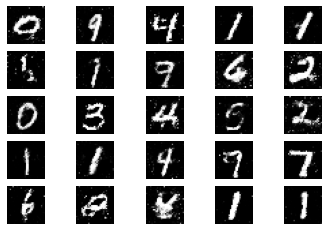

11601 [D loss: 0.676239, acc.: 55.47%] [G loss: 0.849197]
11602 [D loss: 0.620841, acc.: 61.72%] [G loss: 0.842721]
11603 [D loss: 0.630574, acc.: 63.28%] [G loss: 0.882040]
11604 [D loss: 0.661382, acc.: 58.59%] [G loss: 0.872505]
11605 [D loss: 0.659376, acc.: 65.62%] [G loss: 0.918661]
11606 [D loss: 0.632536, acc.: 64.84%] [G loss: 0.879810]
11607 [D loss: 0.627115, acc.: 69.53%] [G loss: 0.921122]
11608 [D loss: 0.678473, acc.: 58.59%] [G loss: 0.904869]
11609 [D loss: 0.673657, acc.: 60.94%] [G loss: 0.883698]
11610 [D loss: 0.664749, acc.: 60.16%] [G loss: 0.927164]
11611 [D loss: 0.668878, acc.: 58.59%] [G loss: 0.919098]
11612 [D loss: 0.680320, acc.: 55.47%] [G loss: 0.874390]
11613 [D loss: 0.723570, acc.: 45.31%] [G loss: 0.894110]
11614 [D loss: 0.698556, acc.: 57.03%] [G loss: 0.876512]
11615 [D loss: 0.629961, acc.: 71.09%] [G loss: 0.893104]
11616 [D loss: 0.634176, acc.: 63.28%] [G loss: 0.869179]
11617 [D loss: 0.703647, acc.: 56.25%] [G loss: 0.872783]
11618 [D loss:

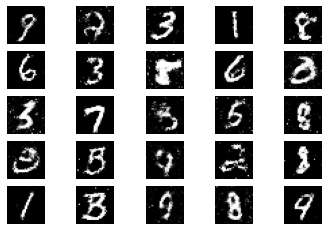

11701 [D loss: 0.666542, acc.: 58.59%] [G loss: 0.839817]
11702 [D loss: 0.697598, acc.: 53.12%] [G loss: 0.864174]
11703 [D loss: 0.648710, acc.: 65.62%] [G loss: 0.891970]
11704 [D loss: 0.672859, acc.: 60.94%] [G loss: 0.871557]
11705 [D loss: 0.669145, acc.: 63.28%] [G loss: 0.873209]
11706 [D loss: 0.660871, acc.: 54.69%] [G loss: 0.878419]
11707 [D loss: 0.684757, acc.: 58.59%] [G loss: 0.876479]
11708 [D loss: 0.634376, acc.: 68.75%] [G loss: 0.856174]
11709 [D loss: 0.622364, acc.: 65.62%] [G loss: 0.919168]
11710 [D loss: 0.651974, acc.: 59.38%] [G loss: 0.881222]
11711 [D loss: 0.636318, acc.: 62.50%] [G loss: 0.946095]
11712 [D loss: 0.640452, acc.: 64.84%] [G loss: 0.964429]
11713 [D loss: 0.714162, acc.: 53.91%] [G loss: 0.905963]
11714 [D loss: 0.643401, acc.: 59.38%] [G loss: 0.871596]
11715 [D loss: 0.645423, acc.: 65.62%] [G loss: 0.867432]
11716 [D loss: 0.715391, acc.: 53.12%] [G loss: 0.871638]
11717 [D loss: 0.680947, acc.: 58.59%] [G loss: 0.880116]
11718 [D loss:

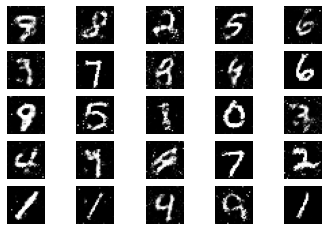

11801 [D loss: 0.708021, acc.: 58.59%] [G loss: 0.872681]
11802 [D loss: 0.652174, acc.: 56.25%] [G loss: 0.893511]
11803 [D loss: 0.681284, acc.: 53.12%] [G loss: 0.910661]
11804 [D loss: 0.662436, acc.: 58.59%] [G loss: 0.867183]
11805 [D loss: 0.672129, acc.: 61.72%] [G loss: 0.899981]
11806 [D loss: 0.672409, acc.: 58.59%] [G loss: 0.902332]
11807 [D loss: 0.653712, acc.: 65.62%] [G loss: 0.914584]
11808 [D loss: 0.633700, acc.: 67.97%] [G loss: 0.909039]
11809 [D loss: 0.687943, acc.: 53.91%] [G loss: 0.781414]
11810 [D loss: 0.661065, acc.: 60.16%] [G loss: 0.825963]
11811 [D loss: 0.690583, acc.: 55.47%] [G loss: 0.860744]
11812 [D loss: 0.676619, acc.: 53.91%] [G loss: 0.920578]
11813 [D loss: 0.689849, acc.: 55.47%] [G loss: 0.871847]
11814 [D loss: 0.664478, acc.: 57.03%] [G loss: 0.893075]
11815 [D loss: 0.671811, acc.: 57.81%] [G loss: 0.931440]
11816 [D loss: 0.646341, acc.: 61.72%] [G loss: 0.904272]
11817 [D loss: 0.675493, acc.: 59.38%] [G loss: 0.903828]
11818 [D loss:

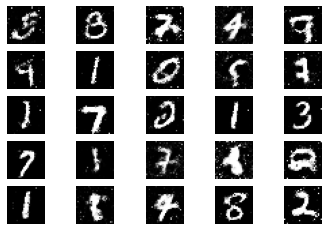

11901 [D loss: 0.666067, acc.: 60.16%] [G loss: 0.857326]
11902 [D loss: 0.663445, acc.: 56.25%] [G loss: 0.857050]
11903 [D loss: 0.655294, acc.: 61.72%] [G loss: 0.902425]
11904 [D loss: 0.678768, acc.: 60.94%] [G loss: 0.900073]
11905 [D loss: 0.624453, acc.: 68.75%] [G loss: 0.873370]
11906 [D loss: 0.678145, acc.: 57.81%] [G loss: 0.906166]
11907 [D loss: 0.630105, acc.: 67.19%] [G loss: 0.901096]
11908 [D loss: 0.676853, acc.: 58.59%] [G loss: 0.901558]
11909 [D loss: 0.608413, acc.: 66.41%] [G loss: 0.904400]
11910 [D loss: 0.676164, acc.: 61.72%] [G loss: 0.871017]
11911 [D loss: 0.648400, acc.: 64.06%] [G loss: 0.883208]
11912 [D loss: 0.661939, acc.: 60.16%] [G loss: 0.868390]
11913 [D loss: 0.701466, acc.: 60.16%] [G loss: 0.963933]
11914 [D loss: 0.694549, acc.: 56.25%] [G loss: 0.886471]
11915 [D loss: 0.633200, acc.: 67.19%] [G loss: 0.896153]
11916 [D loss: 0.690950, acc.: 56.25%] [G loss: 0.915725]
11917 [D loss: 0.664576, acc.: 54.69%] [G loss: 0.938809]
11918 [D loss:

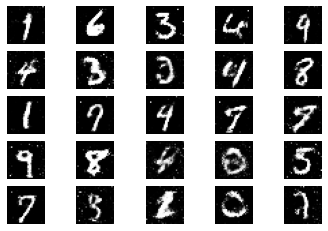

12001 [D loss: 0.628882, acc.: 71.09%] [G loss: 0.901845]
12002 [D loss: 0.659715, acc.: 63.28%] [G loss: 0.912771]
12003 [D loss: 0.679339, acc.: 60.16%] [G loss: 0.885327]
12004 [D loss: 0.662320, acc.: 57.81%] [G loss: 0.906776]
12005 [D loss: 0.639317, acc.: 65.62%] [G loss: 0.909459]
12006 [D loss: 0.658224, acc.: 58.59%] [G loss: 0.876767]
12007 [D loss: 0.653550, acc.: 63.28%] [G loss: 0.892550]
12008 [D loss: 0.703965, acc.: 52.34%] [G loss: 0.923874]
12009 [D loss: 0.651243, acc.: 59.38%] [G loss: 0.885899]
12010 [D loss: 0.643299, acc.: 70.31%] [G loss: 0.895843]
12011 [D loss: 0.649504, acc.: 61.72%] [G loss: 0.887785]
12012 [D loss: 0.674622, acc.: 57.81%] [G loss: 0.854943]
12013 [D loss: 0.650539, acc.: 62.50%] [G loss: 0.918624]
12014 [D loss: 0.707691, acc.: 55.47%] [G loss: 0.870304]
12015 [D loss: 0.660614, acc.: 60.94%] [G loss: 0.873240]
12016 [D loss: 0.621438, acc.: 65.62%] [G loss: 0.899521]
12017 [D loss: 0.709003, acc.: 53.12%] [G loss: 0.830105]
12018 [D loss:

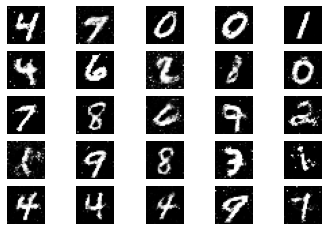

12101 [D loss: 0.672608, acc.: 59.38%] [G loss: 0.916756]
12102 [D loss: 0.674990, acc.: 50.78%] [G loss: 0.887295]
12103 [D loss: 0.665502, acc.: 57.81%] [G loss: 0.961546]
12104 [D loss: 0.617598, acc.: 73.44%] [G loss: 0.889729]
12105 [D loss: 0.635954, acc.: 61.72%] [G loss: 0.938125]
12106 [D loss: 0.699567, acc.: 57.03%] [G loss: 0.826067]
12107 [D loss: 0.665378, acc.: 54.69%] [G loss: 0.792937]
12108 [D loss: 0.625017, acc.: 69.53%] [G loss: 0.837912]
12109 [D loss: 0.675247, acc.: 58.59%] [G loss: 0.907862]
12110 [D loss: 0.714584, acc.: 42.97%] [G loss: 0.861548]
12111 [D loss: 0.655600, acc.: 60.16%] [G loss: 0.916179]
12112 [D loss: 0.644723, acc.: 67.19%] [G loss: 0.882075]
12113 [D loss: 0.676379, acc.: 59.38%] [G loss: 0.913258]
12114 [D loss: 0.650226, acc.: 59.38%] [G loss: 0.843395]
12115 [D loss: 0.661147, acc.: 60.94%] [G loss: 0.917261]
12116 [D loss: 0.655767, acc.: 57.81%] [G loss: 0.913429]
12117 [D loss: 0.685215, acc.: 52.34%] [G loss: 0.880492]
12118 [D loss:

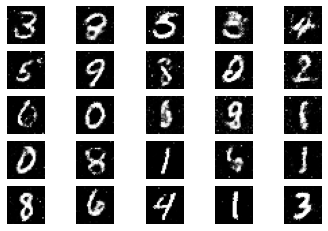

12201 [D loss: 0.650146, acc.: 64.06%] [G loss: 0.872158]
12202 [D loss: 0.635176, acc.: 63.28%] [G loss: 0.870080]
12203 [D loss: 0.671173, acc.: 59.38%] [G loss: 0.867776]
12204 [D loss: 0.701650, acc.: 50.78%] [G loss: 0.849319]
12205 [D loss: 0.718941, acc.: 48.44%] [G loss: 0.870793]
12206 [D loss: 0.649507, acc.: 65.62%] [G loss: 0.973291]
12207 [D loss: 0.701023, acc.: 50.78%] [G loss: 0.911503]
12208 [D loss: 0.606762, acc.: 64.06%] [G loss: 0.912812]
12209 [D loss: 0.682556, acc.: 53.91%] [G loss: 0.876297]
12210 [D loss: 0.623804, acc.: 67.97%] [G loss: 0.866730]
12211 [D loss: 0.679548, acc.: 57.81%] [G loss: 0.890902]
12212 [D loss: 0.640745, acc.: 62.50%] [G loss: 0.826529]
12213 [D loss: 0.632383, acc.: 70.31%] [G loss: 0.932304]
12214 [D loss: 0.673364, acc.: 58.59%] [G loss: 0.948885]
12215 [D loss: 0.624072, acc.: 68.75%] [G loss: 0.915646]
12216 [D loss: 0.675485, acc.: 56.25%] [G loss: 0.913966]
12217 [D loss: 0.633606, acc.: 67.19%] [G loss: 0.887874]
12218 [D loss:

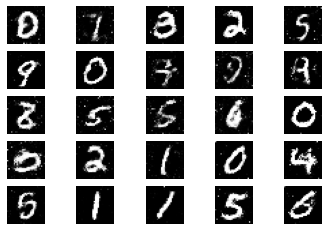

12301 [D loss: 0.635044, acc.: 64.84%] [G loss: 0.856365]
12302 [D loss: 0.599933, acc.: 74.22%] [G loss: 0.850886]
12303 [D loss: 0.724928, acc.: 49.22%] [G loss: 0.828810]
12304 [D loss: 0.664324, acc.: 60.94%] [G loss: 0.807779]
12305 [D loss: 0.660440, acc.: 62.50%] [G loss: 0.888100]
12306 [D loss: 0.628086, acc.: 66.41%] [G loss: 0.823394]
12307 [D loss: 0.693846, acc.: 54.69%] [G loss: 0.795215]
12308 [D loss: 0.649531, acc.: 62.50%] [G loss: 0.876139]
12309 [D loss: 0.640993, acc.: 64.06%] [G loss: 0.896747]
12310 [D loss: 0.665025, acc.: 57.81%] [G loss: 0.878409]
12311 [D loss: 0.708625, acc.: 52.34%] [G loss: 0.923763]
12312 [D loss: 0.669234, acc.: 60.16%] [G loss: 0.890582]
12313 [D loss: 0.677877, acc.: 57.03%] [G loss: 0.879615]
12314 [D loss: 0.646224, acc.: 67.97%] [G loss: 0.894537]
12315 [D loss: 0.655643, acc.: 62.50%] [G loss: 0.938713]
12316 [D loss: 0.676238, acc.: 53.91%] [G loss: 0.896178]
12317 [D loss: 0.625832, acc.: 68.75%] [G loss: 0.878466]
12318 [D loss:

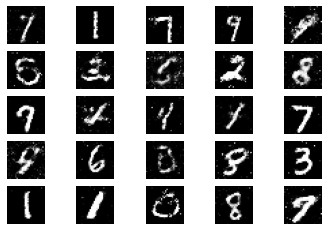

12401 [D loss: 0.653313, acc.: 65.62%] [G loss: 0.893270]
12402 [D loss: 0.692146, acc.: 55.47%] [G loss: 0.897367]
12403 [D loss: 0.634698, acc.: 64.06%] [G loss: 0.905643]
12404 [D loss: 0.656364, acc.: 62.50%] [G loss: 0.874612]
12405 [D loss: 0.602471, acc.: 70.31%] [G loss: 0.876020]
12406 [D loss: 0.714502, acc.: 44.53%] [G loss: 0.890815]
12407 [D loss: 0.722627, acc.: 53.12%] [G loss: 0.826686]
12408 [D loss: 0.622598, acc.: 64.06%] [G loss: 0.884163]
12409 [D loss: 0.641582, acc.: 62.50%] [G loss: 0.928690]
12410 [D loss: 0.690847, acc.: 54.69%] [G loss: 0.850051]
12411 [D loss: 0.691714, acc.: 54.69%] [G loss: 0.859095]
12412 [D loss: 0.648023, acc.: 64.84%] [G loss: 0.902181]
12413 [D loss: 0.656475, acc.: 61.72%] [G loss: 0.938602]
12414 [D loss: 0.646066, acc.: 62.50%] [G loss: 0.919554]
12415 [D loss: 0.673133, acc.: 59.38%] [G loss: 0.891154]
12416 [D loss: 0.665043, acc.: 57.03%] [G loss: 0.955601]
12417 [D loss: 0.690137, acc.: 55.47%] [G loss: 0.945088]
12418 [D loss:

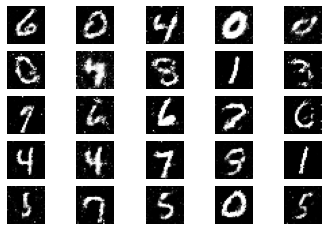

12501 [D loss: 0.690223, acc.: 54.69%] [G loss: 0.887573]
12502 [D loss: 0.647115, acc.: 56.25%] [G loss: 0.826586]
12503 [D loss: 0.659685, acc.: 62.50%] [G loss: 0.935046]
12504 [D loss: 0.649476, acc.: 63.28%] [G loss: 0.861688]
12505 [D loss: 0.654184, acc.: 63.28%] [G loss: 0.846636]
12506 [D loss: 0.646484, acc.: 57.03%] [G loss: 0.950927]
12507 [D loss: 0.665622, acc.: 54.69%] [G loss: 0.891718]
12508 [D loss: 0.628912, acc.: 63.28%] [G loss: 0.947208]
12509 [D loss: 0.664365, acc.: 64.84%] [G loss: 0.932875]
12510 [D loss: 0.667284, acc.: 60.94%] [G loss: 0.921211]
12511 [D loss: 0.713667, acc.: 53.12%] [G loss: 0.875509]
12512 [D loss: 0.697306, acc.: 53.12%] [G loss: 0.858040]
12513 [D loss: 0.658102, acc.: 55.47%] [G loss: 0.857379]
12514 [D loss: 0.664395, acc.: 59.38%] [G loss: 0.875433]
12515 [D loss: 0.646825, acc.: 60.94%] [G loss: 0.838126]
12516 [D loss: 0.661326, acc.: 59.38%] [G loss: 0.903608]
12517 [D loss: 0.642284, acc.: 60.16%] [G loss: 0.898688]
12518 [D loss:

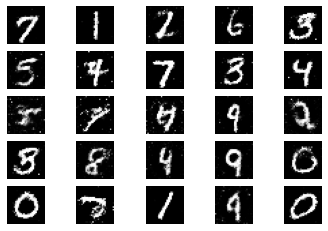

12601 [D loss: 0.661547, acc.: 61.72%] [G loss: 0.894194]
12602 [D loss: 0.650353, acc.: 61.72%] [G loss: 0.882207]
12603 [D loss: 0.655368, acc.: 63.28%] [G loss: 0.801487]
12604 [D loss: 0.664868, acc.: 62.50%] [G loss: 0.906551]
12605 [D loss: 0.676440, acc.: 57.81%] [G loss: 0.895966]
12606 [D loss: 0.670829, acc.: 53.91%] [G loss: 0.879746]
12607 [D loss: 0.650045, acc.: 60.16%] [G loss: 0.910257]
12608 [D loss: 0.716209, acc.: 46.88%] [G loss: 0.885774]
12609 [D loss: 0.621091, acc.: 67.97%] [G loss: 0.868581]
12610 [D loss: 0.639266, acc.: 64.06%] [G loss: 0.881663]
12611 [D loss: 0.643845, acc.: 62.50%] [G loss: 0.841508]
12612 [D loss: 0.692709, acc.: 57.03%] [G loss: 0.912473]
12613 [D loss: 0.680346, acc.: 57.81%] [G loss: 0.899018]
12614 [D loss: 0.658147, acc.: 59.38%] [G loss: 0.920633]
12615 [D loss: 0.608283, acc.: 66.41%] [G loss: 0.867107]
12616 [D loss: 0.673902, acc.: 56.25%] [G loss: 0.930200]
12617 [D loss: 0.685784, acc.: 61.72%] [G loss: 0.902765]
12618 [D loss:

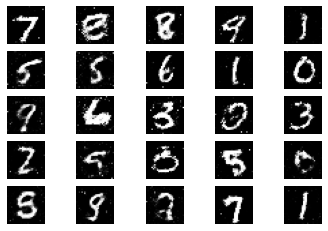

12701 [D loss: 0.651861, acc.: 61.72%] [G loss: 0.950615]
12702 [D loss: 0.673560, acc.: 58.59%] [G loss: 0.934732]
12703 [D loss: 0.741872, acc.: 43.75%] [G loss: 0.868767]
12704 [D loss: 0.667646, acc.: 57.81%] [G loss: 0.862731]
12705 [D loss: 0.648604, acc.: 64.84%] [G loss: 0.955834]
12706 [D loss: 0.666749, acc.: 57.81%] [G loss: 0.904614]
12707 [D loss: 0.669848, acc.: 58.59%] [G loss: 0.926014]
12708 [D loss: 0.666528, acc.: 61.72%] [G loss: 0.910065]
12709 [D loss: 0.648655, acc.: 66.41%] [G loss: 0.916891]
12710 [D loss: 0.672006, acc.: 57.03%] [G loss: 0.949742]
12711 [D loss: 0.684415, acc.: 57.03%] [G loss: 0.876684]
12712 [D loss: 0.634582, acc.: 69.53%] [G loss: 0.943374]
12713 [D loss: 0.682361, acc.: 57.03%] [G loss: 0.895077]
12714 [D loss: 0.697686, acc.: 53.91%] [G loss: 0.881155]
12715 [D loss: 0.657151, acc.: 58.59%] [G loss: 0.876735]
12716 [D loss: 0.659218, acc.: 61.72%] [G loss: 0.877653]
12717 [D loss: 0.672919, acc.: 58.59%] [G loss: 0.908893]
12718 [D loss:

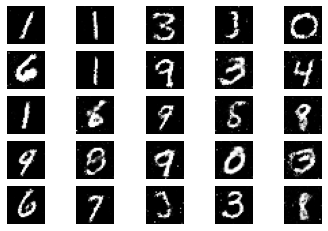

12801 [D loss: 0.603570, acc.: 71.09%] [G loss: 0.896159]
12802 [D loss: 0.655653, acc.: 60.16%] [G loss: 0.886727]
12803 [D loss: 0.728630, acc.: 51.56%] [G loss: 0.891214]
12804 [D loss: 0.674673, acc.: 57.81%] [G loss: 0.916510]
12805 [D loss: 0.643145, acc.: 58.59%] [G loss: 0.938677]
12806 [D loss: 0.672325, acc.: 60.16%] [G loss: 0.844036]
12807 [D loss: 0.650705, acc.: 61.72%] [G loss: 0.872454]
12808 [D loss: 0.680313, acc.: 57.03%] [G loss: 0.883798]
12809 [D loss: 0.657900, acc.: 64.84%] [G loss: 0.894079]
12810 [D loss: 0.703934, acc.: 51.56%] [G loss: 0.911497]
12811 [D loss: 0.667970, acc.: 60.16%] [G loss: 0.876673]
12812 [D loss: 0.660880, acc.: 60.16%] [G loss: 0.801865]
12813 [D loss: 0.640908, acc.: 68.75%] [G loss: 0.891400]
12814 [D loss: 0.628142, acc.: 67.97%] [G loss: 0.936355]
12815 [D loss: 0.678002, acc.: 60.16%] [G loss: 0.888251]
12816 [D loss: 0.713021, acc.: 57.03%] [G loss: 0.890949]
12817 [D loss: 0.632165, acc.: 62.50%] [G loss: 0.927312]
12818 [D loss:

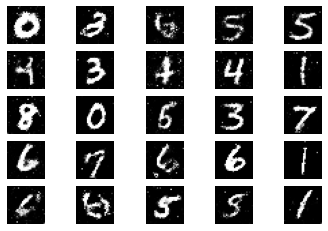

12901 [D loss: 0.648550, acc.: 60.94%] [G loss: 0.903506]
12902 [D loss: 0.647374, acc.: 64.06%] [G loss: 0.868773]
12903 [D loss: 0.645617, acc.: 64.84%] [G loss: 0.883602]
12904 [D loss: 0.628930, acc.: 64.06%] [G loss: 0.836510]
12905 [D loss: 0.680579, acc.: 56.25%] [G loss: 0.932531]
12906 [D loss: 0.637969, acc.: 66.41%] [G loss: 0.900781]
12907 [D loss: 0.644269, acc.: 61.72%] [G loss: 0.910600]
12908 [D loss: 0.658646, acc.: 59.38%] [G loss: 0.935668]
12909 [D loss: 0.669465, acc.: 60.94%] [G loss: 0.945422]
12910 [D loss: 0.653545, acc.: 63.28%] [G loss: 0.923220]
12911 [D loss: 0.680248, acc.: 57.03%] [G loss: 0.926646]
12912 [D loss: 0.636860, acc.: 62.50%] [G loss: 0.899576]
12913 [D loss: 0.683901, acc.: 56.25%] [G loss: 0.910744]
12914 [D loss: 0.655858, acc.: 60.94%] [G loss: 1.002202]
12915 [D loss: 0.624323, acc.: 68.75%] [G loss: 0.974331]
12916 [D loss: 0.675476, acc.: 57.81%] [G loss: 0.929686]
12917 [D loss: 0.678348, acc.: 60.16%] [G loss: 0.848541]
12918 [D loss:

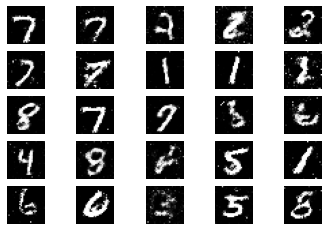

13001 [D loss: 0.701163, acc.: 50.78%] [G loss: 0.871880]
13002 [D loss: 0.670917, acc.: 59.38%] [G loss: 0.911856]
13003 [D loss: 0.630162, acc.: 64.06%] [G loss: 0.939014]
13004 [D loss: 0.667102, acc.: 60.16%] [G loss: 0.905479]
13005 [D loss: 0.672907, acc.: 56.25%] [G loss: 0.832697]
13006 [D loss: 0.700619, acc.: 51.56%] [G loss: 0.867297]
13007 [D loss: 0.656196, acc.: 61.72%] [G loss: 0.872209]
13008 [D loss: 0.663622, acc.: 62.50%] [G loss: 0.906346]
13009 [D loss: 0.661385, acc.: 60.94%] [G loss: 0.908153]
13010 [D loss: 0.700011, acc.: 53.12%] [G loss: 0.900245]
13011 [D loss: 0.629484, acc.: 60.94%] [G loss: 0.846450]
13012 [D loss: 0.621966, acc.: 64.84%] [G loss: 0.822048]
13013 [D loss: 0.691728, acc.: 53.91%] [G loss: 0.844600]
13014 [D loss: 0.631909, acc.: 64.06%] [G loss: 0.882135]
13015 [D loss: 0.655733, acc.: 60.16%] [G loss: 0.835140]
13016 [D loss: 0.693553, acc.: 51.56%] [G loss: 0.882884]
13017 [D loss: 0.670784, acc.: 58.59%] [G loss: 0.876561]
13018 [D loss:

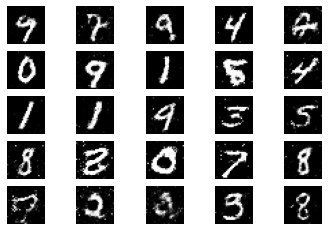

13101 [D loss: 0.626280, acc.: 64.06%] [G loss: 0.900417]
13102 [D loss: 0.685632, acc.: 53.91%] [G loss: 0.878605]
13103 [D loss: 0.653506, acc.: 60.94%] [G loss: 0.897396]
13104 [D loss: 0.642379, acc.: 67.19%] [G loss: 0.895271]
13105 [D loss: 0.670681, acc.: 56.25%] [G loss: 0.886180]
13106 [D loss: 0.688112, acc.: 56.25%] [G loss: 0.860252]
13107 [D loss: 0.659701, acc.: 58.59%] [G loss: 0.884124]
13108 [D loss: 0.666841, acc.: 59.38%] [G loss: 0.902819]
13109 [D loss: 0.640289, acc.: 66.41%] [G loss: 0.850934]
13110 [D loss: 0.625268, acc.: 66.41%] [G loss: 0.927565]
13111 [D loss: 0.691432, acc.: 54.69%] [G loss: 0.883201]
13112 [D loss: 0.673322, acc.: 58.59%] [G loss: 0.876699]
13113 [D loss: 0.691321, acc.: 57.03%] [G loss: 0.852398]
13114 [D loss: 0.680051, acc.: 57.03%] [G loss: 0.925508]
13115 [D loss: 0.712405, acc.: 52.34%] [G loss: 0.806237]
13116 [D loss: 0.680584, acc.: 56.25%] [G loss: 0.881363]
13117 [D loss: 0.636618, acc.: 63.28%] [G loss: 0.911191]
13118 [D loss:

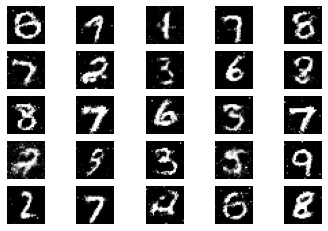

13201 [D loss: 0.639360, acc.: 64.84%] [G loss: 0.921159]
13202 [D loss: 0.637982, acc.: 66.41%] [G loss: 0.835832]
13203 [D loss: 0.673597, acc.: 62.50%] [G loss: 0.918041]
13204 [D loss: 0.678486, acc.: 56.25%] [G loss: 0.798381]
13205 [D loss: 0.638982, acc.: 64.06%] [G loss: 0.881393]
13206 [D loss: 0.663268, acc.: 59.38%] [G loss: 0.908185]
13207 [D loss: 0.663638, acc.: 57.81%] [G loss: 0.821699]
13208 [D loss: 0.694693, acc.: 54.69%] [G loss: 0.905167]
13209 [D loss: 0.647474, acc.: 65.62%] [G loss: 0.891208]
13210 [D loss: 0.611338, acc.: 71.09%] [G loss: 0.917431]
13211 [D loss: 0.679928, acc.: 60.16%] [G loss: 0.908453]
13212 [D loss: 0.638157, acc.: 58.59%] [G loss: 0.844876]
13213 [D loss: 0.677853, acc.: 57.03%] [G loss: 0.911752]
13214 [D loss: 0.702398, acc.: 60.16%] [G loss: 0.871690]
13215 [D loss: 0.661820, acc.: 57.03%] [G loss: 0.887004]
13216 [D loss: 0.675268, acc.: 57.03%] [G loss: 0.861346]
13217 [D loss: 0.673669, acc.: 56.25%] [G loss: 0.918843]
13218 [D loss:

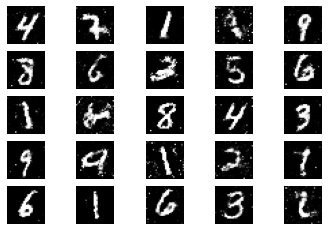

13301 [D loss: 0.671003, acc.: 60.94%] [G loss: 0.891094]
13302 [D loss: 0.667978, acc.: 54.69%] [G loss: 0.855049]
13303 [D loss: 0.656800, acc.: 57.81%] [G loss: 0.843374]
13304 [D loss: 0.650022, acc.: 57.03%] [G loss: 0.932014]
13305 [D loss: 0.657966, acc.: 62.50%] [G loss: 0.899648]
13306 [D loss: 0.682761, acc.: 56.25%] [G loss: 0.912984]
13307 [D loss: 0.630126, acc.: 62.50%] [G loss: 0.928438]
13308 [D loss: 0.676430, acc.: 54.69%] [G loss: 0.920626]
13309 [D loss: 0.660545, acc.: 55.47%] [G loss: 0.913996]
13310 [D loss: 0.666181, acc.: 58.59%] [G loss: 0.906613]
13311 [D loss: 0.654691, acc.: 62.50%] [G loss: 0.921241]
13312 [D loss: 0.631365, acc.: 62.50%] [G loss: 0.934928]
13313 [D loss: 0.633551, acc.: 63.28%] [G loss: 0.907482]
13314 [D loss: 0.640195, acc.: 62.50%] [G loss: 0.817904]
13315 [D loss: 0.692146, acc.: 59.38%] [G loss: 0.887288]
13316 [D loss: 0.644225, acc.: 63.28%] [G loss: 0.844520]
13317 [D loss: 0.653114, acc.: 62.50%] [G loss: 0.915373]
13318 [D loss:

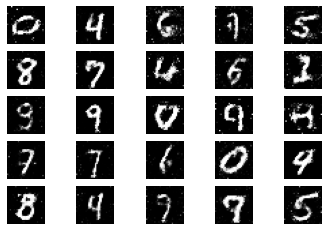

13401 [D loss: 0.633195, acc.: 63.28%] [G loss: 0.895137]
13402 [D loss: 0.649317, acc.: 62.50%] [G loss: 0.904705]
13403 [D loss: 0.668573, acc.: 57.81%] [G loss: 0.889902]
13404 [D loss: 0.682045, acc.: 57.03%] [G loss: 0.827075]
13405 [D loss: 0.627452, acc.: 67.19%] [G loss: 0.844018]
13406 [D loss: 0.675489, acc.: 50.00%] [G loss: 0.848232]
13407 [D loss: 0.658913, acc.: 56.25%] [G loss: 0.873643]
13408 [D loss: 0.667668, acc.: 61.72%] [G loss: 0.917474]
13409 [D loss: 0.658426, acc.: 64.06%] [G loss: 0.864446]
13410 [D loss: 0.626292, acc.: 65.62%] [G loss: 0.873465]
13411 [D loss: 0.654898, acc.: 59.38%] [G loss: 0.842817]
13412 [D loss: 0.630645, acc.: 61.72%] [G loss: 0.910966]
13413 [D loss: 0.671926, acc.: 60.16%] [G loss: 0.867342]
13414 [D loss: 0.668731, acc.: 56.25%] [G loss: 0.853721]
13415 [D loss: 0.669196, acc.: 58.59%] [G loss: 0.835792]
13416 [D loss: 0.693658, acc.: 55.47%] [G loss: 0.899448]
13417 [D loss: 0.658781, acc.: 60.94%] [G loss: 0.861280]
13418 [D loss:

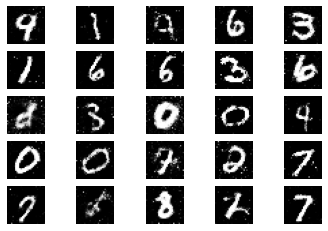

13501 [D loss: 0.638304, acc.: 62.50%] [G loss: 0.817183]
13502 [D loss: 0.663236, acc.: 59.38%] [G loss: 0.875965]
13503 [D loss: 0.677921, acc.: 56.25%] [G loss: 0.920129]
13504 [D loss: 0.631079, acc.: 64.84%] [G loss: 0.910576]
13505 [D loss: 0.671771, acc.: 58.59%] [G loss: 0.892468]
13506 [D loss: 0.662303, acc.: 56.25%] [G loss: 0.870190]
13507 [D loss: 0.656683, acc.: 52.34%] [G loss: 0.849068]
13508 [D loss: 0.684180, acc.: 53.91%] [G loss: 0.917144]
13509 [D loss: 0.656782, acc.: 54.69%] [G loss: 0.934226]
13510 [D loss: 0.638905, acc.: 61.72%] [G loss: 0.891838]
13511 [D loss: 0.629494, acc.: 65.62%] [G loss: 0.854627]
13512 [D loss: 0.610462, acc.: 72.66%] [G loss: 0.870573]
13513 [D loss: 0.668601, acc.: 54.69%] [G loss: 0.896082]
13514 [D loss: 0.655976, acc.: 61.72%] [G loss: 0.868705]
13515 [D loss: 0.711827, acc.: 53.12%] [G loss: 0.881715]
13516 [D loss: 0.671718, acc.: 59.38%] [G loss: 0.872199]
13517 [D loss: 0.644684, acc.: 66.41%] [G loss: 1.005951]
13518 [D loss:

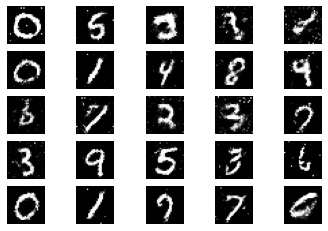

13601 [D loss: 0.635714, acc.: 64.84%] [G loss: 0.914137]
13602 [D loss: 0.714745, acc.: 55.47%] [G loss: 0.946058]
13603 [D loss: 0.662265, acc.: 58.59%] [G loss: 0.879191]
13604 [D loss: 0.647847, acc.: 61.72%] [G loss: 0.847463]
13605 [D loss: 0.675843, acc.: 57.81%] [G loss: 0.873228]
13606 [D loss: 0.667097, acc.: 59.38%] [G loss: 0.945977]
13607 [D loss: 0.663487, acc.: 60.16%] [G loss: 0.886168]
13608 [D loss: 0.674767, acc.: 55.47%] [G loss: 0.972552]
13609 [D loss: 0.693543, acc.: 56.25%] [G loss: 0.868624]
13610 [D loss: 0.691888, acc.: 57.03%] [G loss: 0.908259]
13611 [D loss: 0.688398, acc.: 60.94%] [G loss: 0.879114]
13612 [D loss: 0.686371, acc.: 56.25%] [G loss: 0.869822]
13613 [D loss: 0.632514, acc.: 67.97%] [G loss: 0.880886]
13614 [D loss: 0.651918, acc.: 64.84%] [G loss: 0.917042]
13615 [D loss: 0.659387, acc.: 64.06%] [G loss: 0.909696]
13616 [D loss: 0.659907, acc.: 57.03%] [G loss: 0.915698]
13617 [D loss: 0.628740, acc.: 61.72%] [G loss: 0.916288]
13618 [D loss:

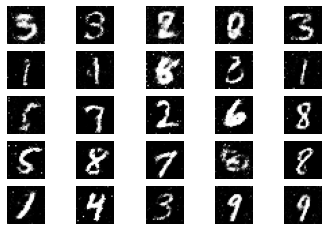

13701 [D loss: 0.647310, acc.: 59.38%] [G loss: 0.953330]
13702 [D loss: 0.632236, acc.: 63.28%] [G loss: 0.956307]
13703 [D loss: 0.697666, acc.: 53.12%] [G loss: 0.823402]
13704 [D loss: 0.703362, acc.: 53.12%] [G loss: 0.859259]
13705 [D loss: 0.692518, acc.: 54.69%] [G loss: 0.886617]
13706 [D loss: 0.653787, acc.: 55.47%] [G loss: 0.932621]
13707 [D loss: 0.622424, acc.: 64.84%] [G loss: 0.912393]
13708 [D loss: 0.700494, acc.: 56.25%] [G loss: 0.848946]
13709 [D loss: 0.630527, acc.: 66.41%] [G loss: 0.914613]
13710 [D loss: 0.657358, acc.: 59.38%] [G loss: 0.898088]
13711 [D loss: 0.680887, acc.: 60.94%] [G loss: 0.854464]
13712 [D loss: 0.663922, acc.: 58.59%] [G loss: 0.903398]
13713 [D loss: 0.686954, acc.: 62.50%] [G loss: 0.938300]
13714 [D loss: 0.644866, acc.: 63.28%] [G loss: 0.880405]
13715 [D loss: 0.629542, acc.: 64.06%] [G loss: 0.904310]
13716 [D loss: 0.627643, acc.: 63.28%] [G loss: 0.908613]
13717 [D loss: 0.652802, acc.: 62.50%] [G loss: 0.937582]
13718 [D loss:

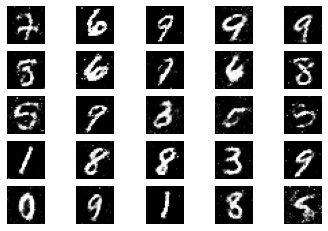

13801 [D loss: 0.668584, acc.: 57.81%] [G loss: 0.848311]
13802 [D loss: 0.647735, acc.: 64.84%] [G loss: 0.842150]
13803 [D loss: 0.731991, acc.: 46.88%] [G loss: 0.870491]
13804 [D loss: 0.623282, acc.: 68.75%] [G loss: 0.890150]
13805 [D loss: 0.673744, acc.: 60.94%] [G loss: 0.950917]
13806 [D loss: 0.698749, acc.: 53.91%] [G loss: 0.883985]
13807 [D loss: 0.677855, acc.: 58.59%] [G loss: 0.834356]
13808 [D loss: 0.636329, acc.: 66.41%] [G loss: 0.796094]
13809 [D loss: 0.597653, acc.: 71.88%] [G loss: 0.877507]
13810 [D loss: 0.678493, acc.: 55.47%] [G loss: 0.925410]
13811 [D loss: 0.686796, acc.: 58.59%] [G loss: 0.880593]
13812 [D loss: 0.651918, acc.: 62.50%] [G loss: 0.935529]
13813 [D loss: 0.643412, acc.: 60.94%] [G loss: 0.882258]
13814 [D loss: 0.683937, acc.: 57.03%] [G loss: 0.922417]
13815 [D loss: 0.638443, acc.: 59.38%] [G loss: 0.897844]
13816 [D loss: 0.664170, acc.: 61.72%] [G loss: 0.900297]
13817 [D loss: 0.628278, acc.: 64.84%] [G loss: 0.981909]
13818 [D loss:

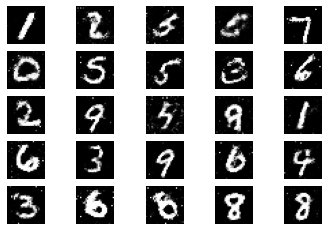

13901 [D loss: 0.662866, acc.: 57.81%] [G loss: 0.872415]
13902 [D loss: 0.645237, acc.: 59.38%] [G loss: 0.991847]
13903 [D loss: 0.653492, acc.: 60.94%] [G loss: 0.900931]
13904 [D loss: 0.636656, acc.: 64.06%] [G loss: 0.900579]
13905 [D loss: 0.628645, acc.: 66.41%] [G loss: 0.949923]
13906 [D loss: 0.640488, acc.: 61.72%] [G loss: 0.951435]
13907 [D loss: 0.653373, acc.: 61.72%] [G loss: 0.831481]
13908 [D loss: 0.658018, acc.: 60.94%] [G loss: 0.869452]
13909 [D loss: 0.691922, acc.: 60.94%] [G loss: 0.850748]
13910 [D loss: 0.677186, acc.: 60.94%] [G loss: 0.869268]
13911 [D loss: 0.662336, acc.: 60.16%] [G loss: 0.892056]
13912 [D loss: 0.644704, acc.: 60.94%] [G loss: 0.898668]
13913 [D loss: 0.650942, acc.: 57.03%] [G loss: 0.919516]
13914 [D loss: 0.675104, acc.: 55.47%] [G loss: 0.901857]
13915 [D loss: 0.644094, acc.: 65.62%] [G loss: 0.831097]
13916 [D loss: 0.665924, acc.: 59.38%] [G loss: 0.869760]
13917 [D loss: 0.668153, acc.: 59.38%] [G loss: 0.898047]
13918 [D loss:

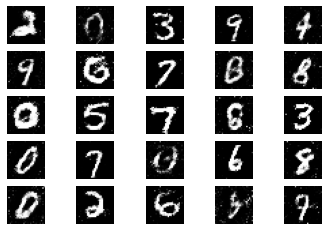

14001 [D loss: 0.666251, acc.: 54.69%] [G loss: 0.887660]
14002 [D loss: 0.627922, acc.: 62.50%] [G loss: 0.914199]
14003 [D loss: 0.713438, acc.: 52.34%] [G loss: 0.863237]
14004 [D loss: 0.644975, acc.: 60.16%] [G loss: 0.890784]
14005 [D loss: 0.667121, acc.: 60.16%] [G loss: 0.885858]
14006 [D loss: 0.689695, acc.: 57.03%] [G loss: 0.876891]
14007 [D loss: 0.668040, acc.: 60.16%] [G loss: 0.875108]
14008 [D loss: 0.617359, acc.: 67.19%] [G loss: 0.893620]
14009 [D loss: 0.643932, acc.: 64.84%] [G loss: 0.873413]
14010 [D loss: 0.679540, acc.: 58.59%] [G loss: 0.911025]
14011 [D loss: 0.700939, acc.: 50.78%] [G loss: 0.883691]
14012 [D loss: 0.678960, acc.: 59.38%] [G loss: 0.834217]
14013 [D loss: 0.675057, acc.: 59.38%] [G loss: 0.900016]
14014 [D loss: 0.680916, acc.: 57.81%] [G loss: 0.867963]
14015 [D loss: 0.686299, acc.: 50.00%] [G loss: 0.860507]
14016 [D loss: 0.626252, acc.: 66.41%] [G loss: 0.914351]
14017 [D loss: 0.690265, acc.: 55.47%] [G loss: 0.842692]
14018 [D loss:

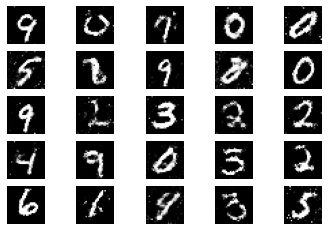

14101 [D loss: 0.673668, acc.: 57.03%] [G loss: 0.883699]
14102 [D loss: 0.657149, acc.: 59.38%] [G loss: 0.877079]
14103 [D loss: 0.687494, acc.: 56.25%] [G loss: 0.836446]
14104 [D loss: 0.647200, acc.: 62.50%] [G loss: 0.868486]
14105 [D loss: 0.642058, acc.: 67.97%] [G loss: 0.908656]
14106 [D loss: 0.632059, acc.: 65.62%] [G loss: 0.926558]
14107 [D loss: 0.696686, acc.: 55.47%] [G loss: 0.922536]
14108 [D loss: 0.688983, acc.: 57.03%] [G loss: 0.961888]
14109 [D loss: 0.676219, acc.: 53.91%] [G loss: 0.887909]
14110 [D loss: 0.685720, acc.: 53.91%] [G loss: 0.830644]
14111 [D loss: 0.648810, acc.: 60.94%] [G loss: 0.871200]
14112 [D loss: 0.642349, acc.: 61.72%] [G loss: 0.847656]
14113 [D loss: 0.654487, acc.: 69.53%] [G loss: 0.926824]
14114 [D loss: 0.676530, acc.: 55.47%] [G loss: 0.848219]
14115 [D loss: 0.679424, acc.: 55.47%] [G loss: 0.897954]
14116 [D loss: 0.628071, acc.: 64.06%] [G loss: 0.976677]
14117 [D loss: 0.633261, acc.: 64.06%] [G loss: 0.909622]
14118 [D loss:

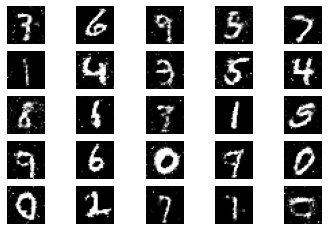

14201 [D loss: 0.630442, acc.: 68.75%] [G loss: 0.831279]
14202 [D loss: 0.655001, acc.: 57.03%] [G loss: 0.910672]
14203 [D loss: 0.641906, acc.: 60.16%] [G loss: 0.848728]
14204 [D loss: 0.616507, acc.: 68.75%] [G loss: 0.908701]
14205 [D loss: 0.643440, acc.: 63.28%] [G loss: 0.903776]
14206 [D loss: 0.675677, acc.: 52.34%] [G loss: 0.907871]
14207 [D loss: 0.644883, acc.: 64.06%] [G loss: 0.826221]
14208 [D loss: 0.613601, acc.: 70.31%] [G loss: 0.906497]
14209 [D loss: 0.679022, acc.: 61.72%] [G loss: 0.921797]
14210 [D loss: 0.681148, acc.: 57.03%] [G loss: 0.902750]
14211 [D loss: 0.656644, acc.: 60.94%] [G loss: 0.896420]
14212 [D loss: 0.677347, acc.: 58.59%] [G loss: 0.873695]
14213 [D loss: 0.632468, acc.: 62.50%] [G loss: 0.917515]
14214 [D loss: 0.706514, acc.: 51.56%] [G loss: 0.918311]
14215 [D loss: 0.695524, acc.: 57.81%] [G loss: 0.945249]
14216 [D loss: 0.641145, acc.: 59.38%] [G loss: 0.978149]
14217 [D loss: 0.657894, acc.: 62.50%] [G loss: 0.855095]
14218 [D loss:

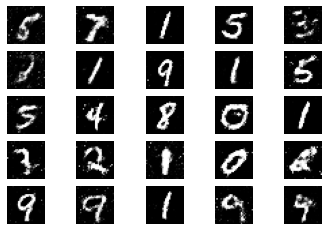

14301 [D loss: 0.687827, acc.: 57.81%] [G loss: 0.824644]
14302 [D loss: 0.673767, acc.: 55.47%] [G loss: 0.927659]
14303 [D loss: 0.648100, acc.: 61.72%] [G loss: 0.883712]
14304 [D loss: 0.677685, acc.: 57.81%] [G loss: 0.931712]
14305 [D loss: 0.657424, acc.: 64.84%] [G loss: 0.930310]
14306 [D loss: 0.660290, acc.: 52.34%] [G loss: 0.848554]
14307 [D loss: 0.688855, acc.: 52.34%] [G loss: 0.904728]
14308 [D loss: 0.647180, acc.: 62.50%] [G loss: 0.842649]
14309 [D loss: 0.674783, acc.: 54.69%] [G loss: 0.874103]
14310 [D loss: 0.636638, acc.: 66.41%] [G loss: 0.854959]
14311 [D loss: 0.687678, acc.: 57.03%] [G loss: 0.846859]
14312 [D loss: 0.677080, acc.: 55.47%] [G loss: 0.865081]
14313 [D loss: 0.649092, acc.: 60.16%] [G loss: 0.839563]
14314 [D loss: 0.650435, acc.: 57.81%] [G loss: 0.894381]
14315 [D loss: 0.677387, acc.: 60.94%] [G loss: 0.946162]
14316 [D loss: 0.663208, acc.: 60.16%] [G loss: 0.884995]
14317 [D loss: 0.664906, acc.: 59.38%] [G loss: 0.885000]
14318 [D loss:

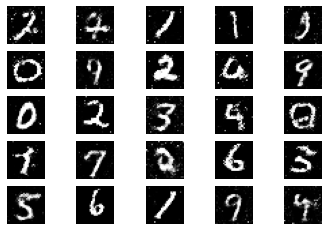

14401 [D loss: 0.694152, acc.: 50.78%] [G loss: 0.958434]
14402 [D loss: 0.646808, acc.: 66.41%] [G loss: 0.841725]
14403 [D loss: 0.671319, acc.: 54.69%] [G loss: 0.906757]
14404 [D loss: 0.634693, acc.: 64.06%] [G loss: 0.886389]
14405 [D loss: 0.668647, acc.: 57.81%] [G loss: 0.876531]
14406 [D loss: 0.674139, acc.: 49.22%] [G loss: 0.898496]
14407 [D loss: 0.617905, acc.: 67.97%] [G loss: 0.939259]
14408 [D loss: 0.726852, acc.: 47.66%] [G loss: 0.881674]
14409 [D loss: 0.643040, acc.: 64.84%] [G loss: 0.893646]
14410 [D loss: 0.679590, acc.: 57.81%] [G loss: 0.883298]
14411 [D loss: 0.692164, acc.: 51.56%] [G loss: 0.882370]
14412 [D loss: 0.624100, acc.: 64.84%] [G loss: 0.937193]
14413 [D loss: 0.659248, acc.: 57.81%] [G loss: 0.894384]
14414 [D loss: 0.661649, acc.: 62.50%] [G loss: 0.892088]
14415 [D loss: 0.655518, acc.: 62.50%] [G loss: 0.894877]
14416 [D loss: 0.611419, acc.: 67.19%] [G loss: 0.990412]
14417 [D loss: 0.620956, acc.: 64.06%] [G loss: 0.893702]
14418 [D loss:

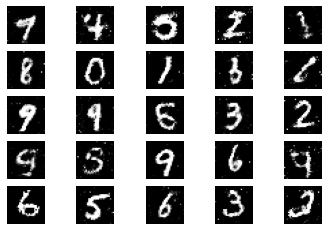

14501 [D loss: 0.652495, acc.: 60.16%] [G loss: 0.930467]
14502 [D loss: 0.675606, acc.: 60.94%] [G loss: 0.947326]
14503 [D loss: 0.633504, acc.: 60.94%] [G loss: 0.911123]
14504 [D loss: 0.649945, acc.: 60.94%] [G loss: 0.941775]
14505 [D loss: 0.694090, acc.: 56.25%] [G loss: 0.872091]
14506 [D loss: 0.665359, acc.: 62.50%] [G loss: 0.864587]
14507 [D loss: 0.640924, acc.: 60.16%] [G loss: 0.850361]
14508 [D loss: 0.627500, acc.: 65.62%] [G loss: 0.878051]
14509 [D loss: 0.635431, acc.: 66.41%] [G loss: 0.880483]
14510 [D loss: 0.702564, acc.: 57.81%] [G loss: 0.878742]
14511 [D loss: 0.683732, acc.: 56.25%] [G loss: 0.885465]
14512 [D loss: 0.693677, acc.: 50.78%] [G loss: 0.862692]
14513 [D loss: 0.661368, acc.: 57.81%] [G loss: 0.892198]
14514 [D loss: 0.636102, acc.: 61.72%] [G loss: 0.941309]
14515 [D loss: 0.664226, acc.: 58.59%] [G loss: 0.890492]
14516 [D loss: 0.658305, acc.: 55.47%] [G loss: 0.879215]
14517 [D loss: 0.642024, acc.: 64.84%] [G loss: 0.843192]
14518 [D loss:

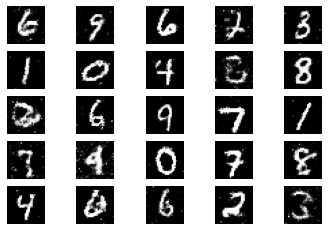

14601 [D loss: 0.664419, acc.: 57.03%] [G loss: 0.874632]
14602 [D loss: 0.659153, acc.: 62.50%] [G loss: 0.906992]
14603 [D loss: 0.670001, acc.: 57.03%] [G loss: 0.838828]
14604 [D loss: 0.673056, acc.: 59.38%] [G loss: 0.873026]
14605 [D loss: 0.667886, acc.: 59.38%] [G loss: 0.907265]
14606 [D loss: 0.742685, acc.: 47.66%] [G loss: 0.899654]
14607 [D loss: 0.693774, acc.: 52.34%] [G loss: 0.897457]
14608 [D loss: 0.667963, acc.: 62.50%] [G loss: 0.849265]
14609 [D loss: 0.665613, acc.: 60.16%] [G loss: 0.895763]
14610 [D loss: 0.668586, acc.: 59.38%] [G loss: 0.883423]
14611 [D loss: 0.676179, acc.: 61.72%] [G loss: 0.895704]
14612 [D loss: 0.678897, acc.: 56.25%] [G loss: 0.859939]
14613 [D loss: 0.669001, acc.: 53.91%] [G loss: 0.920329]
14614 [D loss: 0.671050, acc.: 55.47%] [G loss: 0.914442]
14615 [D loss: 0.657261, acc.: 63.28%] [G loss: 0.894897]
14616 [D loss: 0.673225, acc.: 57.81%] [G loss: 0.846979]
14617 [D loss: 0.652821, acc.: 58.59%] [G loss: 0.937541]
14618 [D loss:

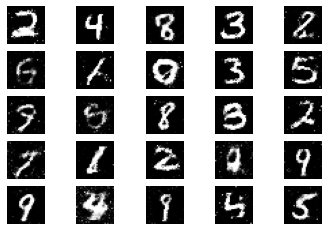

14701 [D loss: 0.661604, acc.: 56.25%] [G loss: 0.894189]
14702 [D loss: 0.646470, acc.: 61.72%] [G loss: 0.936412]
14703 [D loss: 0.648154, acc.: 63.28%] [G loss: 0.859581]
14704 [D loss: 0.652932, acc.: 63.28%] [G loss: 0.869616]
14705 [D loss: 0.690747, acc.: 57.81%] [G loss: 0.908057]
14706 [D loss: 0.653100, acc.: 64.84%] [G loss: 0.926388]
14707 [D loss: 0.643114, acc.: 67.19%] [G loss: 0.901352]
14708 [D loss: 0.652609, acc.: 68.75%] [G loss: 0.907037]
14709 [D loss: 0.679613, acc.: 55.47%] [G loss: 0.901176]
14710 [D loss: 0.641545, acc.: 64.06%] [G loss: 0.833428]
14711 [D loss: 0.667077, acc.: 58.59%] [G loss: 0.905159]
14712 [D loss: 0.651997, acc.: 58.59%] [G loss: 0.908721]
14713 [D loss: 0.639234, acc.: 64.84%] [G loss: 0.937029]
14714 [D loss: 0.629379, acc.: 66.41%] [G loss: 0.934306]
14715 [D loss: 0.662126, acc.: 58.59%] [G loss: 0.810584]
14716 [D loss: 0.663420, acc.: 57.03%] [G loss: 0.899525]
14717 [D loss: 0.651763, acc.: 61.72%] [G loss: 0.897129]
14718 [D loss:

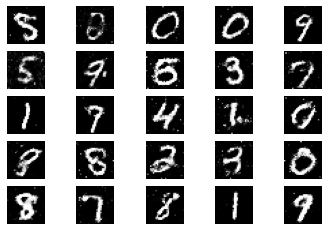

14801 [D loss: 0.684307, acc.: 56.25%] [G loss: 0.918203]
14802 [D loss: 0.715136, acc.: 51.56%] [G loss: 0.856318]
14803 [D loss: 0.640422, acc.: 61.72%] [G loss: 0.866219]
14804 [D loss: 0.671482, acc.: 62.50%] [G loss: 0.891483]
14805 [D loss: 0.674269, acc.: 55.47%] [G loss: 0.898069]
14806 [D loss: 0.636312, acc.: 65.62%] [G loss: 0.850103]
14807 [D loss: 0.699590, acc.: 50.78%] [G loss: 0.844337]
14808 [D loss: 0.721324, acc.: 57.81%] [G loss: 0.846308]
14809 [D loss: 0.634462, acc.: 64.84%] [G loss: 0.867393]
14810 [D loss: 0.684035, acc.: 58.59%] [G loss: 0.846183]
14811 [D loss: 0.647920, acc.: 64.84%] [G loss: 0.870859]
14812 [D loss: 0.614070, acc.: 65.62%] [G loss: 0.883576]
14813 [D loss: 0.649072, acc.: 63.28%] [G loss: 0.888995]
14814 [D loss: 0.668955, acc.: 60.94%] [G loss: 0.952510]
14815 [D loss: 0.671084, acc.: 58.59%] [G loss: 0.859849]
14816 [D loss: 0.656835, acc.: 63.28%] [G loss: 0.855234]
14817 [D loss: 0.705883, acc.: 52.34%] [G loss: 0.862041]
14818 [D loss:

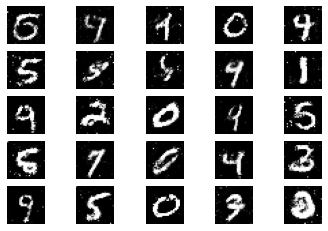

14901 [D loss: 0.701588, acc.: 56.25%] [G loss: 0.881327]
14902 [D loss: 0.684737, acc.: 57.81%] [G loss: 0.862666]
14903 [D loss: 0.644733, acc.: 66.41%] [G loss: 0.861341]
14904 [D loss: 0.647017, acc.: 65.62%] [G loss: 0.916420]
14905 [D loss: 0.648094, acc.: 66.41%] [G loss: 0.903314]
14906 [D loss: 0.652162, acc.: 63.28%] [G loss: 0.854055]
14907 [D loss: 0.601639, acc.: 66.41%] [G loss: 0.871504]
14908 [D loss: 0.636994, acc.: 63.28%] [G loss: 0.809888]
14909 [D loss: 0.614717, acc.: 69.53%] [G loss: 0.893243]
14910 [D loss: 0.679912, acc.: 59.38%] [G loss: 0.932688]
14911 [D loss: 0.643552, acc.: 66.41%] [G loss: 0.921704]
14912 [D loss: 0.655252, acc.: 61.72%] [G loss: 0.881239]
14913 [D loss: 0.688448, acc.: 57.03%] [G loss: 0.871481]
14914 [D loss: 0.666244, acc.: 60.94%] [G loss: 0.907566]
14915 [D loss: 0.693158, acc.: 51.56%] [G loss: 0.949226]
14916 [D loss: 0.628625, acc.: 63.28%] [G loss: 0.879726]
14917 [D loss: 0.619887, acc.: 60.16%] [G loss: 0.909341]
14918 [D loss:

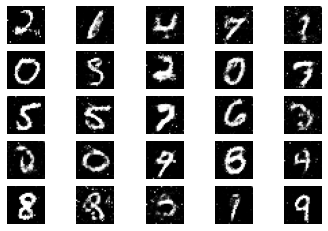

15001 [D loss: 0.614369, acc.: 64.06%] [G loss: 0.861094]
15002 [D loss: 0.660189, acc.: 64.84%] [G loss: 0.925098]
15003 [D loss: 0.698762, acc.: 57.81%] [G loss: 0.971908]
15004 [D loss: 0.648214, acc.: 63.28%] [G loss: 0.907413]
15005 [D loss: 0.667696, acc.: 56.25%] [G loss: 0.974155]
15006 [D loss: 0.614415, acc.: 69.53%] [G loss: 0.928372]
15007 [D loss: 0.631695, acc.: 64.06%] [G loss: 0.938180]
15008 [D loss: 0.676604, acc.: 53.91%] [G loss: 0.910175]
15009 [D loss: 0.660826, acc.: 58.59%] [G loss: 0.897917]
15010 [D loss: 0.665365, acc.: 63.28%] [G loss: 0.904008]
15011 [D loss: 0.683032, acc.: 57.03%] [G loss: 0.937033]
15012 [D loss: 0.658139, acc.: 60.16%] [G loss: 0.982918]
15013 [D loss: 0.674386, acc.: 55.47%] [G loss: 0.952438]
15014 [D loss: 0.688194, acc.: 53.12%] [G loss: 0.913369]
15015 [D loss: 0.655351, acc.: 60.94%] [G loss: 0.903286]
15016 [D loss: 0.689634, acc.: 56.25%] [G loss: 0.884483]
15017 [D loss: 0.622421, acc.: 65.62%] [G loss: 0.979657]
15018 [D loss:

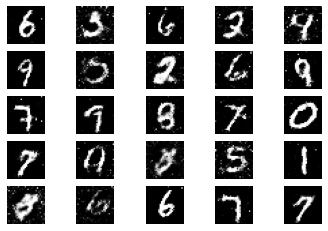

15101 [D loss: 0.671726, acc.: 57.81%] [G loss: 0.861906]
15102 [D loss: 0.650455, acc.: 62.50%] [G loss: 0.903654]
15103 [D loss: 0.659311, acc.: 57.81%] [G loss: 0.912826]
15104 [D loss: 0.657364, acc.: 61.72%] [G loss: 0.863197]
15105 [D loss: 0.699552, acc.: 58.59%] [G loss: 0.831037]
15106 [D loss: 0.698322, acc.: 54.69%] [G loss: 0.872410]
15107 [D loss: 0.660608, acc.: 57.81%] [G loss: 0.924142]
15108 [D loss: 0.647591, acc.: 59.38%] [G loss: 0.926446]
15109 [D loss: 0.650101, acc.: 63.28%] [G loss: 0.876816]
15110 [D loss: 0.635477, acc.: 67.19%] [G loss: 0.874170]
15111 [D loss: 0.649398, acc.: 56.25%] [G loss: 0.875975]
15112 [D loss: 0.693687, acc.: 58.59%] [G loss: 0.903779]
15113 [D loss: 0.677623, acc.: 60.94%] [G loss: 0.899663]
15114 [D loss: 0.683362, acc.: 59.38%] [G loss: 0.886635]
15115 [D loss: 0.663499, acc.: 58.59%] [G loss: 0.864506]
15116 [D loss: 0.680489, acc.: 61.72%] [G loss: 0.883293]
15117 [D loss: 0.653077, acc.: 57.81%] [G loss: 0.903976]
15118 [D loss:

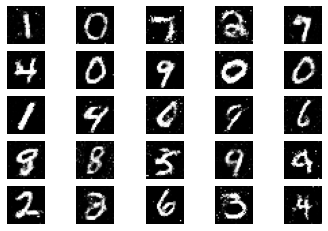

15201 [D loss: 0.676611, acc.: 57.03%] [G loss: 0.893651]
15202 [D loss: 0.636537, acc.: 64.06%] [G loss: 0.989298]
15203 [D loss: 0.655114, acc.: 59.38%] [G loss: 0.893102]
15204 [D loss: 0.664888, acc.: 62.50%] [G loss: 0.931737]
15205 [D loss: 0.655250, acc.: 61.72%] [G loss: 0.894941]
15206 [D loss: 0.719008, acc.: 50.78%] [G loss: 0.910985]
15207 [D loss: 0.667170, acc.: 60.94%] [G loss: 0.885778]
15208 [D loss: 0.692729, acc.: 57.03%] [G loss: 0.933709]
15209 [D loss: 0.724345, acc.: 46.09%] [G loss: 0.872716]
15210 [D loss: 0.665635, acc.: 63.28%] [G loss: 0.897343]
15211 [D loss: 0.669901, acc.: 59.38%] [G loss: 0.834941]
15212 [D loss: 0.678403, acc.: 53.91%] [G loss: 0.837092]
15213 [D loss: 0.648329, acc.: 65.62%] [G loss: 0.856718]
15214 [D loss: 0.660581, acc.: 61.72%] [G loss: 0.864679]
15215 [D loss: 0.677998, acc.: 59.38%] [G loss: 0.894402]
15216 [D loss: 0.656278, acc.: 60.94%] [G loss: 0.911763]
15217 [D loss: 0.688856, acc.: 59.38%] [G loss: 0.937015]
15218 [D loss:

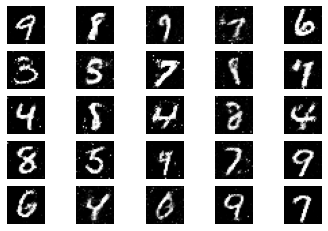

15301 [D loss: 0.697555, acc.: 50.78%] [G loss: 0.906556]
15302 [D loss: 0.644198, acc.: 66.41%] [G loss: 0.880298]
15303 [D loss: 0.672204, acc.: 54.69%] [G loss: 0.864330]
15304 [D loss: 0.681511, acc.: 54.69%] [G loss: 0.933343]
15305 [D loss: 0.656525, acc.: 63.28%] [G loss: 0.903955]
15306 [D loss: 0.661498, acc.: 61.72%] [G loss: 0.956772]
15307 [D loss: 0.635449, acc.: 58.59%] [G loss: 0.921692]
15308 [D loss: 0.667325, acc.: 53.12%] [G loss: 0.942659]
15309 [D loss: 0.644804, acc.: 59.38%] [G loss: 0.881584]
15310 [D loss: 0.722731, acc.: 52.34%] [G loss: 0.867594]
15311 [D loss: 0.707522, acc.: 53.12%] [G loss: 0.856017]
15312 [D loss: 0.671796, acc.: 60.94%] [G loss: 0.898659]
15313 [D loss: 0.670954, acc.: 55.47%] [G loss: 0.891748]
15314 [D loss: 0.629076, acc.: 67.19%] [G loss: 0.866091]
15315 [D loss: 0.648086, acc.: 61.72%] [G loss: 0.879391]
15316 [D loss: 0.663673, acc.: 58.59%] [G loss: 0.901219]
15317 [D loss: 0.681347, acc.: 57.81%] [G loss: 0.880081]
15318 [D loss:

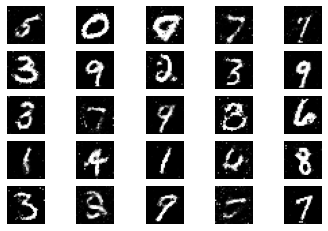

15401 [D loss: 0.675046, acc.: 52.34%] [G loss: 0.954012]
15402 [D loss: 0.691884, acc.: 51.56%] [G loss: 0.908374]
15403 [D loss: 0.687846, acc.: 55.47%] [G loss: 0.888648]
15404 [D loss: 0.678724, acc.: 59.38%] [G loss: 0.904770]
15405 [D loss: 0.696435, acc.: 53.91%] [G loss: 0.968071]
15406 [D loss: 0.658139, acc.: 59.38%] [G loss: 0.936861]
15407 [D loss: 0.677546, acc.: 52.34%] [G loss: 0.907541]
15408 [D loss: 0.670646, acc.: 59.38%] [G loss: 0.927451]
15409 [D loss: 0.638601, acc.: 65.62%] [G loss: 0.981357]
15410 [D loss: 0.652718, acc.: 63.28%] [G loss: 0.948662]
15411 [D loss: 0.710503, acc.: 53.91%] [G loss: 0.882026]
15412 [D loss: 0.626055, acc.: 67.19%] [G loss: 0.850456]
15413 [D loss: 0.633920, acc.: 64.06%] [G loss: 0.933738]
15414 [D loss: 0.674351, acc.: 60.94%] [G loss: 0.885430]
15415 [D loss: 0.660574, acc.: 56.25%] [G loss: 0.890701]
15416 [D loss: 0.651217, acc.: 58.59%] [G loss: 0.920857]
15417 [D loss: 0.648713, acc.: 64.06%] [G loss: 0.888257]
15418 [D loss:

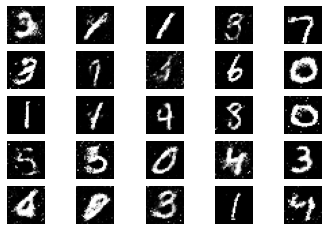

15501 [D loss: 0.622501, acc.: 64.06%] [G loss: 0.920230]
15502 [D loss: 0.608724, acc.: 64.06%] [G loss: 0.895014]
15503 [D loss: 0.689017, acc.: 56.25%] [G loss: 0.919803]
15504 [D loss: 0.658445, acc.: 60.94%] [G loss: 0.879209]
15505 [D loss: 0.619416, acc.: 67.19%] [G loss: 0.875464]
15506 [D loss: 0.669005, acc.: 57.03%] [G loss: 0.866935]
15507 [D loss: 0.650630, acc.: 65.62%] [G loss: 0.882992]
15508 [D loss: 0.712521, acc.: 56.25%] [G loss: 0.959351]
15509 [D loss: 0.647578, acc.: 58.59%] [G loss: 0.855784]
15510 [D loss: 0.677744, acc.: 57.81%] [G loss: 0.866143]
15511 [D loss: 0.666044, acc.: 60.16%] [G loss: 0.836434]
15512 [D loss: 0.664667, acc.: 57.81%] [G loss: 0.920100]
15513 [D loss: 0.686546, acc.: 52.34%] [G loss: 0.878957]
15514 [D loss: 0.658905, acc.: 59.38%] [G loss: 0.935770]
15515 [D loss: 0.613908, acc.: 72.66%] [G loss: 0.907416]
15516 [D loss: 0.618772, acc.: 71.09%] [G loss: 0.955123]
15517 [D loss: 0.662400, acc.: 64.06%] [G loss: 0.928614]
15518 [D loss:

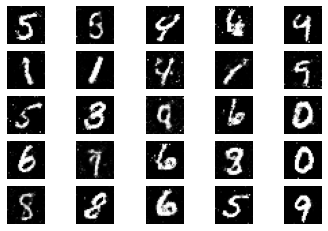

15601 [D loss: 0.661569, acc.: 59.38%] [G loss: 0.857940]
15602 [D loss: 0.643951, acc.: 65.62%] [G loss: 0.924440]
15603 [D loss: 0.685880, acc.: 55.47%] [G loss: 0.871820]
15604 [D loss: 0.666471, acc.: 57.81%] [G loss: 0.865119]
15605 [D loss: 0.650491, acc.: 63.28%] [G loss: 0.845680]
15606 [D loss: 0.633998, acc.: 59.38%] [G loss: 0.890713]
15607 [D loss: 0.686326, acc.: 58.59%] [G loss: 0.895326]
15608 [D loss: 0.633221, acc.: 66.41%] [G loss: 0.919305]
15609 [D loss: 0.705763, acc.: 53.91%] [G loss: 0.877459]
15610 [D loss: 0.656548, acc.: 63.28%] [G loss: 0.867048]
15611 [D loss: 0.642906, acc.: 62.50%] [G loss: 0.855500]
15612 [D loss: 0.668730, acc.: 51.56%] [G loss: 0.857546]
15613 [D loss: 0.670366, acc.: 57.81%] [G loss: 0.939031]
15614 [D loss: 0.648205, acc.: 64.84%] [G loss: 0.926965]
15615 [D loss: 0.657339, acc.: 57.03%] [G loss: 0.901155]
15616 [D loss: 0.660761, acc.: 63.28%] [G loss: 0.892461]
15617 [D loss: 0.685182, acc.: 53.12%] [G loss: 0.917421]
15618 [D loss:

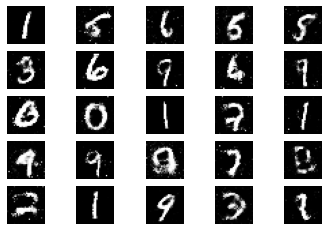

15701 [D loss: 0.681636, acc.: 56.25%] [G loss: 0.888646]
15702 [D loss: 0.684700, acc.: 56.25%] [G loss: 0.844291]
15703 [D loss: 0.614741, acc.: 67.19%] [G loss: 0.871000]
15704 [D loss: 0.678907, acc.: 58.59%] [G loss: 0.860550]
15705 [D loss: 0.688273, acc.: 60.16%] [G loss: 0.895404]
15706 [D loss: 0.678058, acc.: 54.69%] [G loss: 0.959645]
15707 [D loss: 0.632815, acc.: 60.94%] [G loss: 0.925151]
15708 [D loss: 0.654322, acc.: 64.06%] [G loss: 0.921623]
15709 [D loss: 0.620348, acc.: 68.75%] [G loss: 0.942451]
15710 [D loss: 0.647081, acc.: 60.16%] [G loss: 0.943801]
15711 [D loss: 0.677542, acc.: 59.38%] [G loss: 1.004272]
15712 [D loss: 0.671280, acc.: 57.03%] [G loss: 0.869217]
15713 [D loss: 0.657987, acc.: 57.81%] [G loss: 0.886045]
15714 [D loss: 0.694156, acc.: 52.34%] [G loss: 0.891023]
15715 [D loss: 0.681202, acc.: 55.47%] [G loss: 0.896905]
15716 [D loss: 0.656515, acc.: 58.59%] [G loss: 0.861806]
15717 [D loss: 0.624861, acc.: 64.06%] [G loss: 0.902374]
15718 [D loss:

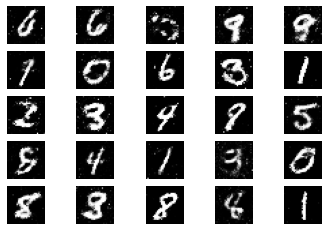

15801 [D loss: 0.653570, acc.: 58.59%] [G loss: 0.840600]
15802 [D loss: 0.663827, acc.: 60.94%] [G loss: 0.897965]
15803 [D loss: 0.659104, acc.: 58.59%] [G loss: 0.902932]
15804 [D loss: 0.647188, acc.: 60.16%] [G loss: 0.867980]
15805 [D loss: 0.684165, acc.: 60.16%] [G loss: 0.871100]
15806 [D loss: 0.669443, acc.: 53.12%] [G loss: 0.906813]
15807 [D loss: 0.716303, acc.: 40.62%] [G loss: 0.849514]
15808 [D loss: 0.682379, acc.: 54.69%] [G loss: 0.880225]
15809 [D loss: 0.637496, acc.: 60.94%] [G loss: 0.893637]
15810 [D loss: 0.607002, acc.: 71.09%] [G loss: 0.939387]
15811 [D loss: 0.647431, acc.: 62.50%] [G loss: 0.886384]
15812 [D loss: 0.644024, acc.: 66.41%] [G loss: 0.904098]
15813 [D loss: 0.632881, acc.: 69.53%] [G loss: 0.896056]
15814 [D loss: 0.643019, acc.: 63.28%] [G loss: 0.864255]
15815 [D loss: 0.628277, acc.: 66.41%] [G loss: 0.860108]
15816 [D loss: 0.681571, acc.: 60.16%] [G loss: 0.880873]
15817 [D loss: 0.630134, acc.: 64.06%] [G loss: 0.902096]
15818 [D loss:

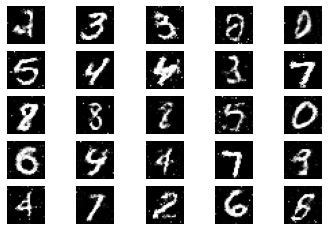

15901 [D loss: 0.661312, acc.: 60.16%] [G loss: 0.905864]
15902 [D loss: 0.686014, acc.: 56.25%] [G loss: 0.861187]
15903 [D loss: 0.681405, acc.: 55.47%] [G loss: 0.891440]
15904 [D loss: 0.683662, acc.: 57.81%] [G loss: 0.937029]
15905 [D loss: 0.641712, acc.: 61.72%] [G loss: 0.857097]
15906 [D loss: 0.650598, acc.: 64.84%] [G loss: 0.857775]
15907 [D loss: 0.656993, acc.: 59.38%] [G loss: 0.886529]
15908 [D loss: 0.610526, acc.: 67.19%] [G loss: 0.859037]
15909 [D loss: 0.676514, acc.: 53.91%] [G loss: 0.855942]
15910 [D loss: 0.614166, acc.: 61.72%] [G loss: 0.907585]
15911 [D loss: 0.671374, acc.: 58.59%] [G loss: 0.909078]
15912 [D loss: 0.635929, acc.: 65.62%] [G loss: 0.913648]
15913 [D loss: 0.667823, acc.: 57.81%] [G loss: 0.982107]
15914 [D loss: 0.634011, acc.: 63.28%] [G loss: 0.889914]
15915 [D loss: 0.670860, acc.: 58.59%] [G loss: 0.831602]
15916 [D loss: 0.642236, acc.: 67.19%] [G loss: 0.809431]
15917 [D loss: 0.652167, acc.: 61.72%] [G loss: 0.866248]
15918 [D loss:

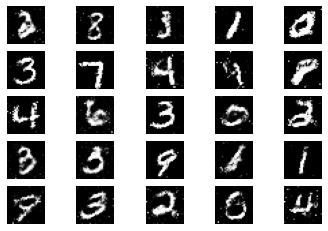

16001 [D loss: 0.661220, acc.: 57.81%] [G loss: 0.908428]
16002 [D loss: 0.667176, acc.: 58.59%] [G loss: 0.866830]
16003 [D loss: 0.647662, acc.: 62.50%] [G loss: 0.869056]
16004 [D loss: 0.655086, acc.: 60.16%] [G loss: 0.884270]
16005 [D loss: 0.637008, acc.: 60.94%] [G loss: 0.905399]
16006 [D loss: 0.659119, acc.: 61.72%] [G loss: 0.867438]
16007 [D loss: 0.667215, acc.: 56.25%] [G loss: 0.915060]
16008 [D loss: 0.702125, acc.: 55.47%] [G loss: 0.932559]
16009 [D loss: 0.736425, acc.: 50.00%] [G loss: 0.896683]
16010 [D loss: 0.684539, acc.: 53.91%] [G loss: 0.840108]
16011 [D loss: 0.658195, acc.: 61.72%] [G loss: 0.880771]
16012 [D loss: 0.646304, acc.: 60.94%] [G loss: 0.867275]
16013 [D loss: 0.622846, acc.: 65.62%] [G loss: 0.892619]
16014 [D loss: 0.636997, acc.: 65.62%] [G loss: 0.945330]
16015 [D loss: 0.641716, acc.: 61.72%] [G loss: 0.885007]
16016 [D loss: 0.631775, acc.: 60.94%] [G loss: 0.886441]
16017 [D loss: 0.645288, acc.: 61.72%] [G loss: 0.863833]
16018 [D loss:

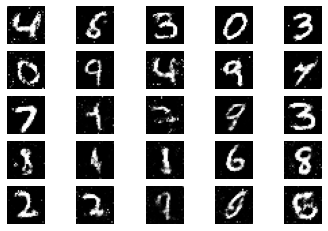

16101 [D loss: 0.645472, acc.: 60.94%] [G loss: 0.894664]
16102 [D loss: 0.659541, acc.: 60.16%] [G loss: 0.846125]
16103 [D loss: 0.643525, acc.: 60.94%] [G loss: 0.897809]
16104 [D loss: 0.666006, acc.: 64.84%] [G loss: 0.854693]
16105 [D loss: 0.691870, acc.: 59.38%] [G loss: 0.874472]
16106 [D loss: 0.644797, acc.: 61.72%] [G loss: 0.930663]
16107 [D loss: 0.668026, acc.: 56.25%] [G loss: 0.938498]
16108 [D loss: 0.668767, acc.: 57.03%] [G loss: 0.853453]
16109 [D loss: 0.662277, acc.: 59.38%] [G loss: 0.848595]
16110 [D loss: 0.672951, acc.: 60.94%] [G loss: 0.886398]
16111 [D loss: 0.683247, acc.: 58.59%] [G loss: 0.949343]
16112 [D loss: 0.645750, acc.: 60.94%] [G loss: 0.930762]
16113 [D loss: 0.642714, acc.: 63.28%] [G loss: 0.933883]
16114 [D loss: 0.672909, acc.: 56.25%] [G loss: 0.894027]
16115 [D loss: 0.653607, acc.: 60.94%] [G loss: 0.889177]
16116 [D loss: 0.646918, acc.: 58.59%] [G loss: 0.862667]
16117 [D loss: 0.695270, acc.: 53.12%] [G loss: 0.819865]
16118 [D loss:

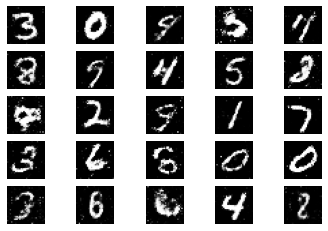

16201 [D loss: 0.693393, acc.: 57.81%] [G loss: 0.904299]
16202 [D loss: 0.670034, acc.: 60.16%] [G loss: 0.952089]
16203 [D loss: 0.654880, acc.: 56.25%] [G loss: 0.941314]
16204 [D loss: 0.685255, acc.: 57.03%] [G loss: 0.909370]
16205 [D loss: 0.652964, acc.: 63.28%] [G loss: 0.955319]
16206 [D loss: 0.623081, acc.: 71.09%] [G loss: 0.849941]
16207 [D loss: 0.666055, acc.: 56.25%] [G loss: 0.902086]
16208 [D loss: 0.607429, acc.: 72.66%] [G loss: 0.949332]
16209 [D loss: 0.685511, acc.: 53.91%] [G loss: 0.946704]
16210 [D loss: 0.631922, acc.: 63.28%] [G loss: 0.911305]
16211 [D loss: 0.658267, acc.: 60.16%] [G loss: 0.926755]
16212 [D loss: 0.664338, acc.: 67.19%] [G loss: 0.902765]
16213 [D loss: 0.667932, acc.: 59.38%] [G loss: 0.895278]
16214 [D loss: 0.657884, acc.: 58.59%] [G loss: 0.916484]
16215 [D loss: 0.652818, acc.: 60.94%] [G loss: 0.951230]
16216 [D loss: 0.656586, acc.: 60.16%] [G loss: 0.896919]
16217 [D loss: 0.666807, acc.: 53.91%] [G loss: 0.902478]
16218 [D loss:

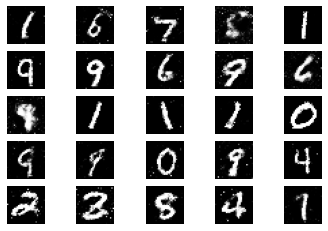

16301 [D loss: 0.685039, acc.: 60.16%] [G loss: 0.913327]
16302 [D loss: 0.682285, acc.: 59.38%] [G loss: 0.877157]
16303 [D loss: 0.629117, acc.: 66.41%] [G loss: 0.887093]
16304 [D loss: 0.649182, acc.: 62.50%] [G loss: 0.889310]
16305 [D loss: 0.676667, acc.: 56.25%] [G loss: 0.973077]
16306 [D loss: 0.633888, acc.: 67.19%] [G loss: 0.998458]
16307 [D loss: 0.688345, acc.: 56.25%] [G loss: 0.934012]
16308 [D loss: 0.669957, acc.: 55.47%] [G loss: 0.903723]
16309 [D loss: 0.702996, acc.: 53.91%] [G loss: 0.851868]
16310 [D loss: 0.653149, acc.: 60.94%] [G loss: 0.902499]
16311 [D loss: 0.625359, acc.: 62.50%] [G loss: 0.885487]
16312 [D loss: 0.642554, acc.: 61.72%] [G loss: 0.871620]
16313 [D loss: 0.666778, acc.: 61.72%] [G loss: 0.871159]
16314 [D loss: 0.652974, acc.: 56.25%] [G loss: 0.903230]
16315 [D loss: 0.615552, acc.: 67.97%] [G loss: 0.893665]
16316 [D loss: 0.672473, acc.: 58.59%] [G loss: 0.871878]
16317 [D loss: 0.641105, acc.: 64.06%] [G loss: 0.879625]
16318 [D loss:

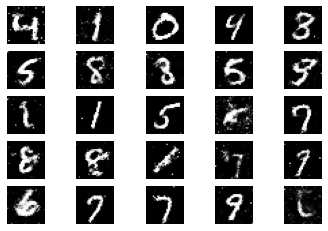

16401 [D loss: 0.616883, acc.: 66.41%] [G loss: 0.887073]
16402 [D loss: 0.666474, acc.: 58.59%] [G loss: 0.906576]
16403 [D loss: 0.671007, acc.: 58.59%] [G loss: 0.897530]
16404 [D loss: 0.645473, acc.: 64.84%] [G loss: 0.914204]
16405 [D loss: 0.656622, acc.: 59.38%] [G loss: 0.851560]
16406 [D loss: 0.663106, acc.: 57.03%] [G loss: 0.892091]
16407 [D loss: 0.704010, acc.: 52.34%] [G loss: 0.933024]
16408 [D loss: 0.684343, acc.: 57.03%] [G loss: 0.875168]
16409 [D loss: 0.650160, acc.: 60.16%] [G loss: 0.906009]
16410 [D loss: 0.689777, acc.: 57.03%] [G loss: 0.906635]
16411 [D loss: 0.652352, acc.: 64.06%] [G loss: 0.902911]
16412 [D loss: 0.671658, acc.: 57.03%] [G loss: 0.862064]
16413 [D loss: 0.650205, acc.: 57.81%] [G loss: 0.916722]
16414 [D loss: 0.638792, acc.: 71.88%] [G loss: 0.896871]
16415 [D loss: 0.697550, acc.: 53.12%] [G loss: 0.861543]
16416 [D loss: 0.628227, acc.: 67.97%] [G loss: 0.959510]
16417 [D loss: 0.663592, acc.: 59.38%] [G loss: 0.870263]
16418 [D loss:

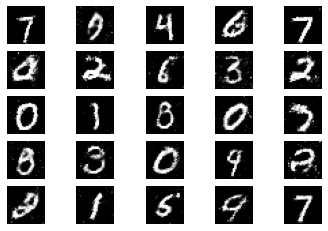

16501 [D loss: 0.618518, acc.: 69.53%] [G loss: 0.847099]
16502 [D loss: 0.701334, acc.: 50.78%] [G loss: 0.911090]
16503 [D loss: 0.625210, acc.: 61.72%] [G loss: 0.966317]
16504 [D loss: 0.687257, acc.: 53.91%] [G loss: 0.921703]
16505 [D loss: 0.685850, acc.: 52.34%] [G loss: 0.848230]
16506 [D loss: 0.666499, acc.: 62.50%] [G loss: 0.857503]
16507 [D loss: 0.660630, acc.: 60.16%] [G loss: 0.887182]
16508 [D loss: 0.646030, acc.: 61.72%] [G loss: 0.918589]
16509 [D loss: 0.652845, acc.: 63.28%] [G loss: 0.915383]
16510 [D loss: 0.621761, acc.: 69.53%] [G loss: 0.897735]
16511 [D loss: 0.669126, acc.: 59.38%] [G loss: 0.885696]
16512 [D loss: 0.660700, acc.: 59.38%] [G loss: 0.883883]
16513 [D loss: 0.649135, acc.: 59.38%] [G loss: 0.940584]
16514 [D loss: 0.682018, acc.: 57.81%] [G loss: 0.902504]
16515 [D loss: 0.667046, acc.: 60.16%] [G loss: 0.845165]
16516 [D loss: 0.703523, acc.: 53.12%] [G loss: 0.842879]
16517 [D loss: 0.619682, acc.: 63.28%] [G loss: 0.959911]
16518 [D loss:

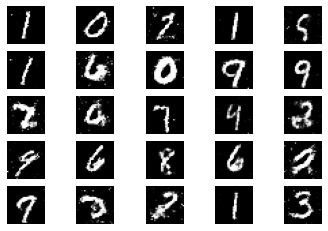

16601 [D loss: 0.670633, acc.: 57.81%] [G loss: 0.871981]
16602 [D loss: 0.644171, acc.: 62.50%] [G loss: 0.888298]
16603 [D loss: 0.644347, acc.: 64.06%] [G loss: 0.902481]
16604 [D loss: 0.682911, acc.: 54.69%] [G loss: 0.906051]
16605 [D loss: 0.634651, acc.: 64.84%] [G loss: 0.871225]
16606 [D loss: 0.660269, acc.: 56.25%] [G loss: 0.970245]
16607 [D loss: 0.676487, acc.: 59.38%] [G loss: 0.941302]
16608 [D loss: 0.636875, acc.: 64.06%] [G loss: 0.916347]
16609 [D loss: 0.666473, acc.: 55.47%] [G loss: 0.926123]
16610 [D loss: 0.652986, acc.: 61.72%] [G loss: 0.855538]
16611 [D loss: 0.619383, acc.: 65.62%] [G loss: 0.916123]
16612 [D loss: 0.711259, acc.: 55.47%] [G loss: 1.009009]
16613 [D loss: 0.632326, acc.: 67.19%] [G loss: 0.934717]
16614 [D loss: 0.657866, acc.: 55.47%] [G loss: 0.939142]
16615 [D loss: 0.645500, acc.: 58.59%] [G loss: 0.898752]
16616 [D loss: 0.642410, acc.: 62.50%] [G loss: 0.935206]
16617 [D loss: 0.660672, acc.: 66.41%] [G loss: 0.876674]
16618 [D loss:

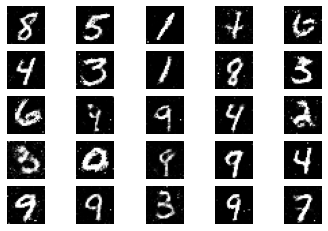

16701 [D loss: 0.675441, acc.: 55.47%] [G loss: 0.923114]
16702 [D loss: 0.667783, acc.: 62.50%] [G loss: 0.952096]
16703 [D loss: 0.636989, acc.: 64.06%] [G loss: 0.911337]
16704 [D loss: 0.689576, acc.: 55.47%] [G loss: 0.950859]
16705 [D loss: 0.649337, acc.: 59.38%] [G loss: 0.887495]
16706 [D loss: 0.650650, acc.: 66.41%] [G loss: 0.910966]
16707 [D loss: 0.644990, acc.: 62.50%] [G loss: 0.951214]
16708 [D loss: 0.670251, acc.: 56.25%] [G loss: 0.869247]
16709 [D loss: 0.649267, acc.: 61.72%] [G loss: 0.921331]
16710 [D loss: 0.685327, acc.: 57.03%] [G loss: 0.897045]
16711 [D loss: 0.687215, acc.: 57.81%] [G loss: 0.948997]
16712 [D loss: 0.630490, acc.: 62.50%] [G loss: 0.946958]
16713 [D loss: 0.672543, acc.: 54.69%] [G loss: 0.890646]
16714 [D loss: 0.671209, acc.: 57.03%] [G loss: 0.915225]
16715 [D loss: 0.677193, acc.: 60.16%] [G loss: 0.863284]
16716 [D loss: 0.669524, acc.: 57.03%] [G loss: 0.925286]
16717 [D loss: 0.665702, acc.: 57.03%] [G loss: 0.910150]
16718 [D loss:

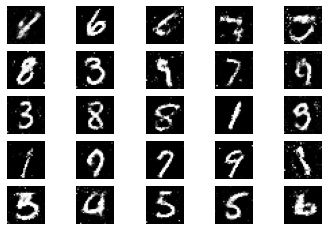

16801 [D loss: 0.675106, acc.: 57.03%] [G loss: 0.904340]
16802 [D loss: 0.640579, acc.: 61.72%] [G loss: 0.921111]
16803 [D loss: 0.634160, acc.: 57.03%] [G loss: 0.949686]
16804 [D loss: 0.661198, acc.: 60.94%] [G loss: 0.907305]
16805 [D loss: 0.616933, acc.: 67.97%] [G loss: 0.864836]
16806 [D loss: 0.661269, acc.: 58.59%] [G loss: 0.935509]
16807 [D loss: 0.643651, acc.: 67.97%] [G loss: 0.895598]
16808 [D loss: 0.651096, acc.: 60.94%] [G loss: 0.882314]
16809 [D loss: 0.635807, acc.: 65.62%] [G loss: 0.963177]
16810 [D loss: 0.685667, acc.: 54.69%] [G loss: 0.889224]
16811 [D loss: 0.692495, acc.: 57.03%] [G loss: 0.893811]
16812 [D loss: 0.698727, acc.: 50.78%] [G loss: 0.880768]
16813 [D loss: 0.643688, acc.: 63.28%] [G loss: 0.916006]
16814 [D loss: 0.662228, acc.: 59.38%] [G loss: 0.903372]
16815 [D loss: 0.641548, acc.: 58.59%] [G loss: 0.900433]
16816 [D loss: 0.669156, acc.: 56.25%] [G loss: 0.862952]
16817 [D loss: 0.632673, acc.: 66.41%] [G loss: 0.895177]
16818 [D loss:

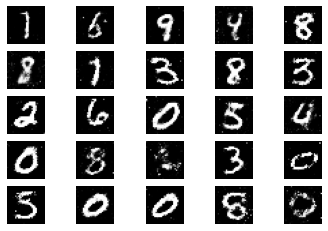

16901 [D loss: 0.634987, acc.: 63.28%] [G loss: 0.893550]
16902 [D loss: 0.636727, acc.: 65.62%] [G loss: 0.871235]
16903 [D loss: 0.697245, acc.: 54.69%] [G loss: 0.886782]
16904 [D loss: 0.657292, acc.: 57.81%] [G loss: 0.861062]
16905 [D loss: 0.685341, acc.: 54.69%] [G loss: 0.918950]
16906 [D loss: 0.634425, acc.: 60.16%] [G loss: 0.915532]
16907 [D loss: 0.634121, acc.: 61.72%] [G loss: 0.877799]
16908 [D loss: 0.693229, acc.: 57.03%] [G loss: 0.912559]
16909 [D loss: 0.609004, acc.: 66.41%] [G loss: 0.918919]
16910 [D loss: 0.648092, acc.: 64.06%] [G loss: 0.924489]
16911 [D loss: 0.662279, acc.: 58.59%] [G loss: 0.918748]
16912 [D loss: 0.641953, acc.: 64.06%] [G loss: 0.880195]
16913 [D loss: 0.707323, acc.: 53.91%] [G loss: 0.858253]
16914 [D loss: 0.583443, acc.: 75.00%] [G loss: 0.857085]
16915 [D loss: 0.630555, acc.: 61.72%] [G loss: 0.961254]
16916 [D loss: 0.678259, acc.: 56.25%] [G loss: 0.886911]
16917 [D loss: 0.618910, acc.: 67.19%] [G loss: 0.865085]
16918 [D loss:

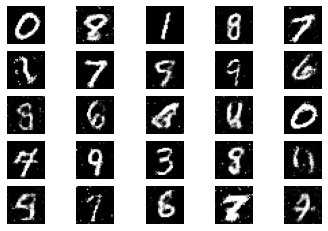

17001 [D loss: 0.644698, acc.: 63.28%] [G loss: 0.866873]
17002 [D loss: 0.666953, acc.: 58.59%] [G loss: 0.884132]
17003 [D loss: 0.627427, acc.: 66.41%] [G loss: 0.857453]
17004 [D loss: 0.632741, acc.: 64.06%] [G loss: 0.888466]
17005 [D loss: 0.678985, acc.: 52.34%] [G loss: 0.991620]
17006 [D loss: 0.653450, acc.: 62.50%] [G loss: 0.898624]
17007 [D loss: 0.680446, acc.: 57.81%] [G loss: 0.875434]
17008 [D loss: 0.667874, acc.: 61.72%] [G loss: 0.909638]
17009 [D loss: 0.660864, acc.: 60.16%] [G loss: 0.870241]
17010 [D loss: 0.694555, acc.: 53.91%] [G loss: 0.876778]
17011 [D loss: 0.669780, acc.: 62.50%] [G loss: 0.883860]
17012 [D loss: 0.632195, acc.: 62.50%] [G loss: 0.881710]
17013 [D loss: 0.643402, acc.: 63.28%] [G loss: 0.913525]
17014 [D loss: 0.676852, acc.: 59.38%] [G loss: 0.821822]
17015 [D loss: 0.698416, acc.: 57.03%] [G loss: 0.876610]
17016 [D loss: 0.674993, acc.: 55.47%] [G loss: 0.907928]
17017 [D loss: 0.673188, acc.: 58.59%] [G loss: 0.859892]
17018 [D loss:

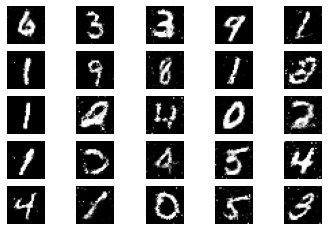

17101 [D loss: 0.631850, acc.: 65.62%] [G loss: 0.975748]
17102 [D loss: 0.642619, acc.: 62.50%] [G loss: 0.943883]
17103 [D loss: 0.690195, acc.: 57.03%] [G loss: 0.890757]
17104 [D loss: 0.707796, acc.: 50.00%] [G loss: 0.896392]
17105 [D loss: 0.681946, acc.: 59.38%] [G loss: 0.942539]
17106 [D loss: 0.697624, acc.: 57.81%] [G loss: 0.884363]
17107 [D loss: 0.676049, acc.: 54.69%] [G loss: 0.856995]
17108 [D loss: 0.643463, acc.: 60.94%] [G loss: 0.925025]
17109 [D loss: 0.636843, acc.: 67.97%] [G loss: 0.917435]
17110 [D loss: 0.654700, acc.: 59.38%] [G loss: 0.855182]
17111 [D loss: 0.630503, acc.: 62.50%] [G loss: 0.857428]
17112 [D loss: 0.685031, acc.: 59.38%] [G loss: 0.964162]
17113 [D loss: 0.664080, acc.: 57.81%] [G loss: 0.932905]
17114 [D loss: 0.671787, acc.: 61.72%] [G loss: 0.921437]
17115 [D loss: 0.648508, acc.: 61.72%] [G loss: 0.972083]
17116 [D loss: 0.668200, acc.: 54.69%] [G loss: 0.914613]
17117 [D loss: 0.689415, acc.: 57.03%] [G loss: 0.880903]
17118 [D loss:

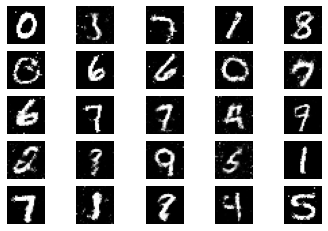

17201 [D loss: 0.643759, acc.: 61.72%] [G loss: 0.876584]
17202 [D loss: 0.656845, acc.: 60.16%] [G loss: 0.907077]
17203 [D loss: 0.652646, acc.: 61.72%] [G loss: 0.888705]
17204 [D loss: 0.681434, acc.: 53.91%] [G loss: 0.893083]
17205 [D loss: 0.644832, acc.: 61.72%] [G loss: 0.867577]
17206 [D loss: 0.645834, acc.: 63.28%] [G loss: 0.898585]
17207 [D loss: 0.674466, acc.: 57.81%] [G loss: 0.954013]
17208 [D loss: 0.706235, acc.: 50.78%] [G loss: 0.846893]
17209 [D loss: 0.659374, acc.: 63.28%] [G loss: 0.874539]
17210 [D loss: 0.650444, acc.: 66.41%] [G loss: 0.976538]
17211 [D loss: 0.677485, acc.: 57.81%] [G loss: 0.941011]
17212 [D loss: 0.656352, acc.: 60.94%] [G loss: 0.965303]
17213 [D loss: 0.636576, acc.: 57.03%] [G loss: 0.887612]
17214 [D loss: 0.639274, acc.: 59.38%] [G loss: 0.825958]
17215 [D loss: 0.662512, acc.: 58.59%] [G loss: 0.888811]
17216 [D loss: 0.624866, acc.: 68.75%] [G loss: 0.885762]
17217 [D loss: 0.648066, acc.: 64.06%] [G loss: 0.893008]
17218 [D loss:

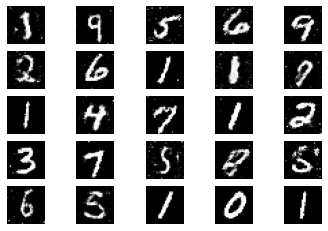

17301 [D loss: 0.615186, acc.: 67.19%] [G loss: 0.961394]
17302 [D loss: 0.718006, acc.: 54.69%] [G loss: 0.878792]
17303 [D loss: 0.698917, acc.: 56.25%] [G loss: 0.869271]
17304 [D loss: 0.640665, acc.: 61.72%] [G loss: 0.899454]
17305 [D loss: 0.665116, acc.: 55.47%] [G loss: 0.868260]
17306 [D loss: 0.648405, acc.: 60.16%] [G loss: 0.930924]
17307 [D loss: 0.662758, acc.: 60.94%] [G loss: 0.900069]
17308 [D loss: 0.618132, acc.: 63.28%] [G loss: 0.946965]
17309 [D loss: 0.678973, acc.: 58.59%] [G loss: 0.889461]
17310 [D loss: 0.662697, acc.: 60.16%] [G loss: 0.876927]
17311 [D loss: 0.655295, acc.: 58.59%] [G loss: 0.906640]
17312 [D loss: 0.635286, acc.: 63.28%] [G loss: 0.871581]
17313 [D loss: 0.707908, acc.: 52.34%] [G loss: 0.870261]
17314 [D loss: 0.660278, acc.: 60.94%] [G loss: 0.891773]
17315 [D loss: 0.657590, acc.: 58.59%] [G loss: 0.911207]
17316 [D loss: 0.676746, acc.: 52.34%] [G loss: 0.927210]
17317 [D loss: 0.681492, acc.: 54.69%] [G loss: 0.897816]
17318 [D loss:

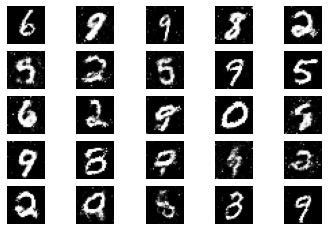

17401 [D loss: 0.660061, acc.: 57.03%] [G loss: 0.884639]
17402 [D loss: 0.659373, acc.: 58.59%] [G loss: 0.977124]
17403 [D loss: 0.619554, acc.: 64.84%] [G loss: 0.878322]
17404 [D loss: 0.679459, acc.: 53.91%] [G loss: 0.892675]
17405 [D loss: 0.662744, acc.: 57.03%] [G loss: 0.827838]
17406 [D loss: 0.688927, acc.: 53.91%] [G loss: 0.874272]
17407 [D loss: 0.674616, acc.: 60.16%] [G loss: 0.880425]
17408 [D loss: 0.700073, acc.: 52.34%] [G loss: 0.930857]
17409 [D loss: 0.629019, acc.: 64.06%] [G loss: 0.926375]
17410 [D loss: 0.641739, acc.: 60.94%] [G loss: 0.911753]
17411 [D loss: 0.644334, acc.: 59.38%] [G loss: 0.899482]
17412 [D loss: 0.669894, acc.: 59.38%] [G loss: 0.963190]
17413 [D loss: 0.663048, acc.: 59.38%] [G loss: 0.905178]
17414 [D loss: 0.681198, acc.: 53.12%] [G loss: 0.886657]
17415 [D loss: 0.715402, acc.: 53.12%] [G loss: 0.985175]
17416 [D loss: 0.634736, acc.: 60.94%] [G loss: 0.951084]
17417 [D loss: 0.661323, acc.: 58.59%] [G loss: 0.841821]
17418 [D loss:

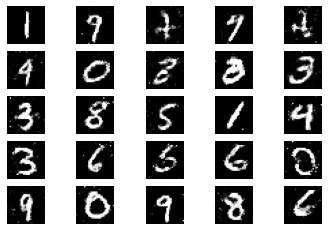

17501 [D loss: 0.688853, acc.: 61.72%] [G loss: 0.827868]
17502 [D loss: 0.681786, acc.: 57.81%] [G loss: 0.869955]
17503 [D loss: 0.678881, acc.: 56.25%] [G loss: 0.900483]
17504 [D loss: 0.630872, acc.: 61.72%] [G loss: 0.903456]
17505 [D loss: 0.669964, acc.: 57.03%] [G loss: 0.892711]
17506 [D loss: 0.659023, acc.: 57.81%] [G loss: 0.855547]
17507 [D loss: 0.676490, acc.: 59.38%] [G loss: 0.888420]
17508 [D loss: 0.643949, acc.: 60.94%] [G loss: 0.907446]
17509 [D loss: 0.673657, acc.: 58.59%] [G loss: 0.885389]
17510 [D loss: 0.654207, acc.: 60.16%] [G loss: 0.864402]
17511 [D loss: 0.624981, acc.: 65.62%] [G loss: 0.868251]
17512 [D loss: 0.694253, acc.: 53.12%] [G loss: 0.875256]
17513 [D loss: 0.655127, acc.: 60.16%] [G loss: 0.855706]
17514 [D loss: 0.664474, acc.: 57.81%] [G loss: 0.963675]
17515 [D loss: 0.632786, acc.: 60.94%] [G loss: 0.900254]
17516 [D loss: 0.661823, acc.: 60.16%] [G loss: 0.891553]
17517 [D loss: 0.632593, acc.: 66.41%] [G loss: 0.943561]
17518 [D loss:

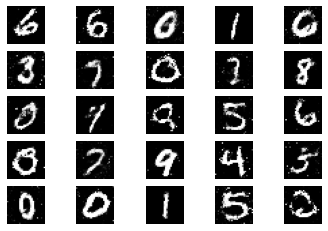

17601 [D loss: 0.663591, acc.: 60.94%] [G loss: 0.885609]
17602 [D loss: 0.671720, acc.: 57.81%] [G loss: 0.877456]
17603 [D loss: 0.642700, acc.: 64.06%] [G loss: 0.866730]
17604 [D loss: 0.708844, acc.: 53.12%] [G loss: 0.893491]
17605 [D loss: 0.697129, acc.: 53.12%] [G loss: 0.908115]
17606 [D loss: 0.652879, acc.: 61.72%] [G loss: 0.934416]
17607 [D loss: 0.669049, acc.: 59.38%] [G loss: 0.856308]
17608 [D loss: 0.681281, acc.: 60.94%] [G loss: 0.883064]
17609 [D loss: 0.644502, acc.: 67.19%] [G loss: 0.891157]
17610 [D loss: 0.667678, acc.: 55.47%] [G loss: 0.919561]
17611 [D loss: 0.672715, acc.: 58.59%] [G loss: 0.874367]
17612 [D loss: 0.662092, acc.: 59.38%] [G loss: 0.886640]
17613 [D loss: 0.630771, acc.: 64.06%] [G loss: 0.832447]
17614 [D loss: 0.638462, acc.: 64.06%] [G loss: 0.855274]
17615 [D loss: 0.699401, acc.: 57.03%] [G loss: 0.845500]
17616 [D loss: 0.693213, acc.: 57.81%] [G loss: 0.838055]
17617 [D loss: 0.674403, acc.: 54.69%] [G loss: 0.933596]
17618 [D loss:

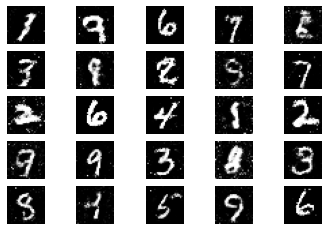

17701 [D loss: 0.645293, acc.: 61.72%] [G loss: 0.926424]
17702 [D loss: 0.668198, acc.: 55.47%] [G loss: 0.910554]
17703 [D loss: 0.627760, acc.: 66.41%] [G loss: 0.938821]
17704 [D loss: 0.640960, acc.: 65.62%] [G loss: 0.894088]
17705 [D loss: 0.649226, acc.: 60.16%] [G loss: 0.918240]
17706 [D loss: 0.644838, acc.: 62.50%] [G loss: 0.865129]
17707 [D loss: 0.695574, acc.: 55.47%] [G loss: 0.878663]
17708 [D loss: 0.640287, acc.: 61.72%] [G loss: 0.864889]
17709 [D loss: 0.641749, acc.: 61.72%] [G loss: 0.895396]
17710 [D loss: 0.687574, acc.: 55.47%] [G loss: 0.879080]
17711 [D loss: 0.667323, acc.: 57.03%] [G loss: 0.880901]
17712 [D loss: 0.633752, acc.: 65.62%] [G loss: 0.889770]
17713 [D loss: 0.625193, acc.: 64.06%] [G loss: 0.908485]
17714 [D loss: 0.651339, acc.: 60.94%] [G loss: 0.933580]
17715 [D loss: 0.625067, acc.: 67.19%] [G loss: 0.865945]
17716 [D loss: 0.706436, acc.: 59.38%] [G loss: 0.914178]
17717 [D loss: 0.699576, acc.: 53.12%] [G loss: 0.867788]
17718 [D loss:

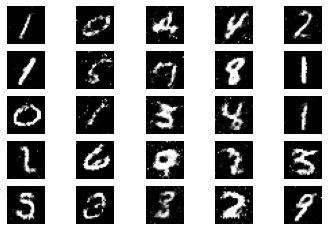

17801 [D loss: 0.639910, acc.: 63.28%] [G loss: 0.945200]
17802 [D loss: 0.629445, acc.: 65.62%] [G loss: 0.921267]
17803 [D loss: 0.643405, acc.: 60.16%] [G loss: 0.932988]
17804 [D loss: 0.691014, acc.: 52.34%] [G loss: 0.920374]
17805 [D loss: 0.650888, acc.: 65.62%] [G loss: 0.889301]
17806 [D loss: 0.625147, acc.: 68.75%] [G loss: 0.903865]
17807 [D loss: 0.630300, acc.: 62.50%] [G loss: 0.852598]
17808 [D loss: 0.646460, acc.: 63.28%] [G loss: 0.867254]
17809 [D loss: 0.685323, acc.: 57.81%] [G loss: 0.825956]
17810 [D loss: 0.644292, acc.: 61.72%] [G loss: 0.941866]
17811 [D loss: 0.681249, acc.: 61.72%] [G loss: 0.880885]
17812 [D loss: 0.697438, acc.: 51.56%] [G loss: 0.884173]
17813 [D loss: 0.626428, acc.: 67.19%] [G loss: 0.889248]
17814 [D loss: 0.667031, acc.: 59.38%] [G loss: 0.896920]
17815 [D loss: 0.678783, acc.: 59.38%] [G loss: 0.921588]
17816 [D loss: 0.635258, acc.: 64.06%] [G loss: 0.896483]
17817 [D loss: 0.696477, acc.: 54.69%] [G loss: 0.892212]
17818 [D loss:

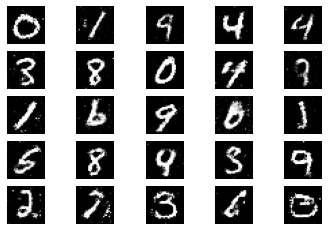

17901 [D loss: 0.661233, acc.: 59.38%] [G loss: 0.862730]
17902 [D loss: 0.636849, acc.: 57.81%] [G loss: 0.943370]
17903 [D loss: 0.599883, acc.: 68.75%] [G loss: 0.903415]
17904 [D loss: 0.662702, acc.: 60.94%] [G loss: 0.891312]
17905 [D loss: 0.714710, acc.: 47.66%] [G loss: 0.938879]
17906 [D loss: 0.626641, acc.: 60.94%] [G loss: 0.963904]
17907 [D loss: 0.701085, acc.: 52.34%] [G loss: 0.877783]
17908 [D loss: 0.667478, acc.: 57.81%] [G loss: 0.954664]
17909 [D loss: 0.661006, acc.: 55.47%] [G loss: 0.930083]
17910 [D loss: 0.608813, acc.: 70.31%] [G loss: 0.881360]
17911 [D loss: 0.650538, acc.: 60.94%] [G loss: 0.979689]
17912 [D loss: 0.683975, acc.: 57.03%] [G loss: 0.962322]
17913 [D loss: 0.654936, acc.: 61.72%] [G loss: 0.852343]
17914 [D loss: 0.698858, acc.: 52.34%] [G loss: 0.851029]
17915 [D loss: 0.669386, acc.: 58.59%] [G loss: 0.876295]
17916 [D loss: 0.688450, acc.: 52.34%] [G loss: 0.889023]
17917 [D loss: 0.629129, acc.: 71.09%] [G loss: 0.861609]
17918 [D loss:

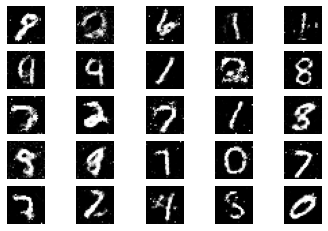

18001 [D loss: 0.645062, acc.: 63.28%] [G loss: 0.896255]
18002 [D loss: 0.651559, acc.: 65.62%] [G loss: 0.917490]
18003 [D loss: 0.648199, acc.: 60.94%] [G loss: 0.913931]
18004 [D loss: 0.661414, acc.: 55.47%] [G loss: 0.877484]
18005 [D loss: 0.673729, acc.: 59.38%] [G loss: 0.867443]
18006 [D loss: 0.620870, acc.: 66.41%] [G loss: 0.851368]
18007 [D loss: 0.635276, acc.: 67.19%] [G loss: 0.921001]
18008 [D loss: 0.616587, acc.: 65.62%] [G loss: 0.976330]
18009 [D loss: 0.697181, acc.: 54.69%] [G loss: 0.896755]
18010 [D loss: 0.646551, acc.: 63.28%] [G loss: 0.850609]
18011 [D loss: 0.633687, acc.: 65.62%] [G loss: 0.905291]
18012 [D loss: 0.651465, acc.: 61.72%] [G loss: 0.920026]
18013 [D loss: 0.702517, acc.: 46.88%] [G loss: 0.932124]
18014 [D loss: 0.646029, acc.: 63.28%] [G loss: 0.901296]
18015 [D loss: 0.684492, acc.: 59.38%] [G loss: 0.897380]
18016 [D loss: 0.652470, acc.: 64.06%] [G loss: 0.897976]
18017 [D loss: 0.636198, acc.: 62.50%] [G loss: 0.915897]
18018 [D loss:

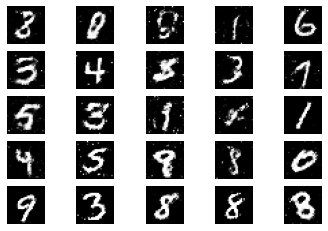

18101 [D loss: 0.661290, acc.: 60.16%] [G loss: 0.901084]
18102 [D loss: 0.658551, acc.: 61.72%] [G loss: 0.907174]
18103 [D loss: 0.652107, acc.: 60.16%] [G loss: 0.909351]
18104 [D loss: 0.626302, acc.: 64.84%] [G loss: 0.876385]
18105 [D loss: 0.622583, acc.: 64.84%] [G loss: 0.921817]
18106 [D loss: 0.669366, acc.: 59.38%] [G loss: 0.956911]
18107 [D loss: 0.653523, acc.: 59.38%] [G loss: 0.867276]
18108 [D loss: 0.669532, acc.: 56.25%] [G loss: 0.922540]
18109 [D loss: 0.638571, acc.: 61.72%] [G loss: 0.957339]
18110 [D loss: 0.617128, acc.: 64.84%] [G loss: 0.918521]
18111 [D loss: 0.646404, acc.: 63.28%] [G loss: 0.896783]
18112 [D loss: 0.609491, acc.: 65.62%] [G loss: 0.955869]
18113 [D loss: 0.704299, acc.: 54.69%] [G loss: 0.911587]
18114 [D loss: 0.676274, acc.: 57.81%] [G loss: 0.891697]
18115 [D loss: 0.647528, acc.: 63.28%] [G loss: 0.867507]
18116 [D loss: 0.678775, acc.: 53.12%] [G loss: 0.823833]
18117 [D loss: 0.677453, acc.: 61.72%] [G loss: 0.889142]
18118 [D loss:

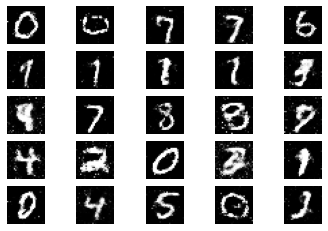

18201 [D loss: 0.617298, acc.: 65.62%] [G loss: 0.908131]
18202 [D loss: 0.628468, acc.: 65.62%] [G loss: 0.901562]
18203 [D loss: 0.673518, acc.: 58.59%] [G loss: 0.972703]
18204 [D loss: 0.681043, acc.: 63.28%] [G loss: 0.935834]
18205 [D loss: 0.634125, acc.: 64.06%] [G loss: 0.929822]
18206 [D loss: 0.718697, acc.: 48.44%] [G loss: 0.910056]
18207 [D loss: 0.639804, acc.: 58.59%] [G loss: 0.884972]
18208 [D loss: 0.630355, acc.: 62.50%] [G loss: 0.935158]
18209 [D loss: 0.679747, acc.: 59.38%] [G loss: 0.959663]
18210 [D loss: 0.671262, acc.: 60.16%] [G loss: 0.888578]
18211 [D loss: 0.666631, acc.: 60.94%] [G loss: 0.963424]
18212 [D loss: 0.655479, acc.: 56.25%] [G loss: 0.887830]
18213 [D loss: 0.650030, acc.: 59.38%] [G loss: 0.987639]
18214 [D loss: 0.647850, acc.: 65.62%] [G loss: 0.930305]
18215 [D loss: 0.623362, acc.: 65.62%] [G loss: 0.952449]
18216 [D loss: 0.654096, acc.: 58.59%] [G loss: 0.904027]
18217 [D loss: 0.699541, acc.: 56.25%] [G loss: 0.965163]
18218 [D loss:

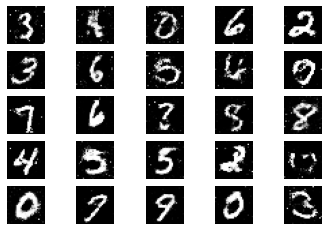

18301 [D loss: 0.666367, acc.: 62.50%] [G loss: 0.963633]
18302 [D loss: 0.646308, acc.: 63.28%] [G loss: 0.967930]
18303 [D loss: 0.682707, acc.: 59.38%] [G loss: 0.894640]
18304 [D loss: 0.665725, acc.: 56.25%] [G loss: 0.909114]
18305 [D loss: 0.647432, acc.: 61.72%] [G loss: 0.881377]
18306 [D loss: 0.678969, acc.: 54.69%] [G loss: 0.913402]
18307 [D loss: 0.624273, acc.: 60.94%] [G loss: 0.914029]
18308 [D loss: 0.657586, acc.: 58.59%] [G loss: 0.871743]
18309 [D loss: 0.637925, acc.: 62.50%] [G loss: 0.930941]
18310 [D loss: 0.651864, acc.: 60.94%] [G loss: 0.984415]
18311 [D loss: 0.680769, acc.: 59.38%] [G loss: 0.891288]
18312 [D loss: 0.655394, acc.: 62.50%] [G loss: 0.914707]
18313 [D loss: 0.684064, acc.: 60.16%] [G loss: 0.873102]
18314 [D loss: 0.592164, acc.: 74.22%] [G loss: 0.887469]
18315 [D loss: 0.679304, acc.: 57.03%] [G loss: 0.952758]
18316 [D loss: 0.627716, acc.: 66.41%] [G loss: 0.963161]
18317 [D loss: 0.658759, acc.: 57.03%] [G loss: 0.903253]
18318 [D loss:

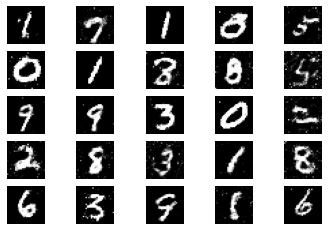

18401 [D loss: 0.647937, acc.: 67.19%] [G loss: 0.899975]
18402 [D loss: 0.699644, acc.: 58.59%] [G loss: 0.877852]
18403 [D loss: 0.686925, acc.: 56.25%] [G loss: 0.926407]
18404 [D loss: 0.653322, acc.: 64.06%] [G loss: 0.871946]
18405 [D loss: 0.670900, acc.: 57.03%] [G loss: 0.899506]
18406 [D loss: 0.659448, acc.: 62.50%] [G loss: 0.936462]
18407 [D loss: 0.614562, acc.: 67.19%] [G loss: 0.941851]
18408 [D loss: 0.641767, acc.: 66.41%] [G loss: 1.043453]
18409 [D loss: 0.697126, acc.: 60.94%] [G loss: 0.884311]
18410 [D loss: 0.645334, acc.: 63.28%] [G loss: 0.878542]
18411 [D loss: 0.712445, acc.: 50.00%] [G loss: 0.873158]
18412 [D loss: 0.716240, acc.: 51.56%] [G loss: 0.892063]
18413 [D loss: 0.696908, acc.: 54.69%] [G loss: 0.925892]
18414 [D loss: 0.642528, acc.: 64.84%] [G loss: 0.920055]
18415 [D loss: 0.673468, acc.: 56.25%] [G loss: 0.868640]
18416 [D loss: 0.706898, acc.: 57.81%] [G loss: 0.909325]
18417 [D loss: 0.631588, acc.: 63.28%] [G loss: 0.898153]
18418 [D loss:

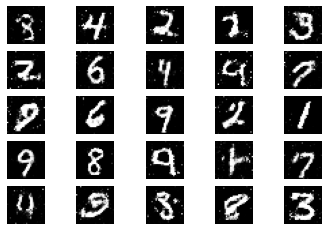

18501 [D loss: 0.630864, acc.: 65.62%] [G loss: 0.878502]
18502 [D loss: 0.646258, acc.: 65.62%] [G loss: 0.896280]
18503 [D loss: 0.697313, acc.: 57.03%] [G loss: 0.859650]
18504 [D loss: 0.658439, acc.: 66.41%] [G loss: 0.932620]
18505 [D loss: 0.719709, acc.: 45.31%] [G loss: 0.903907]
18506 [D loss: 0.605291, acc.: 67.97%] [G loss: 0.979778]
18507 [D loss: 0.661748, acc.: 58.59%] [G loss: 0.886535]
18508 [D loss: 0.639785, acc.: 59.38%] [G loss: 0.929860]
18509 [D loss: 0.650916, acc.: 59.38%] [G loss: 0.885299]
18510 [D loss: 0.676069, acc.: 57.03%] [G loss: 0.906426]
18511 [D loss: 0.665422, acc.: 60.16%] [G loss: 0.904782]
18512 [D loss: 0.677330, acc.: 54.69%] [G loss: 0.913978]
18513 [D loss: 0.686725, acc.: 54.69%] [G loss: 0.932364]
18514 [D loss: 0.654797, acc.: 60.16%] [G loss: 0.943232]
18515 [D loss: 0.685592, acc.: 57.03%] [G loss: 0.918709]
18516 [D loss: 0.643399, acc.: 63.28%] [G loss: 0.869252]
18517 [D loss: 0.672205, acc.: 56.25%] [G loss: 0.888273]
18518 [D loss:

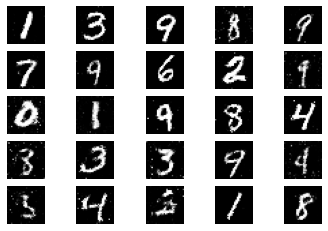

18601 [D loss: 0.606167, acc.: 65.62%] [G loss: 0.888659]
18602 [D loss: 0.673950, acc.: 58.59%] [G loss: 0.910516]
18603 [D loss: 0.670174, acc.: 58.59%] [G loss: 0.862724]
18604 [D loss: 0.639663, acc.: 64.06%] [G loss: 0.842412]
18605 [D loss: 0.645322, acc.: 60.16%] [G loss: 0.835141]
18606 [D loss: 0.628633, acc.: 65.62%] [G loss: 0.832458]
18607 [D loss: 0.653481, acc.: 57.03%] [G loss: 0.924711]
18608 [D loss: 0.596539, acc.: 71.88%] [G loss: 0.942840]
18609 [D loss: 0.688705, acc.: 59.38%] [G loss: 0.903217]
18610 [D loss: 0.655224, acc.: 60.16%] [G loss: 0.940727]
18611 [D loss: 0.676042, acc.: 61.72%] [G loss: 0.918265]
18612 [D loss: 0.663283, acc.: 60.94%] [G loss: 0.926420]
18613 [D loss: 0.606922, acc.: 71.09%] [G loss: 0.858916]
18614 [D loss: 0.745854, acc.: 50.78%] [G loss: 0.881808]
18615 [D loss: 0.651580, acc.: 60.16%] [G loss: 0.843558]
18616 [D loss: 0.653208, acc.: 59.38%] [G loss: 0.883100]
18617 [D loss: 0.654236, acc.: 56.25%] [G loss: 0.876369]
18618 [D loss:

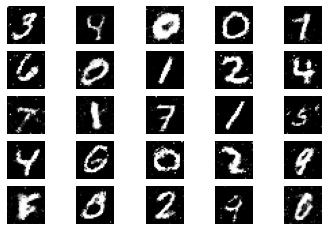

18701 [D loss: 0.645026, acc.: 62.50%] [G loss: 0.884546]
18702 [D loss: 0.673036, acc.: 58.59%] [G loss: 0.946921]
18703 [D loss: 0.647369, acc.: 64.84%] [G loss: 0.902817]
18704 [D loss: 0.664095, acc.: 60.16%] [G loss: 0.907193]
18705 [D loss: 0.666118, acc.: 57.81%] [G loss: 0.920971]
18706 [D loss: 0.635904, acc.: 64.06%] [G loss: 0.880264]
18707 [D loss: 0.659254, acc.: 65.62%] [G loss: 0.893435]
18708 [D loss: 0.684867, acc.: 62.50%] [G loss: 0.926255]
18709 [D loss: 0.632926, acc.: 64.84%] [G loss: 0.925179]
18710 [D loss: 0.658623, acc.: 61.72%] [G loss: 0.914267]
18711 [D loss: 0.677105, acc.: 54.69%] [G loss: 0.922213]
18712 [D loss: 0.677876, acc.: 54.69%] [G loss: 0.883393]
18713 [D loss: 0.661221, acc.: 62.50%] [G loss: 0.895590]
18714 [D loss: 0.643943, acc.: 66.41%] [G loss: 0.911136]
18715 [D loss: 0.646544, acc.: 59.38%] [G loss: 0.953639]
18716 [D loss: 0.641743, acc.: 59.38%] [G loss: 0.940760]
18717 [D loss: 0.698361, acc.: 60.16%] [G loss: 0.909267]
18718 [D loss:

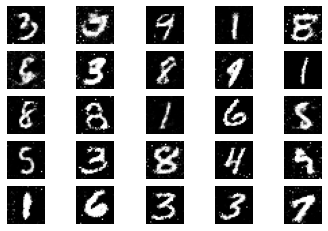

18801 [D loss: 0.692240, acc.: 53.12%] [G loss: 0.859821]
18802 [D loss: 0.690332, acc.: 57.03%] [G loss: 0.898476]
18803 [D loss: 0.654431, acc.: 63.28%] [G loss: 0.903887]
18804 [D loss: 0.678849, acc.: 57.81%] [G loss: 0.897804]
18805 [D loss: 0.656136, acc.: 61.72%] [G loss: 0.915430]
18806 [D loss: 0.662834, acc.: 61.72%] [G loss: 0.880693]
18807 [D loss: 0.624449, acc.: 69.53%] [G loss: 0.957352]
18808 [D loss: 0.636079, acc.: 66.41%] [G loss: 0.934480]
18809 [D loss: 0.655357, acc.: 61.72%] [G loss: 0.909468]
18810 [D loss: 0.648606, acc.: 58.59%] [G loss: 0.891798]
18811 [D loss: 0.645128, acc.: 63.28%] [G loss: 0.877968]
18812 [D loss: 0.628564, acc.: 64.06%] [G loss: 0.909148]
18813 [D loss: 0.743446, acc.: 50.00%] [G loss: 0.906078]
18814 [D loss: 0.622148, acc.: 68.75%] [G loss: 0.941891]
18815 [D loss: 0.685400, acc.: 53.12%] [G loss: 0.906021]
18816 [D loss: 0.676440, acc.: 55.47%] [G loss: 0.886638]
18817 [D loss: 0.661939, acc.: 59.38%] [G loss: 0.914109]
18818 [D loss:

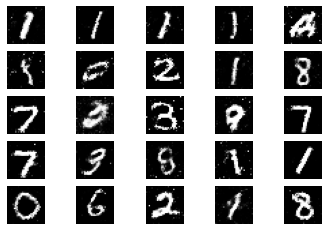

18901 [D loss: 0.668201, acc.: 56.25%] [G loss: 0.917145]
18902 [D loss: 0.670346, acc.: 57.03%] [G loss: 0.957600]
18903 [D loss: 0.686187, acc.: 50.00%] [G loss: 0.877348]
18904 [D loss: 0.678393, acc.: 52.34%] [G loss: 0.899529]
18905 [D loss: 0.662412, acc.: 57.81%] [G loss: 0.900160]
18906 [D loss: 0.655079, acc.: 60.16%] [G loss: 0.898736]
18907 [D loss: 0.627578, acc.: 64.06%] [G loss: 0.927991]
18908 [D loss: 0.634592, acc.: 63.28%] [G loss: 0.877270]
18909 [D loss: 0.690697, acc.: 52.34%] [G loss: 0.907968]
18910 [D loss: 0.629596, acc.: 67.97%] [G loss: 0.873581]
18911 [D loss: 0.678817, acc.: 57.03%] [G loss: 0.906265]
18912 [D loss: 0.656261, acc.: 60.16%] [G loss: 0.872311]
18913 [D loss: 0.650120, acc.: 60.94%] [G loss: 0.881730]
18914 [D loss: 0.638927, acc.: 64.06%] [G loss: 0.895430]
18915 [D loss: 0.650595, acc.: 65.62%] [G loss: 0.955223]
18916 [D loss: 0.672201, acc.: 59.38%] [G loss: 1.002489]
18917 [D loss: 0.648136, acc.: 59.38%] [G loss: 0.912208]
18918 [D loss:

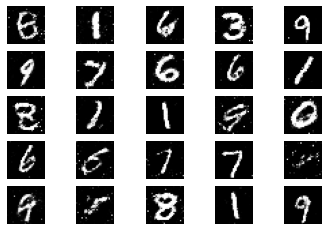

19001 [D loss: 0.682742, acc.: 57.81%] [G loss: 0.886798]
19002 [D loss: 0.676300, acc.: 58.59%] [G loss: 0.841963]
19003 [D loss: 0.625482, acc.: 66.41%] [G loss: 0.840797]
19004 [D loss: 0.664526, acc.: 60.16%] [G loss: 0.906787]
19005 [D loss: 0.646250, acc.: 67.19%] [G loss: 0.840251]
19006 [D loss: 0.657901, acc.: 57.81%] [G loss: 0.900262]
19007 [D loss: 0.659241, acc.: 62.50%] [G loss: 0.859850]
19008 [D loss: 0.653340, acc.: 57.03%] [G loss: 0.909413]
19009 [D loss: 0.631503, acc.: 60.94%] [G loss: 0.901635]
19010 [D loss: 0.692385, acc.: 55.47%] [G loss: 0.826114]
19011 [D loss: 0.636351, acc.: 67.97%] [G loss: 0.944644]
19012 [D loss: 0.648946, acc.: 60.16%] [G loss: 0.882475]
19013 [D loss: 0.681699, acc.: 60.16%] [G loss: 0.885721]
19014 [D loss: 0.664422, acc.: 59.38%] [G loss: 0.956204]
19015 [D loss: 0.657933, acc.: 57.03%] [G loss: 0.880849]
19016 [D loss: 0.666852, acc.: 60.94%] [G loss: 0.893125]
19017 [D loss: 0.648519, acc.: 60.16%] [G loss: 0.860319]
19018 [D loss:

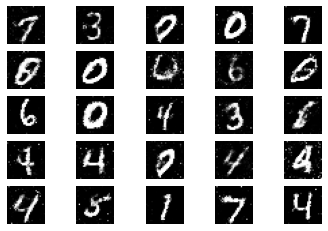

19101 [D loss: 0.698791, acc.: 55.47%] [G loss: 0.899133]
19102 [D loss: 0.634338, acc.: 60.94%] [G loss: 0.923583]
19103 [D loss: 0.640432, acc.: 67.97%] [G loss: 0.900254]
19104 [D loss: 0.596461, acc.: 70.31%] [G loss: 0.946225]
19105 [D loss: 0.641565, acc.: 62.50%] [G loss: 0.907839]
19106 [D loss: 0.662175, acc.: 57.81%] [G loss: 0.862454]
19107 [D loss: 0.706965, acc.: 46.88%] [G loss: 0.828934]
19108 [D loss: 0.653050, acc.: 60.94%] [G loss: 0.843882]
19109 [D loss: 0.639063, acc.: 57.81%] [G loss: 0.804762]
19110 [D loss: 0.618865, acc.: 65.62%] [G loss: 0.913035]
19111 [D loss: 0.627303, acc.: 64.06%] [G loss: 0.913463]
19112 [D loss: 0.640098, acc.: 61.72%] [G loss: 0.937069]
19113 [D loss: 0.664939, acc.: 53.91%] [G loss: 0.862807]
19114 [D loss: 0.688430, acc.: 57.81%] [G loss: 0.881555]
19115 [D loss: 0.663571, acc.: 62.50%] [G loss: 0.918280]
19116 [D loss: 0.680903, acc.: 54.69%] [G loss: 0.946912]
19117 [D loss: 0.689531, acc.: 57.03%] [G loss: 0.924931]
19118 [D loss:

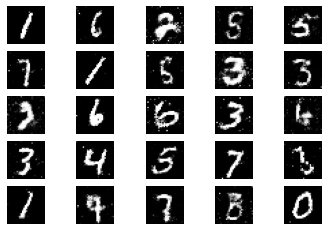

19201 [D loss: 0.611307, acc.: 67.97%] [G loss: 0.858730]
19202 [D loss: 0.657172, acc.: 59.38%] [G loss: 0.920283]
19203 [D loss: 0.671525, acc.: 62.50%] [G loss: 0.935670]
19204 [D loss: 0.668905, acc.: 60.16%] [G loss: 0.940444]
19205 [D loss: 0.647171, acc.: 62.50%] [G loss: 0.931745]
19206 [D loss: 0.619460, acc.: 64.06%] [G loss: 0.897932]
19207 [D loss: 0.657390, acc.: 63.28%] [G loss: 0.903543]
19208 [D loss: 0.662041, acc.: 63.28%] [G loss: 0.851684]
19209 [D loss: 0.622207, acc.: 64.84%] [G loss: 0.871897]
19210 [D loss: 0.650149, acc.: 57.81%] [G loss: 0.823371]
19211 [D loss: 0.677934, acc.: 53.91%] [G loss: 0.870957]
19212 [D loss: 0.642617, acc.: 64.84%] [G loss: 0.928963]
19213 [D loss: 0.669590, acc.: 57.81%] [G loss: 0.917132]
19214 [D loss: 0.604333, acc.: 67.19%] [G loss: 0.949341]
19215 [D loss: 0.659845, acc.: 60.16%] [G loss: 0.890316]
19216 [D loss: 0.635060, acc.: 64.06%] [G loss: 0.866410]
19217 [D loss: 0.634863, acc.: 61.72%] [G loss: 0.908903]
19218 [D loss:

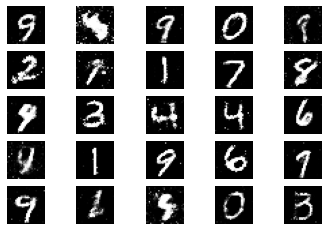

19301 [D loss: 0.684662, acc.: 57.03%] [G loss: 0.892151]
19302 [D loss: 0.699245, acc.: 49.22%] [G loss: 0.903241]
19303 [D loss: 0.616127, acc.: 66.41%] [G loss: 0.909686]
19304 [D loss: 0.681637, acc.: 61.72%] [G loss: 0.847834]
19305 [D loss: 0.658324, acc.: 60.94%] [G loss: 0.790160]
19306 [D loss: 0.672498, acc.: 56.25%] [G loss: 0.848893]
19307 [D loss: 0.615526, acc.: 70.31%] [G loss: 0.914535]
19308 [D loss: 0.649166, acc.: 56.25%] [G loss: 0.862189]
19309 [D loss: 0.664052, acc.: 59.38%] [G loss: 0.874156]
19310 [D loss: 0.668658, acc.: 61.72%] [G loss: 0.878094]
19311 [D loss: 0.654112, acc.: 60.94%] [G loss: 0.945738]
19312 [D loss: 0.616727, acc.: 64.84%] [G loss: 0.899472]
19313 [D loss: 0.641433, acc.: 64.06%] [G loss: 0.924695]
19314 [D loss: 0.657770, acc.: 62.50%] [G loss: 0.960864]
19315 [D loss: 0.668256, acc.: 53.91%] [G loss: 0.939459]
19316 [D loss: 0.669551, acc.: 54.69%] [G loss: 0.934266]
19317 [D loss: 0.627497, acc.: 61.72%] [G loss: 0.986905]
19318 [D loss:

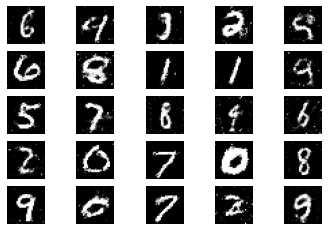

19401 [D loss: 0.665460, acc.: 57.81%] [G loss: 0.954287]
19402 [D loss: 0.670074, acc.: 56.25%] [G loss: 0.925956]
19403 [D loss: 0.629635, acc.: 64.84%] [G loss: 0.911153]
19404 [D loss: 0.633867, acc.: 61.72%] [G loss: 0.928324]
19405 [D loss: 0.666980, acc.: 59.38%] [G loss: 0.944924]
19406 [D loss: 0.648066, acc.: 56.25%] [G loss: 0.930131]
19407 [D loss: 0.662520, acc.: 58.59%] [G loss: 0.980726]
19408 [D loss: 0.668259, acc.: 57.03%] [G loss: 0.874599]
19409 [D loss: 0.683851, acc.: 60.94%] [G loss: 0.911885]
19410 [D loss: 0.665148, acc.: 57.81%] [G loss: 0.918475]
19411 [D loss: 0.677466, acc.: 57.81%] [G loss: 0.852950]
19412 [D loss: 0.695794, acc.: 56.25%] [G loss: 0.906750]
19413 [D loss: 0.652537, acc.: 62.50%] [G loss: 0.930496]
19414 [D loss: 0.643460, acc.: 61.72%] [G loss: 0.929252]
19415 [D loss: 0.646333, acc.: 62.50%] [G loss: 0.916991]
19416 [D loss: 0.696491, acc.: 53.12%] [G loss: 0.830882]
19417 [D loss: 0.678249, acc.: 53.91%] [G loss: 0.938160]
19418 [D loss:

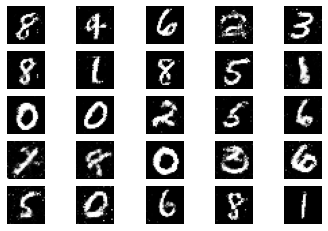

19501 [D loss: 0.663034, acc.: 58.59%] [G loss: 0.938758]
19502 [D loss: 0.717009, acc.: 50.00%] [G loss: 0.909637]
19503 [D loss: 0.602847, acc.: 72.66%] [G loss: 0.887116]
19504 [D loss: 0.669681, acc.: 56.25%] [G loss: 0.854738]
19505 [D loss: 0.644299, acc.: 65.62%] [G loss: 1.014624]
19506 [D loss: 0.681678, acc.: 52.34%] [G loss: 0.846878]
19507 [D loss: 0.635837, acc.: 60.16%] [G loss: 0.873944]
19508 [D loss: 0.711791, acc.: 52.34%] [G loss: 0.899465]
19509 [D loss: 0.629321, acc.: 65.62%] [G loss: 0.840170]
19510 [D loss: 0.689566, acc.: 56.25%] [G loss: 0.848014]
19511 [D loss: 0.631472, acc.: 64.06%] [G loss: 0.848809]
19512 [D loss: 0.684534, acc.: 61.72%] [G loss: 0.835472]
19513 [D loss: 0.672908, acc.: 59.38%] [G loss: 0.917688]
19514 [D loss: 0.687471, acc.: 54.69%] [G loss: 0.922520]
19515 [D loss: 0.616021, acc.: 67.97%] [G loss: 0.900079]
19516 [D loss: 0.673732, acc.: 58.59%] [G loss: 0.950598]
19517 [D loss: 0.649976, acc.: 61.72%] [G loss: 0.889521]
19518 [D loss:

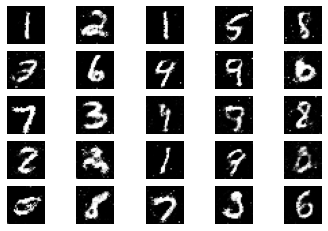

19601 [D loss: 0.740744, acc.: 42.97%] [G loss: 0.873901]
19602 [D loss: 0.596806, acc.: 67.97%] [G loss: 0.904840]
19603 [D loss: 0.640738, acc.: 60.94%] [G loss: 0.914270]
19604 [D loss: 0.644201, acc.: 62.50%] [G loss: 0.865830]
19605 [D loss: 0.662057, acc.: 62.50%] [G loss: 0.913506]
19606 [D loss: 0.670739, acc.: 60.16%] [G loss: 0.868511]
19607 [D loss: 0.625190, acc.: 67.97%] [G loss: 0.927153]
19608 [D loss: 0.623087, acc.: 71.09%] [G loss: 0.889130]
19609 [D loss: 0.671202, acc.: 57.81%] [G loss: 0.927418]
19610 [D loss: 0.659356, acc.: 57.81%] [G loss: 0.928362]
19611 [D loss: 0.684659, acc.: 55.47%] [G loss: 0.913826]
19612 [D loss: 0.611513, acc.: 69.53%] [G loss: 0.884380]
19613 [D loss: 0.677015, acc.: 54.69%] [G loss: 0.882984]
19614 [D loss: 0.638488, acc.: 64.84%] [G loss: 0.842994]
19615 [D loss: 0.681317, acc.: 57.03%] [G loss: 0.839224]
19616 [D loss: 0.641762, acc.: 65.62%] [G loss: 0.877447]
19617 [D loss: 0.669805, acc.: 62.50%] [G loss: 0.840760]
19618 [D loss:

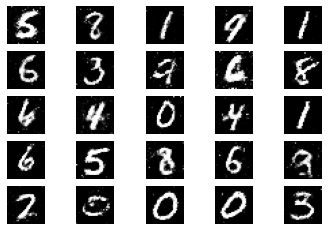

19701 [D loss: 0.673009, acc.: 55.47%] [G loss: 0.852023]
19702 [D loss: 0.708122, acc.: 50.00%] [G loss: 0.862033]
19703 [D loss: 0.630996, acc.: 60.94%] [G loss: 0.966286]
19704 [D loss: 0.636663, acc.: 63.28%] [G loss: 0.917119]
19705 [D loss: 0.656293, acc.: 61.72%] [G loss: 0.936300]
19706 [D loss: 0.689986, acc.: 61.72%] [G loss: 0.874610]
19707 [D loss: 0.711910, acc.: 53.12%] [G loss: 0.845413]
19708 [D loss: 0.623958, acc.: 64.84%] [G loss: 0.851634]
19709 [D loss: 0.694036, acc.: 53.91%] [G loss: 0.906609]
19710 [D loss: 0.634314, acc.: 70.31%] [G loss: 0.922754]
19711 [D loss: 0.711095, acc.: 53.91%] [G loss: 0.885392]
19712 [D loss: 0.670464, acc.: 58.59%] [G loss: 0.903300]
19713 [D loss: 0.656012, acc.: 62.50%] [G loss: 0.934582]
19714 [D loss: 0.654957, acc.: 59.38%] [G loss: 0.868203]
19715 [D loss: 0.631850, acc.: 65.62%] [G loss: 0.894763]
19716 [D loss: 0.668486, acc.: 58.59%] [G loss: 0.914529]
19717 [D loss: 0.674590, acc.: 50.78%] [G loss: 0.942650]
19718 [D loss:

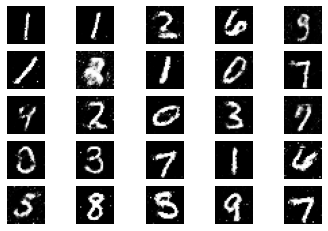

19801 [D loss: 0.663743, acc.: 57.81%] [G loss: 0.838530]
19802 [D loss: 0.642251, acc.: 64.06%] [G loss: 0.924012]
19803 [D loss: 0.638993, acc.: 61.72%] [G loss: 0.896319]
19804 [D loss: 0.674368, acc.: 55.47%] [G loss: 0.868296]
19805 [D loss: 0.666121, acc.: 62.50%] [G loss: 0.882080]
19806 [D loss: 0.634637, acc.: 67.19%] [G loss: 0.902815]
19807 [D loss: 0.654240, acc.: 58.59%] [G loss: 0.934456]
19808 [D loss: 0.659773, acc.: 56.25%] [G loss: 0.892130]
19809 [D loss: 0.652003, acc.: 63.28%] [G loss: 0.908034]
19810 [D loss: 0.663693, acc.: 60.16%] [G loss: 0.921122]
19811 [D loss: 0.641611, acc.: 62.50%] [G loss: 0.908272]
19812 [D loss: 0.652539, acc.: 54.69%] [G loss: 0.861675]
19813 [D loss: 0.628464, acc.: 64.84%] [G loss: 0.875281]
19814 [D loss: 0.666305, acc.: 56.25%] [G loss: 0.828925]
19815 [D loss: 0.688562, acc.: 57.81%] [G loss: 0.828694]
19816 [D loss: 0.678538, acc.: 54.69%] [G loss: 0.884491]
19817 [D loss: 0.692046, acc.: 55.47%] [G loss: 0.879119]
19818 [D loss:

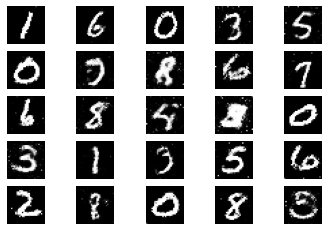

19901 [D loss: 0.687225, acc.: 57.81%] [G loss: 0.905134]
19902 [D loss: 0.670141, acc.: 57.81%] [G loss: 0.904862]
19903 [D loss: 0.646955, acc.: 63.28%] [G loss: 0.966955]
19904 [D loss: 0.644586, acc.: 61.72%] [G loss: 0.979396]
19905 [D loss: 0.632750, acc.: 66.41%] [G loss: 0.900960]
19906 [D loss: 0.637037, acc.: 62.50%] [G loss: 0.917196]
19907 [D loss: 0.660369, acc.: 59.38%] [G loss: 1.003569]
19908 [D loss: 0.656679, acc.: 59.38%] [G loss: 0.983552]
19909 [D loss: 0.659279, acc.: 56.25%] [G loss: 0.902785]
19910 [D loss: 0.657556, acc.: 60.16%] [G loss: 0.876434]
19911 [D loss: 0.708632, acc.: 57.03%] [G loss: 0.868157]
19912 [D loss: 0.622806, acc.: 67.97%] [G loss: 0.916945]
19913 [D loss: 0.651851, acc.: 62.50%] [G loss: 0.929907]
19914 [D loss: 0.682178, acc.: 53.91%] [G loss: 0.902918]
19915 [D loss: 0.633352, acc.: 67.97%] [G loss: 0.831730]
19916 [D loss: 0.619224, acc.: 71.88%] [G loss: 0.929350]
19917 [D loss: 0.672416, acc.: 60.16%] [G loss: 0.883348]
19918 [D loss:

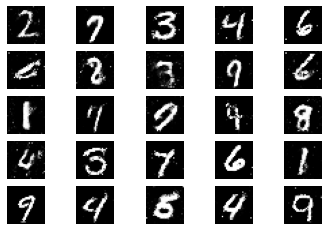

20001 [D loss: 0.709820, acc.: 54.69%] [G loss: 0.899653]
20002 [D loss: 0.660619, acc.: 60.16%] [G loss: 0.945490]
20003 [D loss: 0.643109, acc.: 61.72%] [G loss: 0.940044]
20004 [D loss: 0.619001, acc.: 64.84%] [G loss: 1.007882]
20005 [D loss: 0.698726, acc.: 55.47%] [G loss: 0.946772]
20006 [D loss: 0.713903, acc.: 53.91%] [G loss: 0.930315]
20007 [D loss: 0.642490, acc.: 57.81%] [G loss: 0.873110]
20008 [D loss: 0.641294, acc.: 65.62%] [G loss: 0.907366]
20009 [D loss: 0.719050, acc.: 50.78%] [G loss: 0.980981]
20010 [D loss: 0.666990, acc.: 62.50%] [G loss: 0.892434]
20011 [D loss: 0.719243, acc.: 46.09%] [G loss: 0.975082]
20012 [D loss: 0.652950, acc.: 63.28%] [G loss: 0.889975]
20013 [D loss: 0.671424, acc.: 59.38%] [G loss: 0.859288]
20014 [D loss: 0.706702, acc.: 53.12%] [G loss: 0.959770]
20015 [D loss: 0.674039, acc.: 60.16%] [G loss: 0.894625]
20016 [D loss: 0.633382, acc.: 67.97%] [G loss: 0.905535]
20017 [D loss: 0.645842, acc.: 59.38%] [G loss: 0.887729]
20018 [D loss:

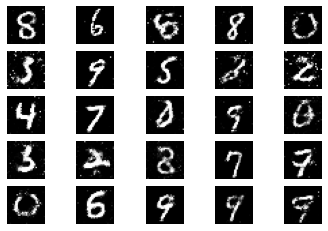

20101 [D loss: 0.680827, acc.: 58.59%] [G loss: 0.879342]
20102 [D loss: 0.659593, acc.: 60.16%] [G loss: 0.934067]
20103 [D loss: 0.668040, acc.: 60.16%] [G loss: 0.896379]
20104 [D loss: 0.666387, acc.: 57.81%] [G loss: 0.921611]
20105 [D loss: 0.693675, acc.: 60.94%] [G loss: 0.936165]
20106 [D loss: 0.683458, acc.: 57.81%] [G loss: 0.836430]
20107 [D loss: 0.642839, acc.: 60.16%] [G loss: 0.926437]
20108 [D loss: 0.678664, acc.: 58.59%] [G loss: 0.907508]
20109 [D loss: 0.675808, acc.: 58.59%] [G loss: 0.863964]
20110 [D loss: 0.674693, acc.: 57.81%] [G loss: 0.853447]
20111 [D loss: 0.595980, acc.: 69.53%] [G loss: 0.858455]
20112 [D loss: 0.656731, acc.: 67.97%] [G loss: 0.955360]
20113 [D loss: 0.675439, acc.: 54.69%] [G loss: 0.975960]
20114 [D loss: 0.693992, acc.: 56.25%] [G loss: 0.879655]
20115 [D loss: 0.626113, acc.: 62.50%] [G loss: 0.954553]
20116 [D loss: 0.644289, acc.: 63.28%] [G loss: 0.868589]
20117 [D loss: 0.630366, acc.: 59.38%] [G loss: 0.982794]
20118 [D loss:

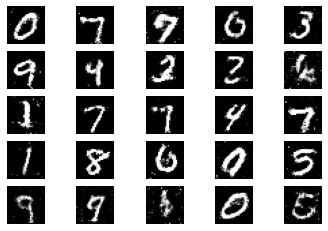

20201 [D loss: 0.687146, acc.: 55.47%] [G loss: 0.950351]
20202 [D loss: 0.621328, acc.: 69.53%] [G loss: 0.965486]
20203 [D loss: 0.645984, acc.: 61.72%] [G loss: 0.871339]
20204 [D loss: 0.654306, acc.: 64.06%] [G loss: 0.959275]
20205 [D loss: 0.710638, acc.: 52.34%] [G loss: 0.960189]
20206 [D loss: 0.649166, acc.: 62.50%] [G loss: 0.919428]
20207 [D loss: 0.668859, acc.: 60.94%] [G loss: 0.892782]
20208 [D loss: 0.625064, acc.: 69.53%] [G loss: 0.938248]
20209 [D loss: 0.640485, acc.: 64.06%] [G loss: 0.833067]
20210 [D loss: 0.637725, acc.: 58.59%] [G loss: 0.865790]
20211 [D loss: 0.613442, acc.: 66.41%] [G loss: 0.956358]
20212 [D loss: 0.649299, acc.: 60.94%] [G loss: 0.918061]
20213 [D loss: 0.663407, acc.: 57.03%] [G loss: 0.938707]
20214 [D loss: 0.694142, acc.: 54.69%] [G loss: 0.833204]
20215 [D loss: 0.602379, acc.: 68.75%] [G loss: 0.895149]
20216 [D loss: 0.671159, acc.: 57.03%] [G loss: 0.852132]
20217 [D loss: 0.655308, acc.: 60.94%] [G loss: 0.926954]
20218 [D loss:

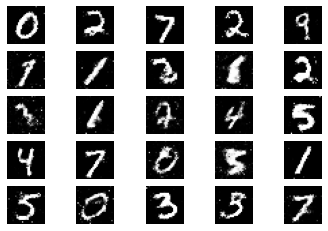

20301 [D loss: 0.611413, acc.: 64.06%] [G loss: 0.883711]
20302 [D loss: 0.664119, acc.: 63.28%] [G loss: 1.036363]
20303 [D loss: 0.645663, acc.: 60.94%] [G loss: 0.909494]
20304 [D loss: 0.682032, acc.: 57.81%] [G loss: 0.917845]
20305 [D loss: 0.619360, acc.: 64.06%] [G loss: 0.901992]
20306 [D loss: 0.606783, acc.: 71.09%] [G loss: 0.943913]
20307 [D loss: 0.667920, acc.: 60.16%] [G loss: 0.917563]
20308 [D loss: 0.671561, acc.: 60.16%] [G loss: 0.908327]
20309 [D loss: 0.662978, acc.: 62.50%] [G loss: 0.901722]
20310 [D loss: 0.652382, acc.: 53.91%] [G loss: 0.916389]
20311 [D loss: 0.661238, acc.: 59.38%] [G loss: 0.927790]
20312 [D loss: 0.701257, acc.: 60.16%] [G loss: 0.963089]
20313 [D loss: 0.642813, acc.: 67.19%] [G loss: 0.898504]
20314 [D loss: 0.684102, acc.: 57.03%] [G loss: 0.907361]
20315 [D loss: 0.631309, acc.: 64.06%] [G loss: 0.949693]
20316 [D loss: 0.696484, acc.: 52.34%] [G loss: 0.865129]
20317 [D loss: 0.639391, acc.: 57.81%] [G loss: 0.885547]
20318 [D loss:

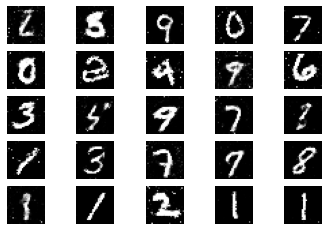

20401 [D loss: 0.660957, acc.: 63.28%] [G loss: 0.980378]
20402 [D loss: 0.635590, acc.: 63.28%] [G loss: 0.933274]
20403 [D loss: 0.669314, acc.: 64.06%] [G loss: 0.869810]
20404 [D loss: 0.626616, acc.: 64.06%] [G loss: 0.963940]
20405 [D loss: 0.669036, acc.: 57.03%] [G loss: 0.919330]
20406 [D loss: 0.657709, acc.: 60.16%] [G loss: 0.944625]
20407 [D loss: 0.640944, acc.: 58.59%] [G loss: 0.934936]
20408 [D loss: 0.609078, acc.: 66.41%] [G loss: 0.909559]
20409 [D loss: 0.697452, acc.: 53.12%] [G loss: 0.859605]
20410 [D loss: 0.642044, acc.: 61.72%] [G loss: 0.881181]
20411 [D loss: 0.647341, acc.: 58.59%] [G loss: 0.892530]
20412 [D loss: 0.690012, acc.: 56.25%] [G loss: 0.910939]
20413 [D loss: 0.665672, acc.: 57.81%] [G loss: 0.896364]
20414 [D loss: 0.668666, acc.: 56.25%] [G loss: 0.874216]
20415 [D loss: 0.678287, acc.: 56.25%] [G loss: 0.851744]
20416 [D loss: 0.659928, acc.: 61.72%] [G loss: 0.905288]
20417 [D loss: 0.658063, acc.: 60.16%] [G loss: 0.935876]
20418 [D loss:

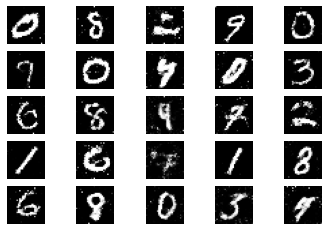

20501 [D loss: 0.620906, acc.: 64.84%] [G loss: 0.858316]
20502 [D loss: 0.684923, acc.: 55.47%] [G loss: 0.845373]
20503 [D loss: 0.614749, acc.: 68.75%] [G loss: 0.910925]
20504 [D loss: 0.676787, acc.: 62.50%] [G loss: 0.836330]
20505 [D loss: 0.694947, acc.: 52.34%] [G loss: 0.882813]
20506 [D loss: 0.620852, acc.: 67.97%] [G loss: 0.888391]
20507 [D loss: 0.664313, acc.: 60.94%] [G loss: 0.903733]
20508 [D loss: 0.674938, acc.: 62.50%] [G loss: 0.872714]
20509 [D loss: 0.675495, acc.: 56.25%] [G loss: 0.868788]
20510 [D loss: 0.628996, acc.: 67.19%] [G loss: 0.845945]
20511 [D loss: 0.687491, acc.: 53.91%] [G loss: 0.887252]
20512 [D loss: 0.632259, acc.: 62.50%] [G loss: 0.875939]
20513 [D loss: 0.709007, acc.: 53.12%] [G loss: 0.861766]
20514 [D loss: 0.703083, acc.: 56.25%] [G loss: 0.881766]
20515 [D loss: 0.627316, acc.: 67.19%] [G loss: 0.920644]
20516 [D loss: 0.668876, acc.: 59.38%] [G loss: 0.876471]
20517 [D loss: 0.651571, acc.: 63.28%] [G loss: 0.881526]
20518 [D loss:

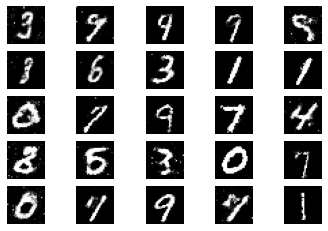

20601 [D loss: 0.636697, acc.: 61.72%] [G loss: 0.868713]
20602 [D loss: 0.649680, acc.: 66.41%] [G loss: 0.971855]
20603 [D loss: 0.643614, acc.: 62.50%] [G loss: 0.937394]
20604 [D loss: 0.717572, acc.: 50.78%] [G loss: 0.939695]
20605 [D loss: 0.649053, acc.: 57.81%] [G loss: 0.839918]
20606 [D loss: 0.678615, acc.: 58.59%] [G loss: 0.967300]
20607 [D loss: 0.691266, acc.: 54.69%] [G loss: 0.909780]
20608 [D loss: 0.617262, acc.: 67.97%] [G loss: 0.907795]
20609 [D loss: 0.670236, acc.: 56.25%] [G loss: 0.918684]
20610 [D loss: 0.618252, acc.: 65.62%] [G loss: 0.922350]
20611 [D loss: 0.659073, acc.: 58.59%] [G loss: 0.877072]
20612 [D loss: 0.653591, acc.: 60.94%] [G loss: 0.953001]
20613 [D loss: 0.669048, acc.: 60.94%] [G loss: 0.877024]
20614 [D loss: 0.678269, acc.: 59.38%] [G loss: 0.901070]
20615 [D loss: 0.655403, acc.: 67.19%] [G loss: 0.934477]
20616 [D loss: 0.650980, acc.: 61.72%] [G loss: 0.876778]
20617 [D loss: 0.638362, acc.: 66.41%] [G loss: 0.879376]
20618 [D loss:

In [ ]:
gan = GAN()
gan.train(epochs=30000, batch_size=64, sample_interval=100)

In [ ]:
plot_model(gan.discriminator)

In [ ]:
plot_model(gan.combined)